<a href="https://colab.research.google.com/github/ZohrehMohammadi/GRACE-Data/blob/main/GRACE_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Installing neccessary modules
!pip install netCDF4
!pip install numpy
!pip install xarray
!pip install matplotlib
!pip install pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 34.5 MB/s eta 0:00:00


In [ ]:
# Installing rarfile for extracting rar file(here Grace data file)
!pip install rarfile

In [ ]:
# Bringing the google drive folders into google colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd '/content/drive/MyDrive/Colab Notebooks/'

/content/drive/MyDrive/Colab Notebooks


In [ ]:
# Creating a command directory to the rar file(here Grace data file)
%cd '/content/drive/MyDrive/Colab Notebooks/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.rar'

[Errno 20] Not a directory: '/content/drive/MyDrive/Colab Notebooks/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.rar'
/content/drive/MyDrive/Colab Notebooks


In [ ]:
# Extracting rar file(here Grace data file)
import rarfile
import os

rar_file_path = "/content/drive/MyDrive/Colab Notebooks/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.rar"

extraction_directory = "/content/extracted_folder"
extraction_directory2 = "/content/drive/MyDrive/Colab Notebooks/extracted_folder"

with rarfile.RarFile(rar_file_path, 'r') as rar:
    rar.extractall(extraction_directory)
    rar.extractall(extraction_directory2)

extracted_files = os.listdir("/content/extracted_folder")
extracted_files = os.listdir("/content/drive/MyDrive/Colab Notebooks/extracted_folder")
print(extracted_files)


['CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc']


In [ ]:
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc','r')
print(nc_file)

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.6, ACDD-1.3, ISO 8601
    filename: netcdf/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc
    Metadata_Conventions: Unidata Dataset Discovery v1.0
    standard_name_vocabulary: NetCDF Climate and Forecast (CF) Metadata Convention-1.6
    title: CSR GRACE and GRACE-FO MASCON RL06Mv2
    subtitle: GRACE/GRACE-FO Total water storage with all correction applied
    summary: Monthly mass anomaly grids from GRACE and GRACE-FO determined from CSR RL06 processing
    keywords: Solid Earth, Geodetics/Gravity, Gravity, liquid_water_equivalent_thickness
    keywords_vocabulary: NASA Global Change Master Directory (GCMD) Science Keywords
    platform: GRACE and GRACE-FO
    institution: The University of Texas - Center for Space Research (CSR)
    creator_name: Himanshu Save
    creator_email: grace@csr.utexas.edu
    creator_url: http://www2.csr.utexas.edu/grace
    creator_type: gr

In [ ]:
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Precipitation.nc','r')
print(nc_file)

import xarray as xr
data = xr.open_dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Precipitation.nc')
#print(data)

print(data['latitude'])
print(data['longitude'])


<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    Conventions: CF-1.6
    history: 2023-10-24 22:30:03 GMT by grib_to_netcdf-2.24.0: /opt/ecmwf/eccodes/bin/grib_to_netcdf -S param -o /cache/tmp/8ed8547b-fc56-484a-a9f7-f5f8dd2a6f1f-adaptor.mars.internal-1698186601.8421812-14966-17-tmp.nc /cache/tmp/8ed8547b-fc56-484a-a9f7-f5f8dd2a6f1f-adaptor.mars.internal-1698186457.9721656-14966-15-tmp.grib
    dimensions(sizes): longitude(51), latitude(51), expver(2), time(261)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int32 expver(expver), int32 time(time), int16 tp(time, expver, latitude, longitude)
    groups: 
<xarray.DataArray 'latitude' (latitude: 51)>
array([48. , 47.9, 47.8, 47.7, 47.6, 47.5, 47.4, 47.3, 47.2, 47.1, 47. , 46.9,
       46.8, 46.7, 46.6, 46.5, 46.4, 46.3, 46.2, 46.1, 46. , 45.9, 45.8, 45.7,
       45.6, 45.5, 45.4, 45.3, 45.2, 45.1, 45. , 44.9, 44.8, 44.7, 44.6, 44.5,
       44.4,

In [ ]:
import netCDF4 as nc
import numpy as np


with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Precipitation.nc','r') as rootgrp:
    x=np.zeros((51,51,261))

    for i in range(261):
        for j in range(51):
            for k in range(51):
                     x[k][j][i]= rootgrp.variables['tp'][i,0,j:j+1,k:k+1]


xx=np.zeros((5,5,261))
sum=0
for i in range(261):
    for j in range(51):
        for k in range(51):
            sum=x[k][j][i]+sum
            if (j+1)%10==0 and (k+1)%10==0:
                 xx[int(((j+1)/10))-1][int(int((k+1)/10)-1)][i]=sum
                 sum=0


xxx=np.zeros((25,261))
for k in range(5):
    for j in range(5):
        for i in range(261):
            xxx[k][j]=xx[k][j][i]


print(xxx)


<ipython-input-30-0dd42a9726a0>:11: UserWarning: Warning: converting a masked element to nan.
  x[k][j][i]= rootgrp.variables['tp'][i,0,j:j+1,k:k+1]


[[nan nan nan ...  0.  0.  0.]
 [nan nan nan ...  0.  0.  0.]
 [nan nan nan ...  0.  0.  0.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]


In [ ]:
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Precipitation.nc','r')
print(nc_file)


with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Precipitation.nc','r') as rootgrp:
    print("Variables in the NetCDF file:")
    print(rootgrp.variables.keys())
    print("\nlwe_thickness:")
    print(rootgrp.variables['tp'][:,1,1])
    print(rootgrp.variables['expver'][:])

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    Conventions: CF-1.6
    history: 2023-10-24 22:30:03 GMT by grib_to_netcdf-2.24.0: /opt/ecmwf/eccodes/bin/grib_to_netcdf -S param -o /cache/tmp/8ed8547b-fc56-484a-a9f7-f5f8dd2a6f1f-adaptor.mars.internal-1698186601.8421812-14966-17-tmp.nc /cache/tmp/8ed8547b-fc56-484a-a9f7-f5f8dd2a6f1f-adaptor.mars.internal-1698186457.9721656-14966-15-tmp.grib
    dimensions(sizes): longitude(51), latitude(51), expver(2), time(261)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int32 expver(expver), int32 time(time), int16 tp(time, expver, latitude, longitude)
    groups: 
Variables in the NetCDF file:
dict_keys(['longitude', 'latitude', 'expver', 'time', 'tp'])

lwe_thickness:
[[-- -- -- ... -- -- --]
 [-- -- -- ... -- -- --]
 [-- -- -- ... -- -- --]
 ...
 [-- -- -- ... -- -- --]
 [-- -- -- ... 0.0003453345407566123 0.00029865614306019
  0.00025864608789182876]

In [ ]:
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Skin_Temperature.nc','r')
print(nc_file)

import xarray as xr
data = xr.open_dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Skin_Temperature.nc')
#print(data)

#print(data['latitude'])
#print(data['longitude'])
print(data['expver'])
with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Portland/Skin_Temperature.nc', 'r') as rootgrp:
    print("Variables in the NetCDF file:")
    print(rootgrp.variables.keys())
    print("\nlwe_thickness:")
    print(rootgrp.variables['skt'][:,0,50,50])


<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    Conventions: CF-1.6
    history: 2023-10-24 22:14:41 GMT by grib_to_netcdf-2.24.0: /opt/ecmwf/eccodes/bin/grib_to_netcdf -S param -o /cache/tmp/fb30703f-b605-46c9-b1c9-74f7317ff3f9-adaptor.mars.internal-1698185680.6995378-11294-9-tmp.nc /cache/tmp/fb30703f-b605-46c9-b1c9-74f7317ff3f9-adaptor.mars.internal-1698185549.6857593-11294-7-tmp.grib
    dimensions(sizes): longitude(51), latitude(51), expver(2), time(261)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int32 expver(expver), int32 time(time), int16 skt(time, expver, latitude, longitude)
    groups: 
<xarray.DataArray 'expver' (expver: 2)>
array([1, 5], dtype=int32)
Coordinates:
  * expver   (expver) int32 1 5
Attributes:
    long_name:  expver
Variables in the NetCDF file:
dict_keys(['longitude', 'latitude', 'expver', 'time', 'skt'])

lwe_thickness:
[271.46843571639835 275.5315440618002 28

In [ ]:
####  TEXAS  ********
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Skin_Temperature.nc','r')
print(nc_file)


with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Skin_Temperature.nc', 'r') as rootgrp:
    print("Variables in the NetCDF file:")
    print(rootgrp.variables.keys())
    print("\nlwe_thickness:")
    print(rootgrp.variables['skt'][100,0,:,:])

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    Conventions: CF-1.6
    history: 2023-10-24 22:54:05 GMT by grib_to_netcdf-2.24.0: /opt/ecmwf/eccodes/bin/grib_to_netcdf -S param -o /cache/tmp/67b5f33a-e84f-40ae-bd32-252c37713df1-adaptor.mars.internal-1698188044.7871518-26149-16-tmp.nc /cache/tmp/67b5f33a-e84f-40ae-bd32-252c37713df1-adaptor.mars.internal-1698187921.7545624-26149-14-tmp.grib
    dimensions(sizes): longitude(61), latitude(51), expver(2), time(261)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int32 expver(expver), int32 time(time), int16 skt(time, expver, latitude, longitude)
    groups: 
Variables in the NetCDF file:
dict_keys(['longitude', 'latitude', 'expver', 'time', 'skt'])

lwe_thickness:
[[304.55130432 304.00824389 303.70592973 ... 300.87775312 300.68436678
  300.16025032]
 [304.75810931 304.39106992 303.9245747  ... 300.61411623 300.91485173
  300.57701763]
 [304.78336

In [ ]:
########  SKIN TEMPERATURE   ###########
import netCDF4 as nc
import numpy as np


with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Skin_Temperature.nc','r') as rootgrp:
    x=np.zeros((51,51,261))
   # x_Temperature=np.zeros((51,51,261))

    for i in range(261):
        for j in range(51):
            for k in range(51):
               x[j][k][i]= rootgrp.variables['skt'][i,0,j:j+1,k:k+1]
               #x_Temperature[j][k][i]= rootgrp.variables['skt'][i,0,j:j+1,k:k+1]


<ipython-input-10-58f853290d5a>:13: UserWarning: Warning: converting a masked element to nan.
  x[j][k][i]= rootgrp.variables['skt'][i,0,j:j+1,k:k+1]


In [ ]:
########  SKIN TEMPERATURE   ###########   TEXAS ######

#*******************************************************************************
# Preparing data for downscaling one single pixel
number=0
x_Temperature=np.zeros((100,254))
for k in range(10):
    for j in range(10):
        for i in range(254):
          if (number<100):
            #print(number)
            x_Temperature[number][i]=x[k+41][j+31][i+3]
            #print(number)
        number=number+1

print(x_Temperature)
# ******************************************************************************

# changing a 25*25 matrix into a 5*5 matrix
xx=np.zeros((5,5,256))
sum=0
sum1=0
sum2=0
sum3=0
sum4=0
sum5=0
sum6=0
sum7=0
sum8=0
sum9=0
sum10=0
number=0
for i in range(256):
    for j in range(5):
        for k in range(5):
             sum1=x[10*j][10*k][i]+x[10*j][10*k+1][i]+x[10*j][10*k+2][i]+x[10*j][10*k+3][i]+x[10*j][10*k+4][i]+x[10*j][10*k+5][i]+x[10*j][10*k+6][i]+x[10*j][10*k+7][i]+x[10*j][10*k+8][i]+x[10*j][10*k+9][i]
             sum2=x[10*j+1][10*k][i]+x[10*j+1][10*k+1][i]+x[10*j+1][10*k+2][i]+x[10*j+1][10*k+3][i]+x[10*j+1][10*k+4][i]+x[10*j+1][10*k+5][i]+x[10*j+1][10*k+6][i]+x[10*j+1][10*k+7][i]+x[10*j+1][10*k+8][i]+x[10*j+1][10*k+9][i]
             sum3=x[10*j+2][10*k][i]+x[10*j+2][10*k+1][i]+x[10*j+2][10*k+2][i]+x[10*j+2][10*k+3][i]+x[10*j+2][10*k+4][i]+x[10*j+2][10*k+5][i]+x[10*j+2][10*k+6][i]+x[10*j+2][10*k+7][i]+x[10*j+2][10*k+8][i]+x[10*j+2][10*k+9][i]
             sum4=x[10*j+3][10*k][i]+x[10*j+3][10*k+1][i]+x[10*j+3][10*k+2][i]+x[10*j+3][10*k+3][i]+x[10*j+3][10*k+4][i]+x[10*j+3][10*k+5][i]+x[10*j+3][10*k+6][i]+x[10*j+3][10*k+7][i]+x[10*j+3][10*k+8][i]+x[10*j+3][10*k+9][i]
             sum5=x[10*j+4][10*k][i]+x[10*j+4][10*k+1][i]+x[10*j+4][10*k+2][i]+x[10*j+4][10*k+3][i]+x[10*j+4][10*k+4][i]+x[10*j+4][10*k+5][i]+x[10*j+4][10*k+6][i]+x[10*j+4][10*k+7][i]+x[10*j+4][10*k+8][i]+x[10*j+4][10*k+9][i]
             sum6=x[10*j+5][10*k][i]+x[10*j+5][10*k+1][i]+x[10*j+5][10*k+2][i]+x[10*j+5][10*k+3][i]+x[10*j+5][10*k+4][i]+x[10*j+5][10*k+5][i]+x[10*j+5][10*k+6][i]+x[10*j+5][10*k+7][i]+x[10*j+5][10*k+8][i]+x[10*j+5][10*k+9][i]
             sum7=x[10*j+6][10*k][i]+x[10*j+6][10*k+1][i]+x[10*j+6][10*k+2][i]+x[10*j+6][10*k+3][i]+x[10*j+6][10*k+4][i]+x[10*j+6][10*k+5][i]+x[10*j+6][10*k+6][i]+x[10*j+6][10*k+7][i]+x[10*j+6][10*k+8][i]+x[10*j+6][10*k+9][i]
             sum8=x[10*j+7][10*k][i]+x[10*j+7][10*k+1][i]+x[10*j+7][10*k+2][i]+x[10*j+7][10*k+3][i]+x[10*j+7][10*k+4][i]+x[10*j+7][10*k+5][i]+x[10*j+7][10*k+6][i]+x[10*j+7][10*k+7][i]+x[10*j+7][10*k+8][i]+x[10*j+7][10*k+9][i]
             sum9=x[10*j+8][10*k][i]+x[10*j+8][10*k+1][i]+x[10*j+8][10*k+2][i]+x[10*j+8][10*k+3][i]+x[10*j+8][10*k+4][i]+x[10*j+8][10*k+5][i]+x[10*j+8][10*k+6][i]+x[10*j+8][10*k+7][i]+x[10*j+8][10*k+8][i]+x[10*j+8][10*k+9][i]
             sum10=x[10*j+9][10*k][i]+x[10*j+9][10*k+1][i]+x[10*j+9][10*k+2][i]+x[10*j+9][10*k+3][i]+x[10*j+9][10*k+4][i]+x[10*j+9][10*k+5][i]+x[10*j+9][10*k+6][i]+x[10*j+9][10*k+7][i]+x[10*j+9][10*k+8][i]+x[10*j+9][10*k+9][i]
             sum=sum1+sum2+sum3+sum4+sum5+sum6+sum7+sum8+sum9+sum10
             xx[j][k][i]=sum/100

#print(number)
#print(xx)

# rowing the matrix in terms of time
xxx_skt=np.zeros((25,256))
number=0
for k in range(5):
    for j in range(5):
        for i in range(256):
            xxx_skt[number][i]=xx[k][j][i]
        #print(number)
        number=number+1

#print(xxx_skt[13][:])


[[300.29917276 302.69321676 305.85528081 ... 298.22638689 298.98572428
  301.93703669]
 [301.19506459 303.77539095 307.48840875 ... 299.5974566  299.74427235
  302.79425125]
 [301.47843479 304.22057421 308.2343275  ... 300.20445291 299.96686398
  303.22206921]
 ...
 [304.42737919 308.90604904 313.04293813 ... 303.65225515 302.0309672
  304.16532096]
 [304.37528328 308.69135074 312.97663424 ... 303.48254877 301.73575702
  304.17084629]
 [304.1834756  308.43955382 312.81245319 ... 303.24969583 301.35529899
  304.04218517]]


In [ ]:
import math

with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Skin_Temperature.nc','r') as rootgrp:
    x=np.zeros((51,51,261))
    number=0

    for i in range(261):
        for j in range(51):
            for k in range(51):
              x[j][k][i]= rootgrp.variables['skt'][i,0,j:j+1,k:k+1]
              if math.isnan(rootgrp.variables['skt'][i,0,j:j+1,k:k+1]):
                 number=number+1


print(number)

In [ ]:
####  TEXAS  ********   SOIL WATER VOLUME  ***********
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Soil_Water_Volume.nc','r')
print(nc_file)

with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Soil_Water_Volume.nc', 'r') as rootgrp:
    print("Variables in the NetCDF file:")
    print(rootgrp.variables.keys())
    print("\nlwe_thickness:")
    print(rootgrp.variables['swvl1'][:,0,0,1])

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    Conventions: CF-1.6
    history: 2023-10-24 23:01:54 GMT by grib_to_netcdf-2.24.0: /opt/ecmwf/eccodes/bin/grib_to_netcdf -S param -o /cache/tmp/e91f000f-9e86-42bc-a590-f124f7aeb5c8-adaptor.mars.internal-1698188511.0325332-23855-14-tmp.nc /cache/tmp/e91f000f-9e86-42bc-a590-f124f7aeb5c8-adaptor.mars.internal-1698188136.055142-23855-12-tmp.grib
    dimensions(sizes): longitude(61), latitude(51), expver(2), time(261)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int32 expver(expver), int32 time(time), int16 src(time, expver, latitude, longitude), int16 swvl1(time, expver, latitude, longitude), int16 swvl2(time, expver, latitude, longitude), int16 swvl3(time, expver, latitude, longitude), int16 swvl4(time, expver, latitude, longitude)
    groups: 
Variables in the NetCDF file:
dict_keys(['longitude', 'latitude', 'expver', 'time', 'src', 'swvl1', 's

In [ ]:
########  SOIL WATER VOLUME   ###########
import netCDF4 as nc
import numpy as np

with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Soil_Water_Volume.nc','r') as rootgrp:
    x1=np.zeros((51,51,261))

    x2=np.zeros((51,51,261))

    x3=np.zeros((51,51,261))

    x4=np.zeros((51,51,261))

    for i in range(261):
        for j in range(51):
            for k in range(51):
               x1[j][k][i]= rootgrp.variables['swvl1'][i,0,j:j+1,k:k+1]

               x2[j][k][i]= rootgrp.variables['swvl2'][i,0,j:j+1,k:k+1]

               x3[j][k][i]= rootgrp.variables['swvl3'][i,0,j:j+1,k:k+1]

               x4[j][k][i]= rootgrp.variables['swvl4'][i,0,j:j+1,k:k+1]


<ipython-input-13-066f9321554e>:21: UserWarning: Warning: converting a masked element to nan.
  x1[j][k][i]= rootgrp.variables['swvl1'][i,0,j:j+1,k:k+1]
<ipython-input-13-066f9321554e>:24: UserWarning: Warning: converting a masked element to nan.
  x2[j][k][i]= rootgrp.variables['swvl2'][i,0,j:j+1,k:k+1]
<ipython-input-13-066f9321554e>:27: UserWarning: Warning: converting a masked element to nan.
  x3[j][k][i]= rootgrp.variables['swvl3'][i,0,j:j+1,k:k+1]
<ipython-input-13-066f9321554e>:30: UserWarning: Warning: converting a masked element to nan.
  x4[j][k][i]= rootgrp.variables['swvl4'][i,0,j:j+1,k:k+1]


In [ ]:
########  SOIL WATER VOLUME   ###########   TEXAS ######

x=np.zeros((51,51,256))

for i in range(256):
        for j in range(51):
            for k in range(51):
                x[j][k][i]=x1[j][k][i]+x2[j][k][i]+x3[j][k][i]+x4[j][k][i]


#*******************************************************************************
# Preparing data for downscaling one single pixel
number=0
x_Soil_Water=np.zeros((100,254))
for k in range(10):
    for j in range(10):
        for i in range(254):
          if (number<100):
            #print(number)
            x_Soil_Water[number][i]=x1[k+41][j+31][i+3]+x2[k+41][j+31][i+3]+x3[k+41][j+31][i+3]+x4[k+41][j+31][i]
            #print(number)
        number=number+1


print(x_Soil_Water)
#*******************************************************************************


# changing a 25*25 matrix into a 5*5 matrix
xx=np.zeros((5,5,256))
sum=0
sum1=0
sum2=0
sum3=0
sum4=0
sum5=0
sum6=0
sum7=0
sum8=0
sum9=0
sum10=0
number=0
for i in range(256):
    for j in range(5):
        for k in range(5):
             sum1=x[10*j][10*k][i]+x[10*j][10*k+1][i]+x[10*j][10*k+2][i]+x[10*j][10*k+3][i]+x[10*j][10*k+4][i]+x[10*j][10*k+5][i]+x[10*j][10*k+6][i]+x[10*j][10*k+7][i]+x[10*j][10*k+8][i]+x[10*j][10*k+9][i]
             sum2=x[10*j+1][10*k][i]+x[10*j+1][10*k+1][i]+x[10*j+1][10*k+2][i]+x[10*j+1][10*k+3][i]+x[10*j+1][10*k+4][i]+x[10*j+1][10*k+5][i]+x[10*j+1][10*k+6][i]+x[10*j+1][10*k+7][i]+x[10*j+1][10*k+8][i]+x[10*j+1][10*k+9][i]
             sum3=x[10*j+2][10*k][i]+x[10*j+2][10*k+1][i]+x[10*j+2][10*k+2][i]+x[10*j+2][10*k+3][i]+x[10*j+2][10*k+4][i]+x[10*j+2][10*k+5][i]+x[10*j+2][10*k+6][i]+x[10*j+2][10*k+7][i]+x[10*j+2][10*k+8][i]+x[10*j+2][10*k+9][i]
             sum4=x[10*j+3][10*k][i]+x[10*j+3][10*k+1][i]+x[10*j+3][10*k+2][i]+x[10*j+3][10*k+3][i]+x[10*j+3][10*k+4][i]+x[10*j+3][10*k+5][i]+x[10*j+3][10*k+6][i]+x[10*j+3][10*k+7][i]+x[10*j+3][10*k+8][i]+x[10*j+3][10*k+9][i]
             sum5=x[10*j+4][10*k][i]+x[10*j+4][10*k+1][i]+x[10*j+4][10*k+2][i]+x[10*j+4][10*k+3][i]+x[10*j+4][10*k+4][i]+x[10*j+4][10*k+5][i]+x[10*j+4][10*k+6][i]+x[10*j+4][10*k+7][i]+x[10*j+4][10*k+8][i]+x[10*j+4][10*k+9][i]
             sum6=x[10*j+5][10*k][i]+x[10*j+5][10*k+1][i]+x[10*j+5][10*k+2][i]+x[10*j+5][10*k+3][i]+x[10*j+5][10*k+4][i]+x[10*j+5][10*k+5][i]+x[10*j+5][10*k+6][i]+x[10*j+5][10*k+7][i]+x[10*j+5][10*k+8][i]+x[10*j+5][10*k+9][i]
             sum7=x[10*j+6][10*k][i]+x[10*j+6][10*k+1][i]+x[10*j+6][10*k+2][i]+x[10*j+6][10*k+3][i]+x[10*j+6][10*k+4][i]+x[10*j+6][10*k+5][i]+x[10*j+6][10*k+6][i]+x[10*j+6][10*k+7][i]+x[10*j+6][10*k+8][i]+x[10*j+6][10*k+9][i]
             sum8=x[10*j+7][10*k][i]+x[10*j+7][10*k+1][i]+x[10*j+7][10*k+2][i]+x[10*j+7][10*k+3][i]+x[10*j+7][10*k+4][i]+x[10*j+7][10*k+5][i]+x[10*j+7][10*k+6][i]+x[10*j+7][10*k+7][i]+x[10*j+7][10*k+8][i]+x[10*j+7][10*k+9][i]
             sum9=x[10*j+8][10*k][i]+x[10*j+8][10*k+1][i]+x[10*j+8][10*k+2][i]+x[10*j+8][10*k+3][i]+x[10*j+8][10*k+4][i]+x[10*j+8][10*k+5][i]+x[10*j+8][10*k+6][i]+x[10*j+8][10*k+7][i]+x[10*j+8][10*k+8][i]+x[10*j+8][10*k+9][i]
             sum10=x[10*j+9][10*k][i]+x[10*j+9][10*k+1][i]+x[10*j+9][10*k+2][i]+x[10*j+9][10*k+3][i]+x[10*j+9][10*k+4][i]+x[10*j+9][10*k+5][i]+x[10*j+9][10*k+6][i]+x[10*j+9][10*k+7][i]+x[10*j+9][10*k+8][i]+x[10*j+9][10*k+9][i]
             sum=(sum1+sum2+sum3+sum4+sum5+sum6+sum7+sum8+sum9+sum10)/100
             xx[j][k][i]=sum

#print(number)
#print(xx)

# rowing the matrix in terms of time
xxx_swvl=np.zeros((25,256))
number=0
for k in range(5):
    for j in range(5):
        for i in range(256):
            xxx_swvl[number][i]=xx[k][j][i]
        #print(number)
        number=number+1


#print(xxx_swvl[5][:])

mean_swvl=np.mean(xxx_swvl, axis=1)
std_swvl = np.std(xxx_swvl, axis=1)
print(mean_swvl)
print(std_swvl)




[[1.25926227 1.22191652 1.16592151 ... 1.14890193 1.19961689 1.26900526]
 [1.22007463 1.18652649 1.13536976 ... 1.11389124 1.18038664 1.24250466]
 [1.22624795 1.18994553 1.1386665  ... 1.11496818 1.19162054 1.24560634]
 ...
 [1.2998809  1.18834297 1.16515709 ... 1.16418447 1.25938193 1.42966646]
 [1.3030038  1.19700555 1.16752378 ... 1.16935372 1.27711402 1.43177497]
 [1.31176646 1.19930801 1.16449269 ... 1.17642997 1.3006824  1.43757325]]
[0.55819077 0.74088047 0.75572649 0.79500064 0.88504261 0.44568333
 0.74358192 0.76006646 0.78980511 0.85906949 0.51638526 0.73065301
 0.99740917 0.99469127 1.17185315 0.66352472 0.7227641  1.21212339
 1.22014298 1.12167617 0.568561   0.71659673 1.21779236 1.30131395
 1.27082155]
[0.10981452 0.11784122 0.1209069  0.13550713 0.15982849 0.10017021
 0.11657252 0.12182597 0.13622128 0.15952237 0.08424828 0.10466348
 0.11596029 0.13692631 0.15623632 0.08079987 0.10042156 0.11105
 0.12620243 0.15304949 0.06641076 0.08958279 0.11107344 0.14425751
 0.1678951

In [ ]:
####  TEXAS  ********   TOTAL PRECIPITATION  ***********
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Total_Precipitation.nc','r')
print(nc_file)

with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Total_Precipitation.nc', 'r') as rootgrp:
    print("Variables in the NetCDF file:")
    print(rootgrp.variables.keys())
    print("\nlwe_thickness:")
    print(rootgrp.variables['tp'][:,0,0,1])


<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    Conventions: CF-1.6
    history: 2023-10-24 23:05:48 GMT by grib_to_netcdf-2.24.0: /opt/ecmwf/eccodes/bin/grib_to_netcdf -S param -o /cache/tmp/65dd9f64-87f2-415c-b6c5-eb46af843922-adaptor.mars.internal-1698188747.4541914-25038-27-tmp.nc /cache/tmp/65dd9f64-87f2-415c-b6c5-eb46af843922-adaptor.mars.internal-1698188614.679967-25038-25-tmp.grib
    dimensions(sizes): longitude(61), latitude(51), expver(2), time(261)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int32 expver(expver), int32 time(time), int16 tp(time, expver, latitude, longitude)
    groups: 
Variables in the NetCDF file:
dict_keys(['longitude', 'latitude', 'expver', 'time', 'tp'])

lwe_thickness:
[0.0009349104710312597 0.0002456826643469894 0.0013019019005644427
 0.000731026343512825 0.00025687142744251247 0.001863826447139642
 0.001646018525546777 0.001537363203930245 0.0007834892

In [ ]:
####  TEXAS  ********   TOTAL PRECIPITATION  ***********
import netCDF4 as nc
import numpy as np


with nc.Dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Total_Precipitation.nc','r') as rootgrp:
    x=np.zeros((51,51,261))
    #x_Precipitation=np.zeros((51,51,261))
    for i in range(261):
        for j in range(51):
            for k in range(51):
               x[j][k][i]= rootgrp.variables['tp'][i,0,j:j+1,k:k+1]
              # x_Precipitation[j][k][i]=rootgrp.variables['tp'][i,0,j:j+1,k:k+1]


<ipython-input-16-9dfdef456c10>:12: UserWarning: Warning: converting a masked element to nan.
  x[j][k][i]= rootgrp.variables['tp'][i,0,j:j+1,k:k+1]


In [ ]:
########  TOTAL PRECIPITATION   ###########   TEXAS ######


#*******************************************************************************
# Preparing data for downscaling one single pixel
number=0
x_Precipitation=np.zeros((100,254))
for k in range(10):
    for j in range(10):
        for i in range(254):
          if (number<100):
            #print(number)
            x_Precipitation[number][i]=x[k+41][j+31][i+3]
            #print(number)
        number=number+1


#*******************************************************************************


# changing a 25*25 matrix into a 5*5 matrix
xx=np.zeros((5,5,256))
sum=0
sum1=0
sum2=0
sum3=0
sum4=0
sum5=0
sum6=0
sum7=0
sum8=0
sum9=0
sum10=0
number=0
for i in range(256):
    for j in range(5):
        for k in range(5):
             sum1=x[10*j][10*k][i]+x[10*j][10*k+1][i]+x[10*j][10*k+2][i]+x[10*j][10*k+3][i]+x[10*j][10*k+4][i]+x[10*j][10*k+5][i]+x[10*j][10*k+6][i]+x[10*j][10*k+7][i]+x[10*j][10*k+8][i]+x[10*j][10*k+9][i]
             sum2=x[10*j+1][10*k][i]+x[10*j+1][10*k+1][i]+x[10*j+1][10*k+2][i]+x[10*j+1][10*k+3][i]+x[10*j+1][10*k+4][i]+x[10*j+1][10*k+5][i]+x[10*j+1][10*k+6][i]+x[10*j+1][10*k+7][i]+x[10*j+1][10*k+8][i]+x[10*j+1][10*k+9][i]
             sum3=x[10*j+2][10*k][i]+x[10*j+2][10*k+1][i]+x[10*j+2][10*k+2][i]+x[10*j+2][10*k+3][i]+x[10*j+2][10*k+4][i]+x[10*j+2][10*k+5][i]+x[10*j+2][10*k+6][i]+x[10*j+2][10*k+7][i]+x[10*j+2][10*k+8][i]+x[10*j+2][10*k+9][i]
             sum4=x[10*j+3][10*k][i]+x[10*j+3][10*k+1][i]+x[10*j+3][10*k+2][i]+x[10*j+3][10*k+3][i]+x[10*j+3][10*k+4][i]+x[10*j+3][10*k+5][i]+x[10*j+3][10*k+6][i]+x[10*j+3][10*k+7][i]+x[10*j+3][10*k+8][i]+x[10*j+3][10*k+9][i]
             sum5=x[10*j+4][10*k][i]+x[10*j+4][10*k+1][i]+x[10*j+4][10*k+2][i]+x[10*j+4][10*k+3][i]+x[10*j+4][10*k+4][i]+x[10*j+4][10*k+5][i]+x[10*j+4][10*k+6][i]+x[10*j+4][10*k+7][i]+x[10*j+4][10*k+8][i]+x[10*j+4][10*k+9][i]
             sum6=x[10*j+5][10*k][i]+x[10*j+5][10*k+1][i]+x[10*j+5][10*k+2][i]+x[10*j+5][10*k+3][i]+x[10*j+5][10*k+4][i]+x[10*j+5][10*k+5][i]+x[10*j+5][10*k+6][i]+x[10*j+5][10*k+7][i]+x[10*j+5][10*k+8][i]+x[10*j+5][10*k+9][i]
             sum7=x[10*j+6][10*k][i]+x[10*j+6][10*k+1][i]+x[10*j+6][10*k+2][i]+x[10*j+6][10*k+3][i]+x[10*j+6][10*k+4][i]+x[10*j+6][10*k+5][i]+x[10*j+6][10*k+6][i]+x[10*j+6][10*k+7][i]+x[10*j+6][10*k+8][i]+x[10*j+6][10*k+9][i]
             sum8=x[10*j+7][10*k][i]+x[10*j+7][10*k+1][i]+x[10*j+7][10*k+2][i]+x[10*j+7][10*k+3][i]+x[10*j+7][10*k+4][i]+x[10*j+7][10*k+5][i]+x[10*j+7][10*k+6][i]+x[10*j+7][10*k+7][i]+x[10*j+7][10*k+8][i]+x[10*j+7][10*k+9][i]
             sum9=x[10*j+8][10*k][i]+x[10*j+8][10*k+1][i]+x[10*j+8][10*k+2][i]+x[10*j+8][10*k+3][i]+x[10*j+8][10*k+4][i]+x[10*j+8][10*k+5][i]+x[10*j+8][10*k+6][i]+x[10*j+8][10*k+7][i]+x[10*j+8][10*k+8][i]+x[10*j+8][10*k+9][i]
             sum10=x[10*j+9][10*k][i]+x[10*j+9][10*k+1][i]+x[10*j+9][10*k+2][i]+x[10*j+9][10*k+3][i]+x[10*j+9][10*k+4][i]+x[10*j+9][10*k+5][i]+x[10*j+9][10*k+6][i]+x[10*j+9][10*k+7][i]+x[10*j+9][10*k+8][i]+x[10*j+9][10*k+9][i]
             sum=sum1+sum2+sum3+sum4+sum5+sum6+sum7+sum8+sum9+sum10
             xx[j][k][i]=sum

#print(number)
#print(xx)

# rowing the matrix in terms of time
xxx_tp=np.zeros((25,256))
number=0
for k in range(5):
    for j in range(5):
        for i in range(256):
            xxx_tp[number][i]=xx[k][j][i]
        #print(number)
        number=number+1



print(xxx_tp[13][:])


[0.10028014 0.15282754 0.23100791 0.10735765 0.17109034 0.08741306
 0.79608445 0.02236135 0.14760015 0.45907667 0.06420732 0.19990364
 0.04291659 0.1206054  0.12149776 0.10922245 0.16004852 0.37873514
 0.07371553 0.0673986  0.27079465 0.23158972 0.09688472 0.02114749
 0.09502565 0.27420399 0.22833653 0.30257372 0.12034134 0.42685975
 0.10105366 0.15955995 0.0849948  0.29917557 0.5296616  0.04299168
 0.10956731 0.22568877 0.23143507 0.02891498 0.38653122 0.17368613
 0.11080131 0.17896325 0.08598289 0.16965942 0.00564658 0.01801041
 0.04924148 0.07254867 0.14943685 0.38059521 0.19190393 0.03726677
 0.03315999 0.06595476 0.19028106 0.13755488 0.10601823 0.09967172
 0.19441071 0.0487631  0.42784585 0.17815219 0.39476043 0.54282705
 0.26436932 0.17210379 0.18598209 0.06720342 0.07571857 0.10756775
 0.04072956 0.0921203  0.38925929 0.23340429 0.12020012 0.09215287
 0.02982972 0.29872628 0.05253396 0.07232191 0.01962383 0.01237525
 0.03740277 0.0458749  0.16677496 0.42610289 0.1835688  0.0809

In [ ]:
# PREPARING GRACE DATA FOR VARIOUS MODELS

import pandas as pd
import numpy as np


number=0
x=np.zeros((20,20,221),dtype=float)
#print(len(x))
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:

    for i in range(221):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for j in np.arange(476,496):
            for k in np.arange(1028,1048):
                x[j-476][k-1028][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]


#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((20,20,254),dtype=float)
counter_1=0
counter_2=0
for i in range(254):
       if  counter_1< len(Missed_values):
           if i== int(Missed_values[counter_1]):
               for j in range(20):
                   for k in range(20):
                     xxx[j][k][i]= (xxx[j][k][i-1]+ xxx[j][k][i-2])/2
               counter_1=counter_1+1
               #print(counter_1)
           else:
               for j in range(20):
                   for k in range(20):
                      xxx[j][k][i]=x[j][k][counter_2]
               counter_2= counter_2+1
               #print(counter_2)
       else:
           for j in range(20):
               for k in range(20):
                  xxx[j][k][i]=x[j][k][counter_2]
           counter_2= counter_2+1
           #print(counter_2)


xxx1=np.zeros((5,5,254),dtype=float)
sum1=0
sum2=0
sum3=0
sum4=0
sum=0
for i in range(254):
    for j in range(5):
        for k in range(5):
           sum1=xxx[4*j][4*k][i]+xxx[4*j][4*k+1][i]+xxx[4*j][4*k+2][i]+xxx[4*j][4*k+3][i]
           sum2=xxx[4*j+1][4*k][i]+xxx[4*j+1][4*k+1][i]+xxx[4*j+1][4*k+2][i]+xxx[4*j+1][4*k+3][i]
           sum3=xxx[4*j+2][4*k][i]+xxx[4*j+2][4*k+1][i]+xxx[4*j+2][4*k+2][i]+xxx[4*j+2][4*k+3][i]
           sum4=xxx[4*j+3][4*k][i]+xxx[4*j+3][4*k+1][i]+xxx[4*j+3][4*k+2][i]+xxx[4*j+3][4*k+3][i]
           sum=sum1+sum2+sum3+sum4
           xxx1[j][k][i]=sum/16


# rowing the matrix in terms of time
xxx_Grace=np.zeros((25,254),dtype=float)
number=0
for k in range(5):
    for j in range(5):
        for i in range(254):
            xxx_Grace[number][i]=xxx1[4-k][j][i]
        #print(number)
        number=number+1


mean_Grace=np.mean(xxx_Grace, axis=1)
std_Grace = np.std(xxx_Grace, axis=1)

print(xxx_Grace)

[[  1.94586124   2.05981749   2.00283936 ... -15.18953049 -22.19598275
  -17.29210114]
 [  3.67886221   3.09720173   3.38803197 ... -12.35161495 -18.32506597
  -16.67337573]
 [  6.58104472   5.2540224    5.91753356 ...  -7.576666   -12.88043052
  -13.04457909]
 ...
 [ -2.17259212  -2.58373411  -2.37816311 ...  -3.80021465  -5.46960866
   -4.31071255]
 [ -2.1631214   -2.89900261  -2.53106201 ...  -3.40040584  -5.13799283
   -3.90942845]
 [ -1.14745562  -2.62187086  -1.88466324 ...  -2.55378997  -4.56415659
   -3.36006725]]


In [ ]:
#### Texas
####   ****** Classification  $$ SWVL $$ //// K-MEANS ******
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

x_swvl=np.zeros((25,1))
Kmeans_swvl=np.zeros((25,254))
for i in range(25):
    x_swvl=np.zeros((254,1))
    x_swvl=xxx_swvl[i][2:257]
    kmeans = KMeans(n_clusters=5, random_state=42)
    kmeans.fit(x_swvl.reshape(-1,1))

    cluster_labels = kmeans.labels_
    for j in range(254):
        Kmeans_swvl[i][j]=cluster_labels[j]

print(Kmeans_swvl[1][:])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[2. 1. 0. 0. 0. 4. 4. 2. 1. 1. 2. 2. 0. 0. 0. 2. 4. 4. 0. 0. 0. 4. 2. 1.
 3. 1. 0. 0. 2. 2. 0. 3. 3. 3. 3. 3. 3. 2. 2. 2. 0. 2. 4. 2. 4. 4. 4. 4.
 2. 0. 0. 4. 4. 0. 1. 1. 2. 1. 3. 3. 3. 3. 3. 1. 2. 2. 2. 4. 4. 1. 2. 0.
 0. 0. 0. 4. 4. 0. 2. 1. 0. 0. 4. 0. 4. 0. 2. 0. 0. 4. 2. 2. 0. 2. 2. 3.
 3. 1. 1. 2. 1. 0. 0. 0. 0. 4. 4. 0. 4. 4. 4. 4. 4. 4. 4. 0. 0. 1. 1. 2.
 2. 4. 0. 4. 4. 4. 4. 0. 4. 4. 0. 2. 0. 4. 4. 4. 0. 4. 4. 0. 4. 2. 0. 0.
 4. 4. 0. 2. 4. 4. 1. 2. 2. 2. 1. 1. 2. 2. 1. 1. 0. 4. 4. 2. 1. 1. 1. 2.
 0. 0. 0. 0. 4. 0. 2. 0. 1. 2. 2. 2. 0. 2. 4. 0. 4. 0. 0. 1. 0. 0. 4. 4.
 4. 4. 4. 4. 4. 4. 0. 3. 1. 1. 1. 2. 2. 2. 1. 2. 4. 4. 4. 4. 2. 2. 2. 2.
 1. 0. 4. 4. 4. 4. 4. 4. 4. 4. 2. 0. 0. 4. 2. 2. 2. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 0. 0. 0. 0. 2. 0. 0. 4. 4.]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
#### Texas
####   ****** Classification  $$ TP $$ //// K-MEANS ******
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

x_tp=np.zeros((25,1))
Kmeans_tp=np.zeros((25,254))
for i in range(25):
    x_tp=np.zeros((254,1))
    x_tp=xxx_tp[i][2:257]
    kmeans = KMeans(n_clusters=10, random_state=42)
    kmeans.fit(x_tp.reshape(-1,1))

    cluster_labels = kmeans.labels_
    for j in range(254):
        Kmeans_tp[i][j]=cluster_labels[j]

print(Kmeans_tp[1][:])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[8. 8. 6. 9. 8. 2. 2. 5. 6. 4. 0. 6. 6. 9. 9. 5. 0. 9. 6. 2. 2. 0. 9. 1.
 8. 1. 0. 5. 8. 4. 1. 5. 3. 6. 4. 9. 2. 6. 4. 9. 4. 1. 0. 4. 0. 0. 0. 6.
 1. 6. 4. 6. 6. 1. 7. 5. 0. 8. 9. 6. 7. 9. 3. 1. 9. 1. 4. 0. 6. 4. 0. 2.
 2. 4. 8. 6. 2. 8. 1. 1. 0. 0. 0. 6. 6. 1. 2. 8. 1. 6. 8. 8. 0. 9. 9. 8.
 1. 7. 9. 1. 5. 6. 9. 2. 6. 0. 0. 2. 0. 0. 6. 0. 0. 0. 2. 8. 9. 4. 6. 2.
 9. 6. 4. 2. 2. 6. 8. 0. 0. 6. 2. 1. 0. 0. 6. 9. 8. 0. 6. 2. 6. 2. 0. 2.
 0. 0. 5. 4. 2. 6. 3. 6. 9. 6. 4. 6. 2. 8. 3. 8. 9. 0. 6. 7. 4. 9. 6. 6.
 0. 4. 8. 9. 0. 1. 4. 2. 8. 6. 9. 2. 4. 4. 6. 4. 6. 8. 5. 2. 0. 0. 0. 0.
 2. 6. 9. 2. 6. 2. 1. 3. 0. 9. 0. 0. 9. 5. 7. 2. 6. 2. 9. 6. 4. 6. 2. 2.
 5. 0. 9. 9. 6. 6. 2. 2. 0. 6. 9. 6. 6. 9. 7. 8. 8. 2. 6. 6. 0. 0. 0. 0.
 0. 0. 4. 4. 0. 5. 0. 8. 2. 0. 6. 0. 0. 6.]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1623: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
<ipython-input-52-2c761d3a84ad>:37: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1623: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
<ipython-input-52-2c761d3a84ad>:37: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)
/usr/loc

mse
[[562.28623427]
 [499.36911241]
 [539.8151981 ]
 [611.64019464]
 [458.94038592]
 [297.05365151]
 [377.91260384]
 [320.42468829]
 [536.47567979]
 [590.86026539]
 [167.58280768]
 [256.82126829]
 [299.85668994]
 [405.43466541]
 [591.98640458]
 [167.7149371 ]
 [233.38832319]
 [250.30241304]
 [308.36230858]
 [382.05015621]
 [108.62623823]
 [155.41570388]
 [221.20151786]
 [185.69820732]
 [220.06421286]]
r2
[[0.89236429]
 [0.9025494 ]
 [0.90340056]
 [0.89696414]
 [0.92721547]
 [0.88826829]
 [0.87556924]
 [0.90926609]
 [0.89946571]
 [0.91161062]
 [0.87584256]
 [0.85041993]
 [0.89289711]
 [0.90411221]
 [0.91080904]
 [0.83005002]
 [0.80495328]
 [0.88222048]
 [0.91013102]
 [0.93293801]
 [0.87107136]
 [0.8389127 ]
 [0.86217259]
 [0.9246143 ]
 [0.94083665]]
mae
[[17.91894527]
 [18.0264238 ]
 [18.71212177]
 [19.60834161]
 [17.24938168]
 [13.58055744]
 [16.12651525]
 [13.75053882]
 [18.28276505]
 [19.0915133 ]
 [10.22723436]
 [12.59692647]
 [13.6934025 ]
 [15.84265625]
 [19.12740663]
 [10.3433878

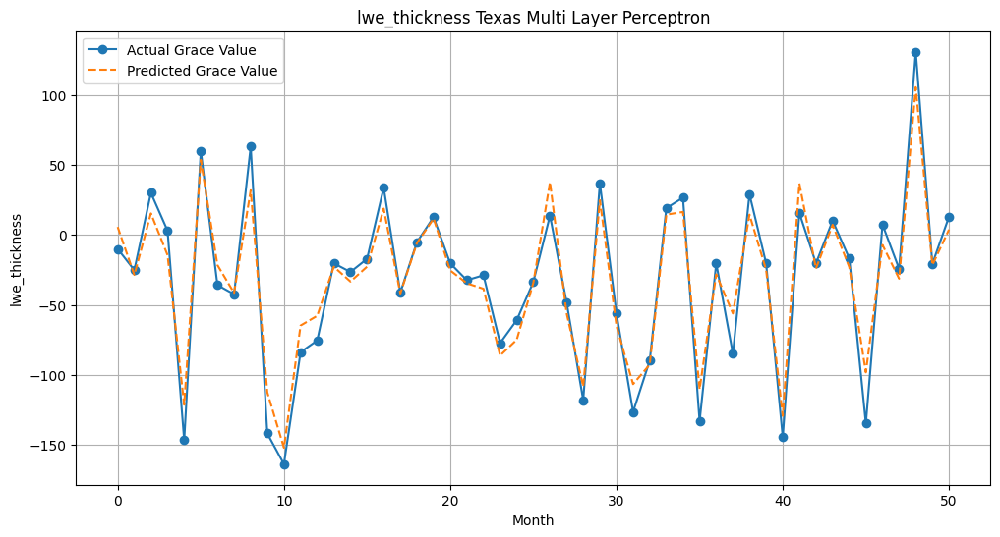

In [ ]:
##### *****  MULTI LAYER PERCEPTRON   **********
###### ******  TEXAS  **********
import numpy as np
from sklearn.neural_network import MLPRegressor
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

mse=np.zeros((25,1))
r2=np.zeros((25,1))
mae=np.zeros((25,1))
Grace_Random_FOREST=np.zeros((25,254))
for i in range(25):
    X=np.zeros((254,4))
    Y=np.zeros((254,1))
    for j in range(254):
           X[j][0]=(xxx_tp[i][j+2])*730
           X[j][1]=xxx_skt[i][j+2]
           X[j][2]=xxx_swvl[i][j+2]
           X[j][3]=Kmeans_swvl[i][j]
          # X[j][4]=Kmeans_tp[i][j]
           Y[j][0]=xxx_Grace[i][j]*10


    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

    mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
    mlp.fit(X_train, y_train)

    y_pred = mlp.predict(X_test)

    regressor = RandomForestRegressor(n_estimators=100, random_state=42)
    regressor.fit(X,Y)
    y_pred = regressor.predict(X_test)
   # Grace_Random_FOREST[i][:]=regressor.predict(X)

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)


print('mse')
print(mse)
print('r2')
print(r2)
print('mae')
print(mae)

plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Grace Value', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='Predicted Grace Value', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Texas Multi Layer Perceptron')
plt.grid(True)
plt.show()


mse
[[454.5583013 ]
 [299.37784886]
 [299.3471167 ]
 [335.49123105]
 [460.04540921]
 [294.08944359]
 [224.96389703]
 [226.09899783]
 [354.97601931]
 [496.14125678]
 [178.94155846]
 [170.22764086]
 [150.14695317]
 [248.81857484]
 [531.3020542 ]
 [ 93.0120336 ]
 [112.92657434]
 [145.71692032]
 [264.87385817]
 [527.09916015]
 [ 60.75572559]
 [ 64.34786433]
 [117.01106619]
 [231.88039379]
 [362.35080524]]
r2
[[0.91298612]
 [0.94157718]
 [0.9464321 ]
 [0.94348372]
 [0.92704022]
 [0.88938323]
 [0.92592883]
 [0.93597608]
 [0.93347832]
 [0.92578005]
 [0.86742718]
 [0.90085454]
 [0.94637047]
 [0.94115288]
 [0.91995198]
 [0.90574845]
 [0.90562528]
 [0.93143307]
 [0.92280527]
 [0.90747729]
 [0.92788894]
 [0.93330389]
 [0.92709213]
 [0.90586626]
 [0.90258349]]
mae
[[14.40601724]
 [13.56838207]
 [13.93081254]
 [14.41264115]
 [15.79591006]
 [ 9.87602966]
 [10.56441621]
 [11.04284945]
 [14.09640793]
 [17.04438347]
 [ 7.03342962]
 [ 8.37314188]
 [ 9.30815819]
 [11.83678778]
 [17.53491611]
 [ 6.2246817

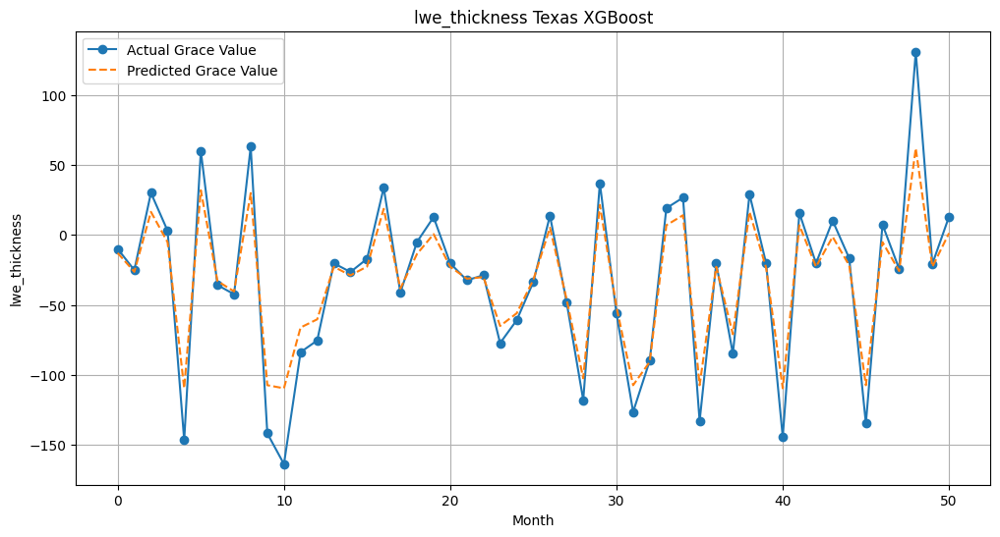

In [ ]:
#######  TEXAS  XGBOOST   #################
######  *********        + Standard Index of SWVL + Standard Index of Grace
######                   + Random Forest  +  K-Means SWVL   ######

import numpy as np
import xgboost as xgb
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler

mse=np.zeros((25,1))
r2=np.zeros((25,1))
mae=np.zeros((25,1))
Grace_XGBOOST=np.zeros((25,254))
for i in range(25):
    X=np.zeros((254,7))
    Y=np.zeros((254,1))
    for j in range(254):
           X[j][0]=(xxx_tp[i][j+2])*730
           X[j][1]=xxx_skt[i][j+2]
           X[j][2]=xxx_swvl[i][j+2]
           X[j][3]=((xxx_swvl[i][j+2]-mean_swvl[i])/(std_swvl[i]))
           X[j][4]=Grace_Random_FOREST[i][j]
           X[j][5]=((xxx_Grace[i][j]-mean_Grace[i])/(std_Grace[i]))
           X[j][6]=Kmeans_swvl[i][j]
           Y[j][0]=(xxx_Grace[i][j])*10

    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

    xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.7, learning_rate = 0.1, max_depth = 5, alpha = 40, n_estimators = 15)

    xg_reg.fit(X_train, y_train)

    y_pred = xg_reg.predict(X_test)

    Grace_XGBOOST[i][:]= xg_reg.predict(X)

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)

print('mse')
print(mse)
print('r2')
print(r2)
print('mae')
print(mae)

plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Grace Value', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='Predicted Grace Value', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Texas XGBoost')
plt.grid(True)
plt.show()


In [ ]:
# Get feature importance scores
feature_importance = xg_reg.feature_importances_

print(feature_importance)


[2.5195320e-04 2.7664378e-03 1.4555510e-04 6.1038201e-04 2.7259091e-01
 7.2228324e-01 0.0000000e+00 1.3515211e-03]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

mse
[[192.4984996 ]
 [217.79968104]
 [129.21459589]
 [120.27772503]
 [100.72420429]
 [ 55.76284951]
 [201.0192218 ]
 [ 45.07857081]
 [196.79092952]
 [357.98922802]
 [125.78403737]
 [ 70.10876483]
 [ 67.40610186]
 [ 37.7910395 ]
 [130.42785896]
 [ 98.53904164]
 [104.64271007]
 [242.77530673]
 [174.38217745]
 [139.71573288]
 [358.84892502]
 [137.64860867]
 [391.20215093]
 [ 41.24081628]
 [ 50.15889814]]
r2
[[0.96315095]
 [0.95749695]
 [0.97687716]
 [0.97973822]
 [0.98402589]
 [0.97902575]
 [0.93381281]
 [0.98723521]
 [0.96312184]
 [0.94644682]
 [0.90681011]
 [0.95916664]
 [0.97592387]
 [0.99106219]
 [0.98034924]
 [0.90014778]
 [0.91254825]
 [0.88576236]
 [0.94917813]
 [0.97547543]
 [0.57408171]
 [0.85732817]
 [0.75624769]
 [0.98325795]
 [0.98651499]]
mae
[[10.48289291]
 [11.65360768]
 [ 9.26858765]
 [ 8.66170215]
 [ 7.75818327]
 [ 6.44909886]
 [11.97610202]
 [ 5.41777245]
 [11.50363978]
 [14.36580015]
 [ 8.60815249]
 [ 7.06513064]
 [ 6.32584543]
 [ 4.48143723]
 [ 9.30024577]
 [ 7.3612297

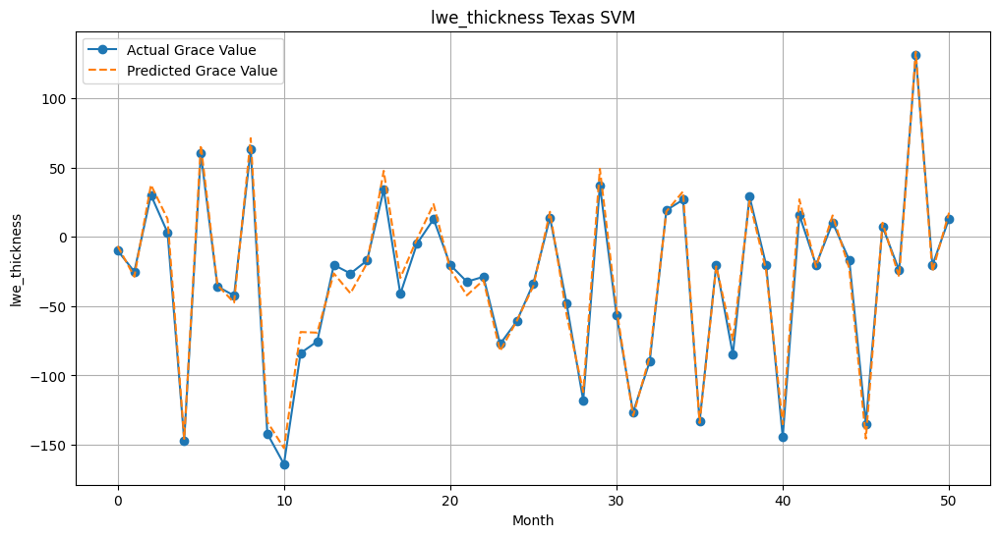

In [ ]:
######   TEXAS   SVM   ##########
######  *************   + XGBoost + Standard Index of SWVL + Standard Index of Grace  ######

import numpy as np
from sklearn.svm import SVR
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

mse=np.zeros((25,1))
r2=np.zeros((25,1))
mae=np.zeros((25,1))
for i in range(25):
    X=np.zeros((254,7))
    Y=np.zeros((254,1))
    for j in range(254):
           X[j][0]=(xxx_tp[i][j+2])*730
           X[j][1]=xxx_skt[i][j+2]
           X[j][2]=xxx_swvl[i][j+2]
           X[j][3]= ((xxx_swvl[i][j+2]-mean_swvl[i])/(std_swvl[i]))  # Standard Index of SWVL
           X[j][4]=Grace_XGBOOST[i][j]
           #X[j][5]=Grace_Random_FOREST[i][j]
           X[j][5]=Kmeans_swvl[i][j]
           X[j][6]=((xxx_Grace[i][j]-mean_Grace[i])/(std_Grace[i]))
           Y[j][0]=(xxx_Grace[i][j])*10


    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

    svr_linear = SVR(kernel='linear', C=1e3)
    svr_linear.fit(X_train, y_train)

    y_pred = svr_linear.predict(X_test)

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)


print('mse')
print(mse)
print('r2')
print(r2)
print('mae')
print(mae)

plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Grace Value', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='Predicted Grace Value', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Texas SVM')
plt.grid(True)
plt.show()


<ipython-input-27-c169794fbddf>:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)
<ipython-input-27-c169794fbddf>:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)
<ipython-input-27-c169794fbddf>:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)
<ipython-input-27-c169794fbddf>:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)
<ipython-input-27-c169794fbddf>:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

mse
[[572.12467404]
 [495.35569213]
 [539.75106389]
 [589.77700058]
 [457.31403212]
 [295.71908054]
 [376.88628605]
 [323.57093721]
 [528.80188973]
 [594.24731296]
 [171.55728414]
 [251.03104544]
 [298.04379745]
 [413.50401081]
 [589.47685167]
 [165.59557294]
 [244.00653872]
 [250.95495388]
 [326.75235354]
 [363.43049862]
 [108.51410363]
 [156.87329031]
 [215.71758599]
 [184.58706595]
 [223.56838926]]
r2
[[0.89048097]
 [0.90333261]
 [0.90341204]
 [0.90064718]
 [0.9274734 ]
 [0.88877027]
 [0.87590716]
 [0.90837517]
 [0.90090376]
 [0.91110393]
 [0.87289798]
 [0.85379232]
 [0.89354464]
 [0.90220376]
 [0.91118714]
 [0.83219763]
 [0.79607945]
 [0.88191343]
 [0.90477143]
 [0.93620636]
 [0.87120446]
 [0.83740192]
 [0.86558954]
 [0.92506537]
 [0.93989457]]
mae
[[18.22292746]
 [17.98194339]
 [18.75926906]
 [19.18258044]
 [17.20102617]
 [13.47600099]
 [16.09740912]
 [13.4507277 ]
 [18.17157035]
 [19.13652571]
 [10.18930107]
 [12.43733112]
 [13.53255235]
 [15.99561455]
 [19.29726983]
 [10.3843185

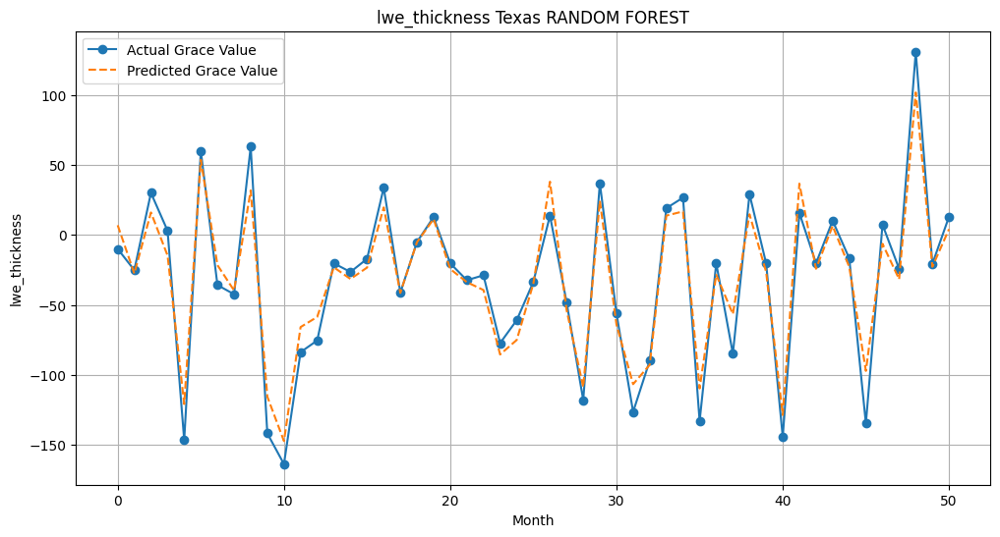

In [ ]:
######   TEXAS   RANDOM FOREST   ######
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

mse=np.zeros((25,1))
r2=np.zeros((25,1))
mae=np.zeros((25,1))
Grace_Random_FOREST=np.zeros((25,254))
for i in range(25):
    X=np.zeros((254,3))
    Y=np.zeros((254,1))
    for j in range(254):
           X[j][0]=(xxx_tp[i][j+2])*730
           X[j][1]=xxx_skt[i][j+2]
           X[j][2]=xxx_swvl[i][j+2]
           Y[j][0]=xxx_Grace[i][j]*10


    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

    regressor = RandomForestRegressor(n_estimators=100, random_state=42)
    regressor.fit(X,Y)
    y_pred = regressor.predict(X_test)
    Grace_Random_FOREST[i][:]=regressor.predict(X)

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)


print('mse')
print(mse)
print('r2')
print(r2)
print('mae')
print(mae)

plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Grace Value', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='Predicted Grace Value', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Texas RANDOM FOREST')
plt.grid(True)
plt.show()



In [ ]:
# WELLS DATA   *****  TEXAS ******
import pandas as pd


excel_path = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/Wells/6_7.xlsx'

df = pd.read_excel(excel_path)

Wells = df.to_numpy()
Wells_average=np.zeros((254,1))
Well_1=np.zeros((254,1))
Well_2=np.zeros((254,1))
Wells_1_2=np.zeros((254,2))

for i in range(254):
       Wells_average[i][0]=(Wells[i][1]+Wells[i][3])/2
       Wells_1_2[i][0]=Wells[i][1]
       Wells_1_2[i][1]=Wells[i][3]
       Well_1[i][0]=Wells[i][1]
       Well_2[i][0]=Wells[i][3]


print(Wells_average)

[[ 4.31600000e-01]
 [-6.93650000e-01]
 [-1.37800000e+00]
 [ 1.33760000e+00]
 [ 9.51000000e-01]
 [ 3.58150000e-01]
 [ 2.60050000e-01]
 [ 8.33900000e-01]
 [ 5.14500000e-02]
 [ 4.44000000e-02]
 [-3.02200000e-01]
 [-2.10900000e-01]
 [-4.49450000e-01]
 [-6.16700000e-01]
 [-4.57400000e-01]
 [ 1.78200000e-01]
 [ 3.69550000e-01]
 [-8.65000000e-03]
 [ 1.67650000e-01]
 [ 1.99350000e-01]
 [ 1.01000000e-01]
 [ 1.44200000e-01]
 [-2.12350000e-01]
 [-3.77050000e-01]
 [-6.46500000e-02]
 [ 2.21300000e-01]
 [-7.59100000e-01]
 [ 1.17450000e-01]
 [ 1.90650000e-01]
 [ 6.23750000e-01]
 [ 1.12900000e-01]
 [ 3.12500000e-02]
 [ 2.85200000e-01]
 [ 1.27450000e-01]
 [ 1.18350000e-01]
 [-1.87250000e-01]
 [-3.15350000e-01]
 [-3.44650000e-01]
 [-3.11450000e-01]
 [-3.12950000e-01]
 [ 6.40500000e-02]
 [ 1.60400000e-01]
 [ 3.59750000e-01]
 [ 6.86000000e-02]
 [ 5.62500000e-02]
 [ 2.04285000e+00]
 [ 1.63060000e+00]
 [-1.25785000e+00]
 [ 1.68950000e-01]
 [-1.57550000e+00]
 [-1.68685000e+00]
 [-6.01200000e-01]
 [ 1.6795500

<ipython-input-34-786ee7b002e9>:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)


mse
203.41240096209143
r2
0.917423076487831
mae
10.876182207173759


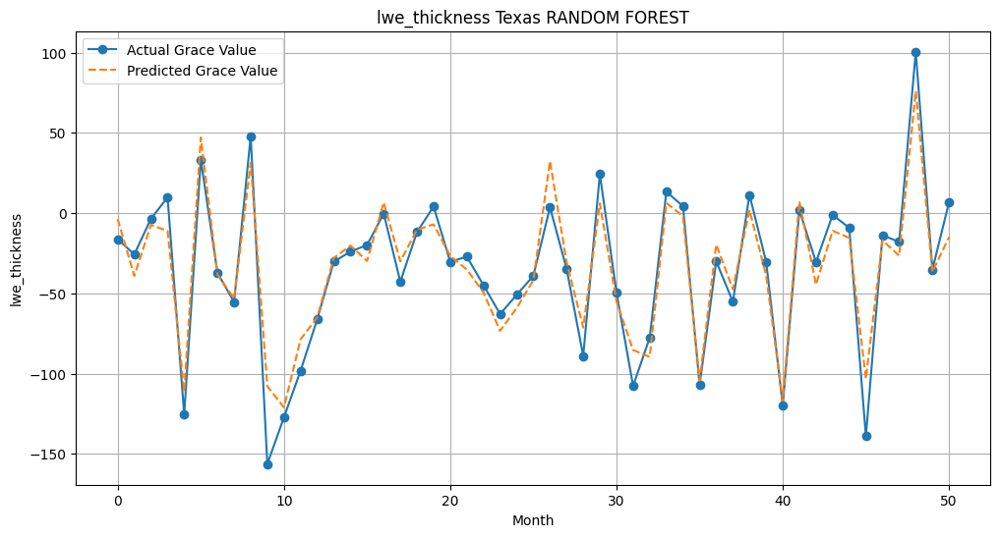

In [ ]:
######   TEXAS   RANDOM FOREST  FOR ONLY ONE PIXEL 99,29 ######
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

mse=[]
r2=[]
mae=[]
Grace_Random_FOREST=np.zeros((1,254))
X=np.zeros((254,4))
Y=np.zeros((254,1))
for j in range(254):
     X[j][0]=(xxx_tp[23][j+2])*730
     X[j][1]=xxx_skt[23][j+2]
     X[j][2]=xxx_swvl[23][j+2]
     X[j][3]=(Wells_average[j][0])*304.8
     Y[j][0]=xxx_Grace[23][j]*10


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

regressor = RandomForestRegressor(n_estimators=100, random_state=42)
regressor.fit(X,Y)
y_pred = regressor.predict(X_test)
Grace_Random_FOREST[0][:]=regressor.predict(X)

mse = mean_squared_error(y_test, y_pred)

r2 = r2_score(y_test, y_pred)

mae= mean_absolute_error(y_test, y_pred)


print('mse')
print(mse)
print('r2')
print(r2)
print('mae')
print(mae)

plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Actual Grace Value', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='Predicted Grace Value', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Texas RANDOM FOREST')
plt.grid(True)
plt.show()



In [ ]:
########    INTERPOLATING DEPTH OF WELLS  ____TEXAS_____  ########## 99, 29

import numpy as np


known_well_coordinates = [(-99.7156111,29.6803611), (-99.7844444,29.2088889)]
unknown_well_coordinates=np.zeros((100,2))
counter=0
for i in range(10):
    for j in range(10):
     unknown_well_coordinates[counter][0] = -99.9+j*(0.1)
     unknown_well_coordinates[counter][1] = 29.9-i*(0.1)
     counter=counter+1

interpolated_depth=np.zeros((254,100))

for i in range(254):
    known_well_depths = Wells_1_2[i][:]
    power_parameter = 2
    counter=0
    sum_1=0
    for j in range(100):
            distances = [np.sqrt((x - unknown_well_coordinates[j][0])**2 + (y - unknown_well_coordinates[j][1])**2) for x, y in known_well_coordinates]
            weights = [1 / (distance**power_parameter) for distance in distances]
            sum_1=weights[0]*known_well_depths[0]+weights[1]*known_well_depths[1]
            sum_2=weights[0]+weights[1]
            interpolated_depth[i][counter] = sum_1/sum_2
            counter=counter+1

print(interpolated_depth[1][:])


[ 0.11549694  0.20547271  0.23474927  0.19720173  0.11200558  0.00717226
 -0.09624376 -0.18789259 -0.26490735 -0.32807145  0.17437275  0.31000856
  0.35207421  0.28829866  0.16013294  0.01803357 -0.10938162 -0.21362693
 -0.29585271 -0.36007437  0.17100985  0.3726595   0.43536228  0.33309499
  0.15278544 -0.02300762 -0.16428535 -0.2705945  -0.34948794 -0.40846955
 -0.00293893  0.25632532  0.34991728  0.22355795  0.02216132 -0.15059623
 -0.27633244 -0.36480595 -0.42767871 -0.47341202 -0.47604841 -0.2808983
 -0.15561077 -0.19147723 -0.2918468  -0.38123694 -0.44673758 -0.49332684
 -0.526972   -0.55191719 -1.13172282 -1.14720444 -1.01963949 -0.84325245
 -0.72948335 -0.67453089 -0.65048999 -0.64081705 -0.63776145 -0.63778374
 -1.58308002 -1.70747632 -1.60998374 -1.34902917 -1.10628314 -0.94358351
 -0.84434302 -0.78416201 -0.74683197 -0.72300145 -1.71881494 -1.82534157
 -1.75970658 -1.55024068 -1.31530718 -1.12663899 -0.99361046 -0.90340275
 -0.84222615 -0.80009583 -1.68393087 -1.75127885 -1.

<ipython-input-45-8ab48825d630>:28: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  regressor.fit(X,Y)


coordinates of the point:
[-99.9  29.9]


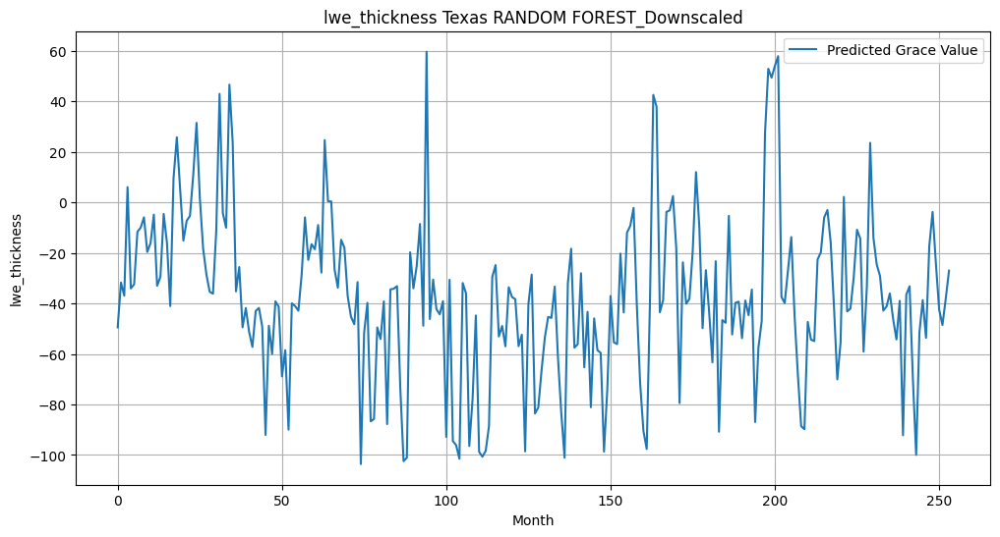

coordinates of the point:
[-99.8  29.9]


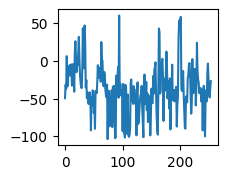

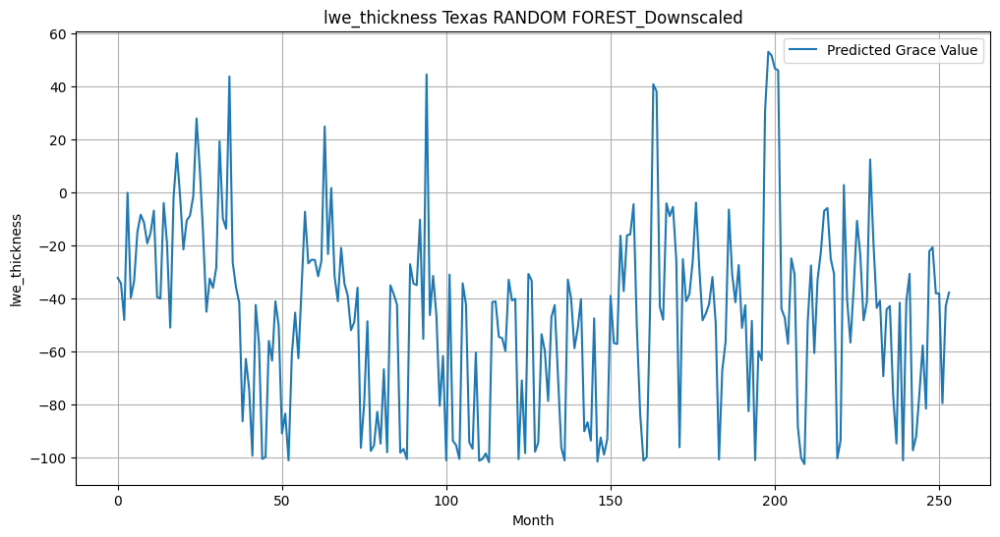

coordinates of the point:
[-99.7  29.9]


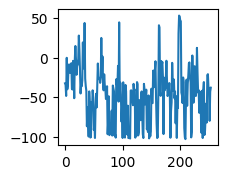

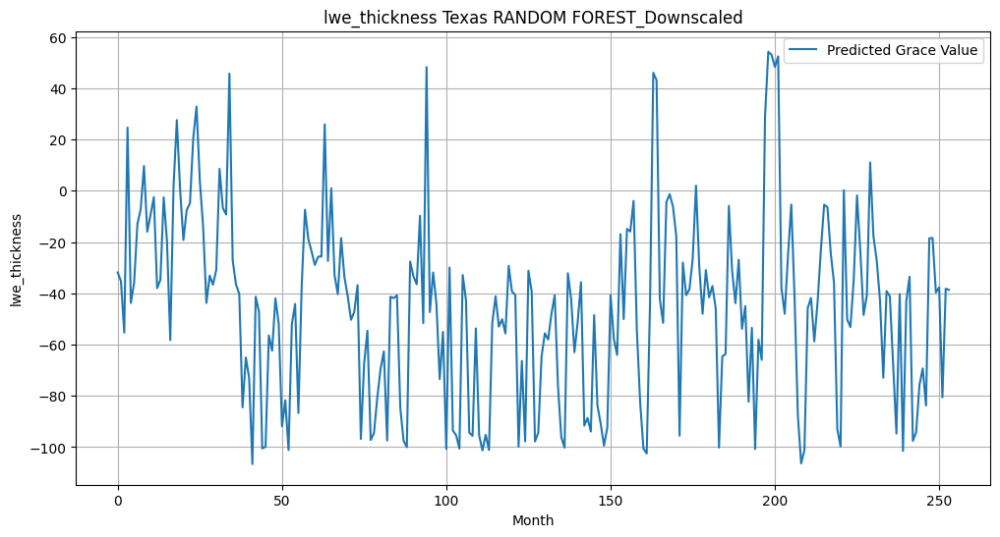

coordinates of the point:
[-99.6  29.9]


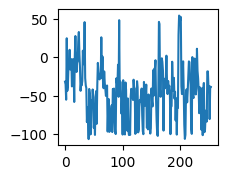

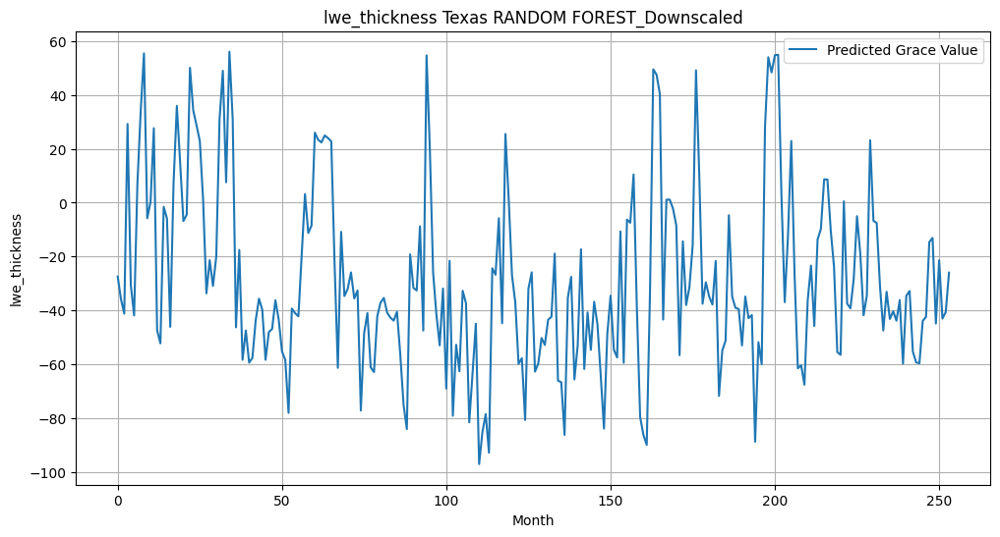

coordinates of the point:
[-99.5  29.9]


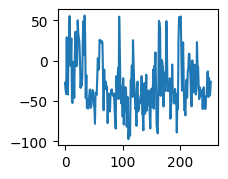

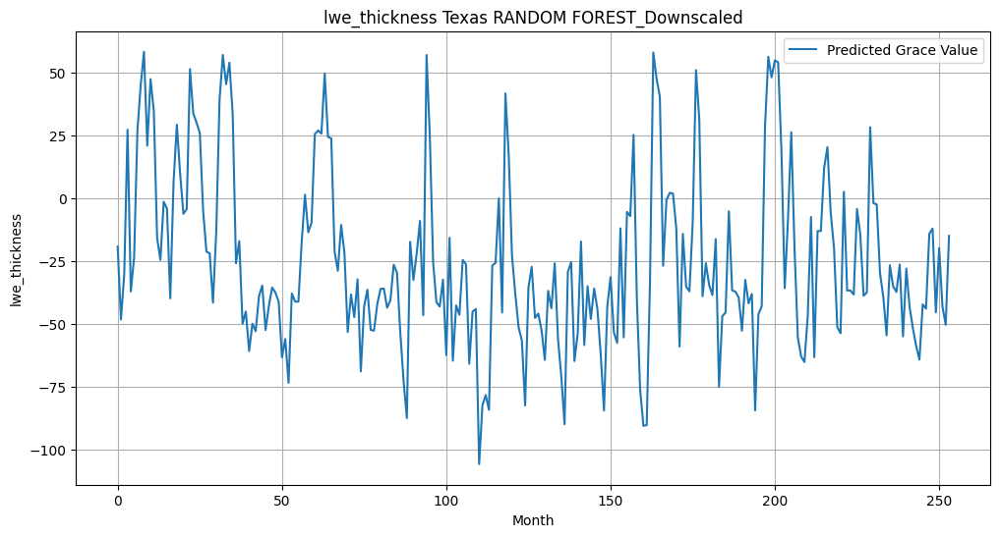

coordinates of the point:
[-99.4  29.9]


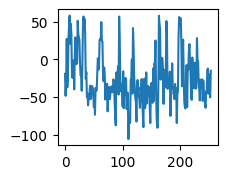

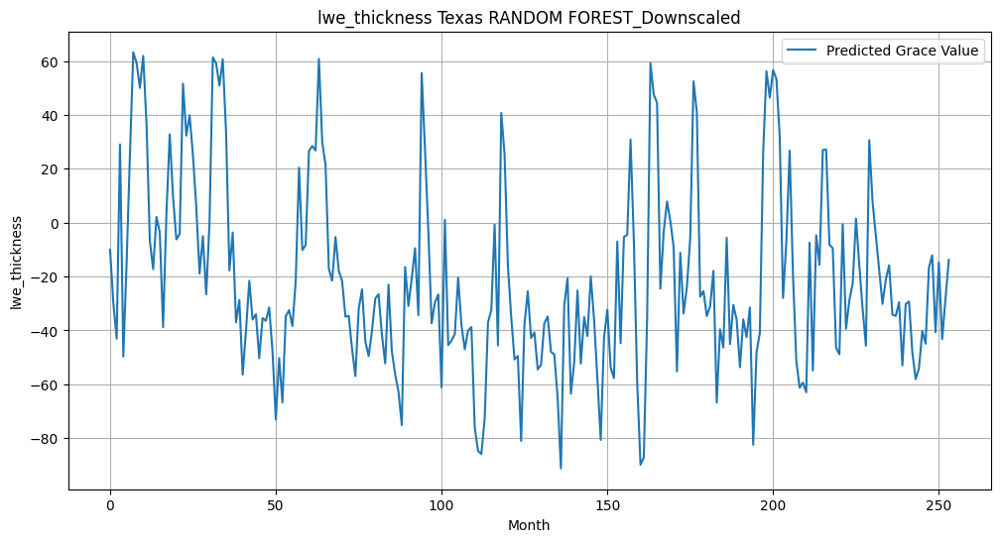

coordinates of the point:
[-99.3  29.9]


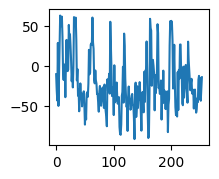

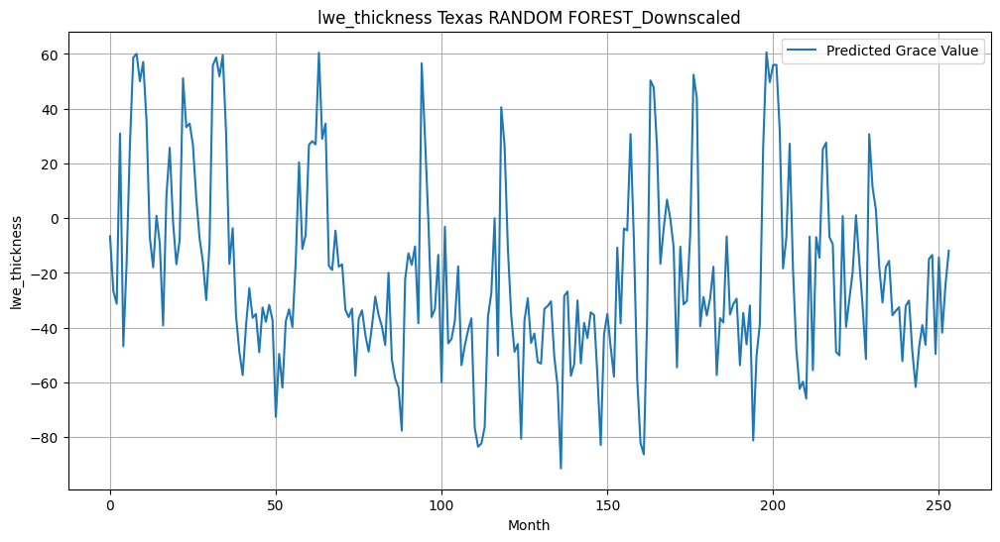

coordinates of the point:
[-99.2  29.9]


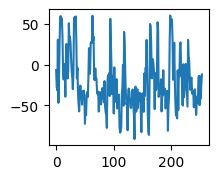

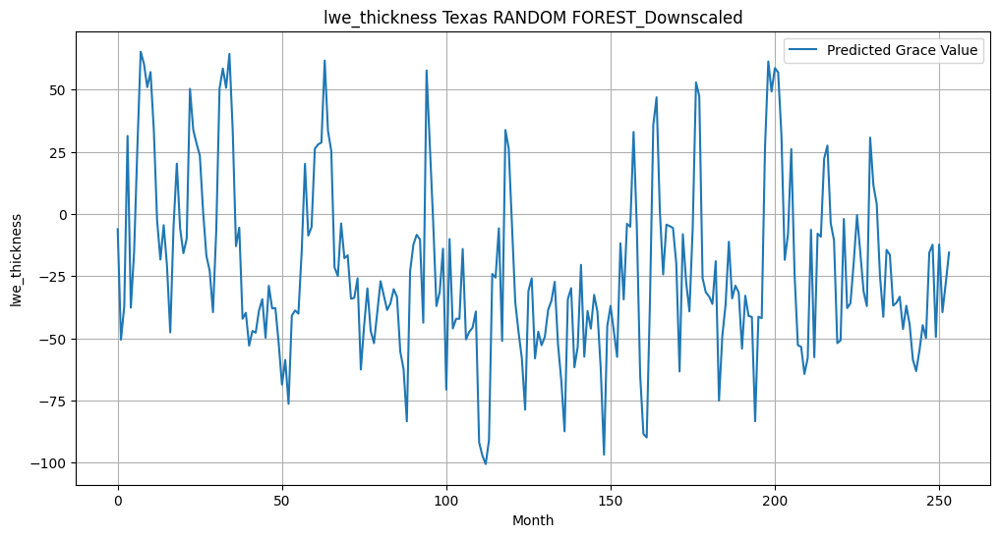

coordinates of the point:
[-99.1  29.9]


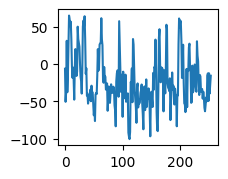

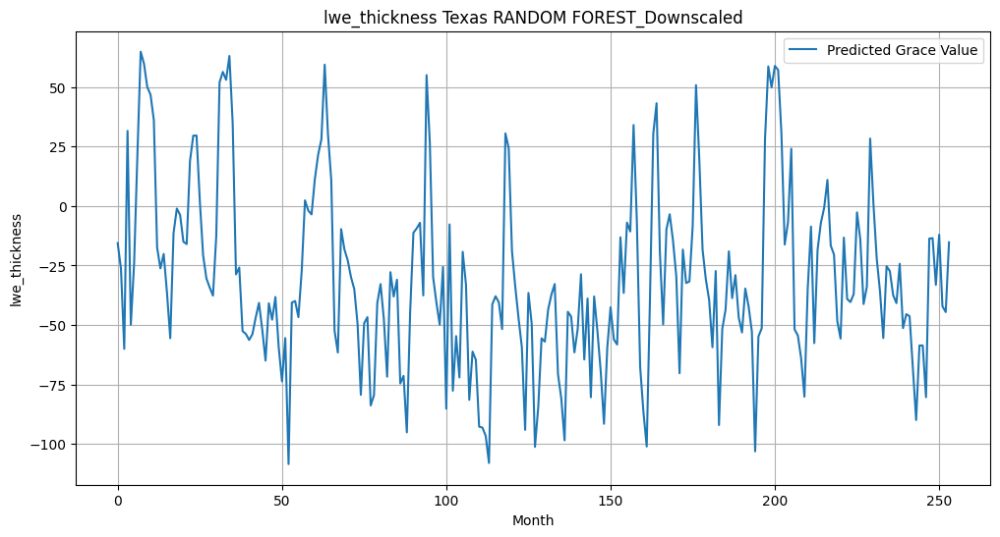

coordinates of the point:
[-99.   29.9]


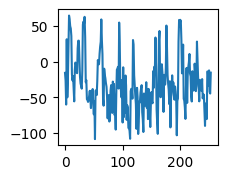

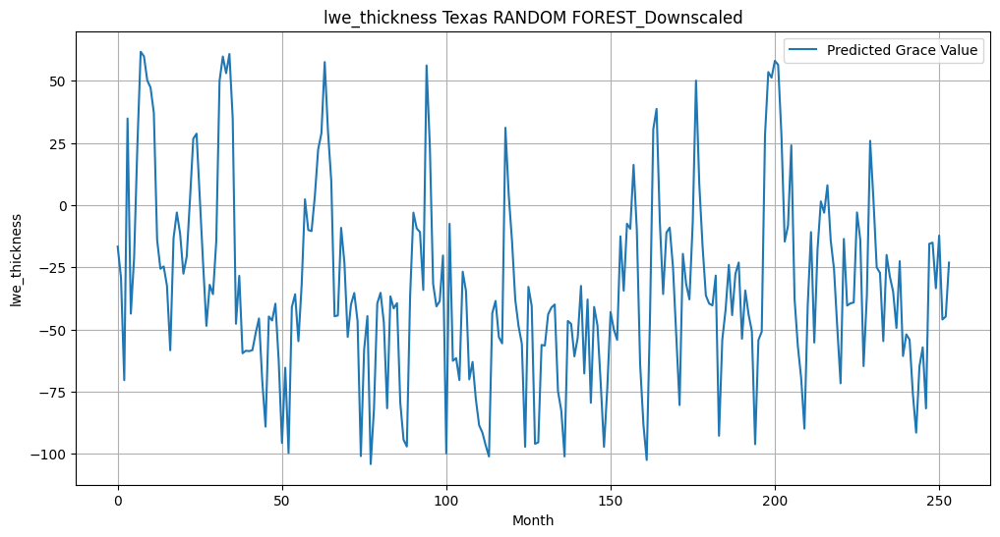

coordinates of the point:
[-99.9  29.8]


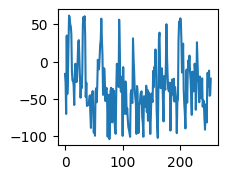

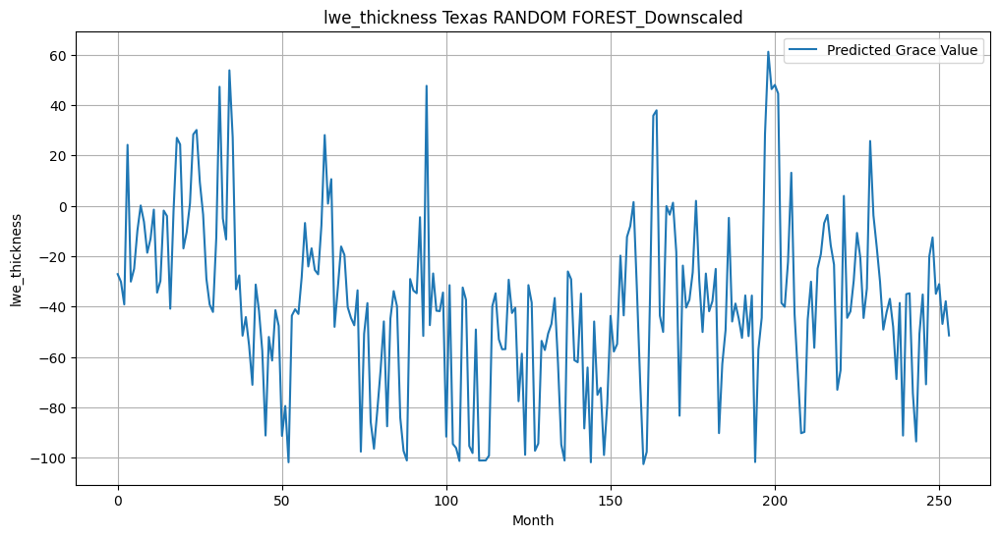

coordinates of the point:
[-99.8  29.8]


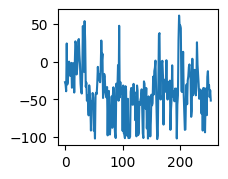

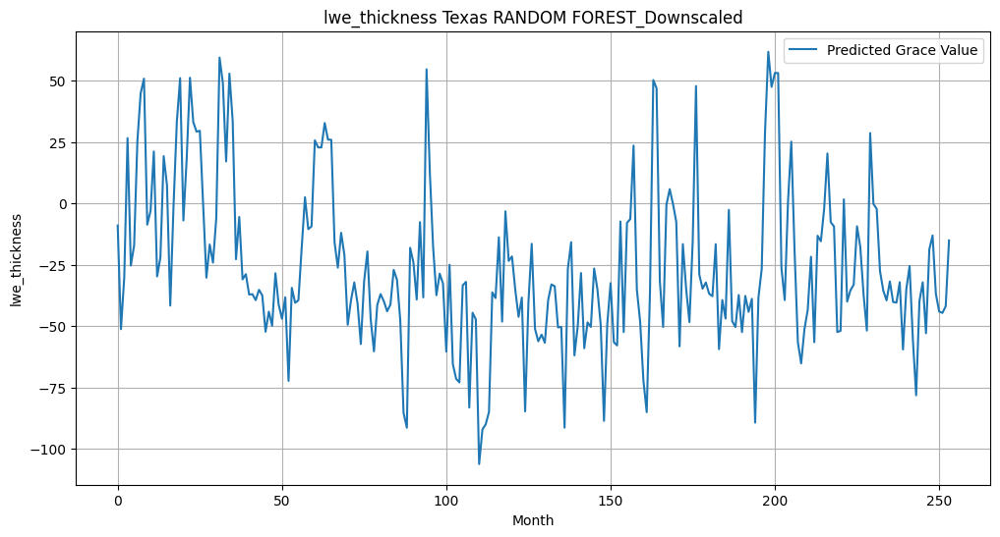

coordinates of the point:
[-99.7  29.8]


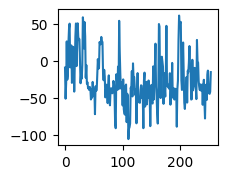

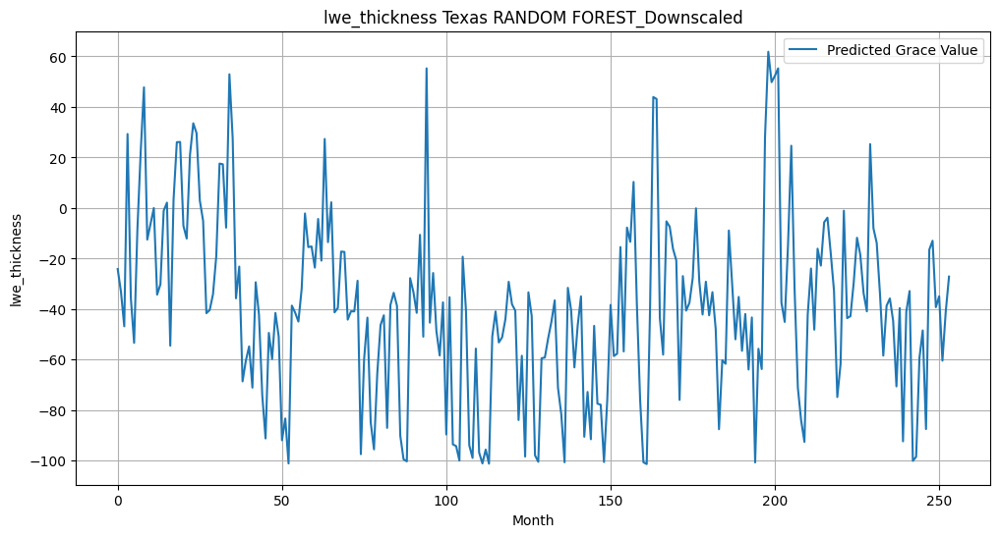

coordinates of the point:
[-99.6  29.8]


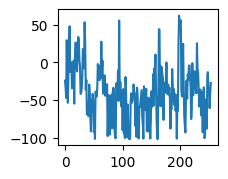

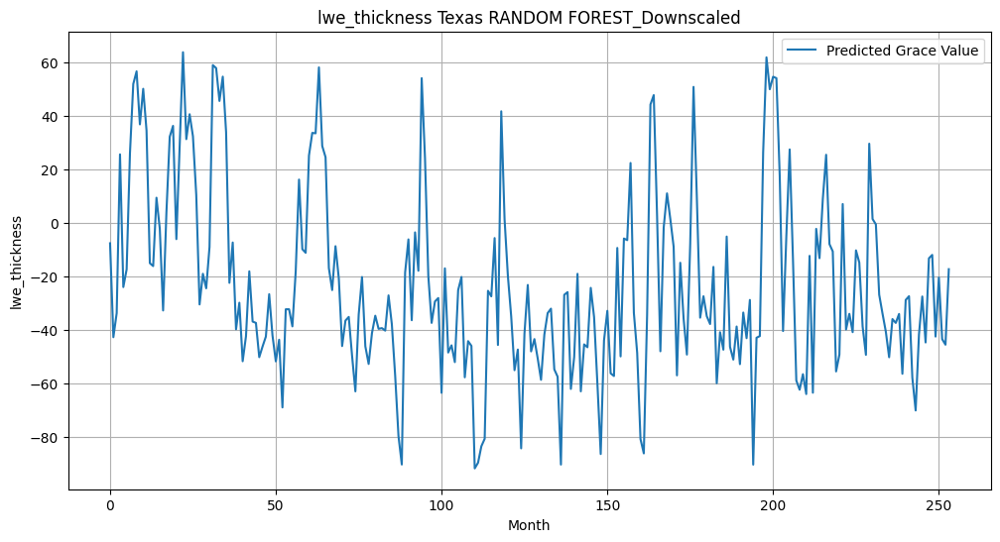

coordinates of the point:
[-99.5  29.8]


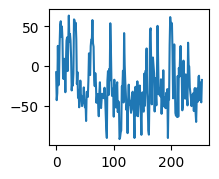

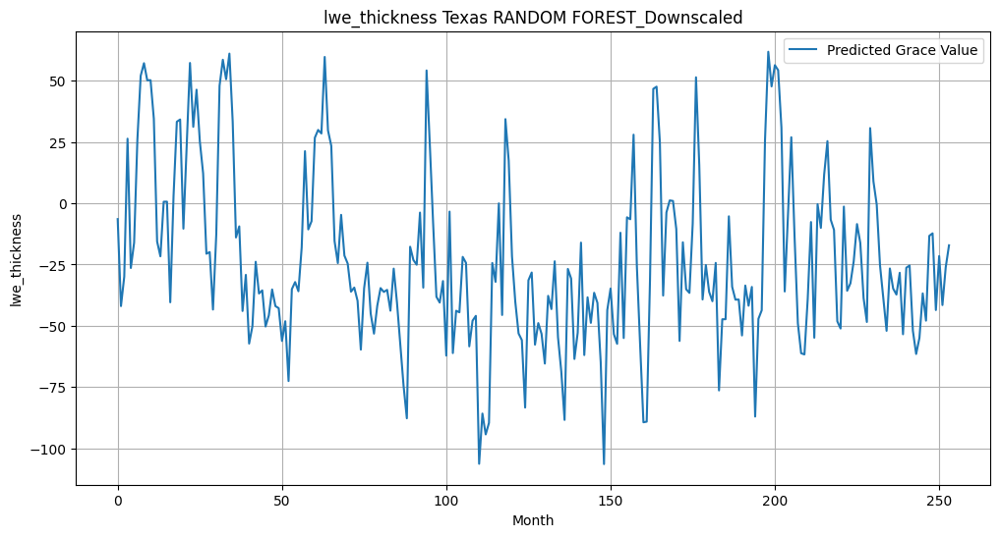

coordinates of the point:
[-99.4  29.8]


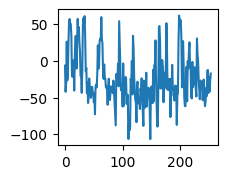

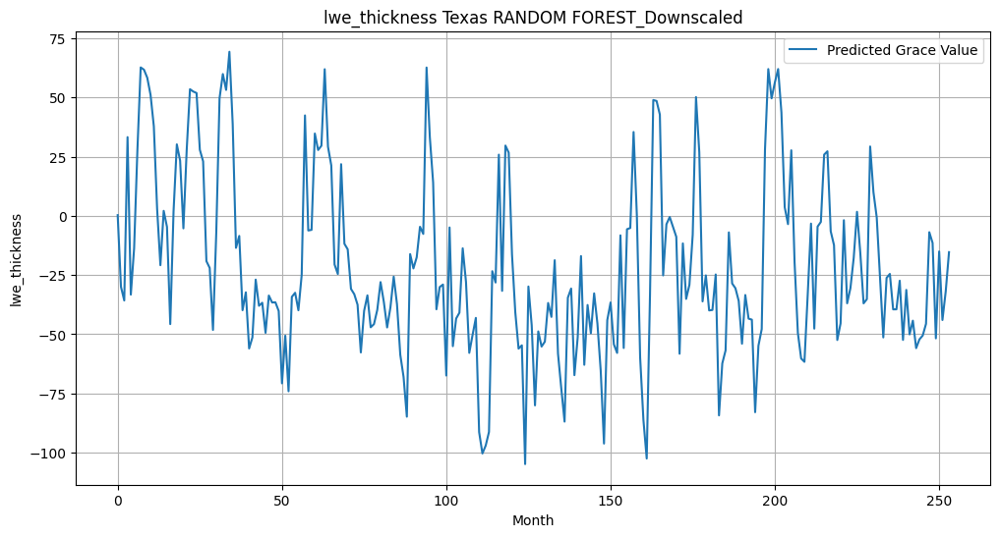

coordinates of the point:
[-99.3  29.8]


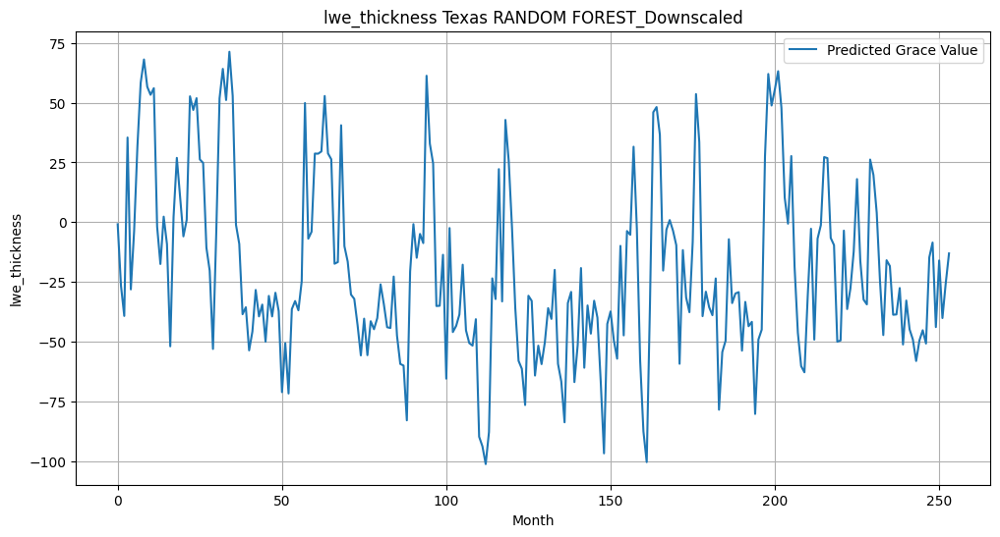

coordinates of the point:
[-99.2  29.8]


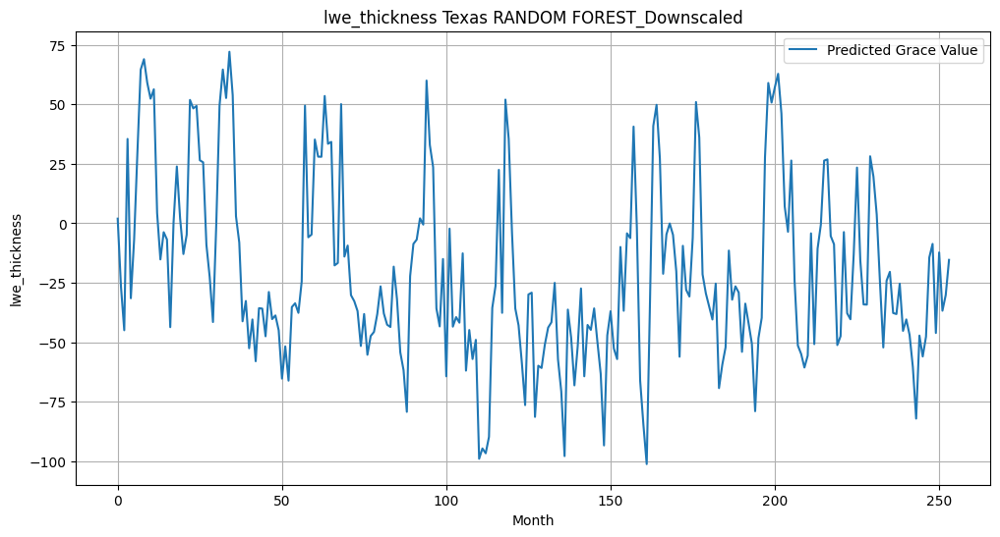

coordinates of the point:
[-99.1  29.8]


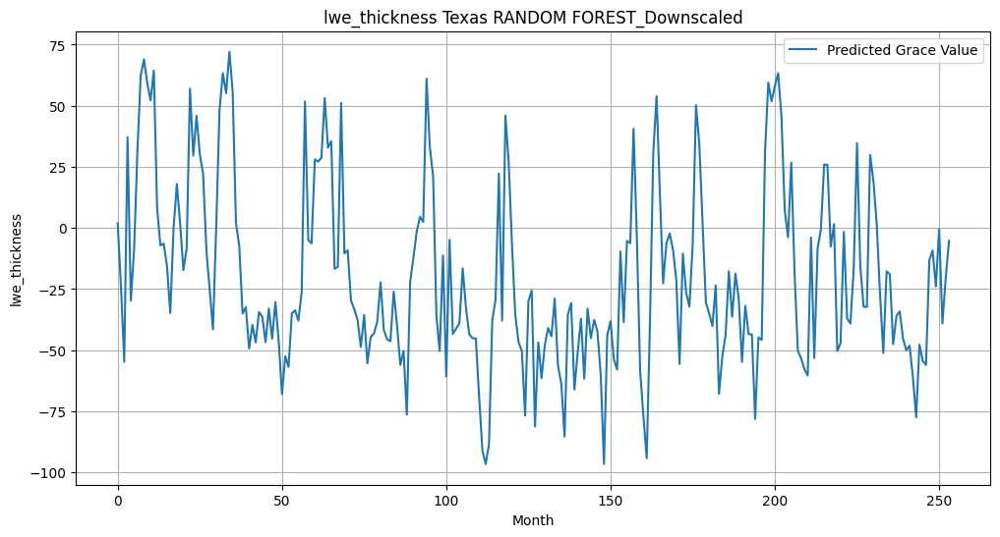

coordinates of the point:
[-99.   29.8]


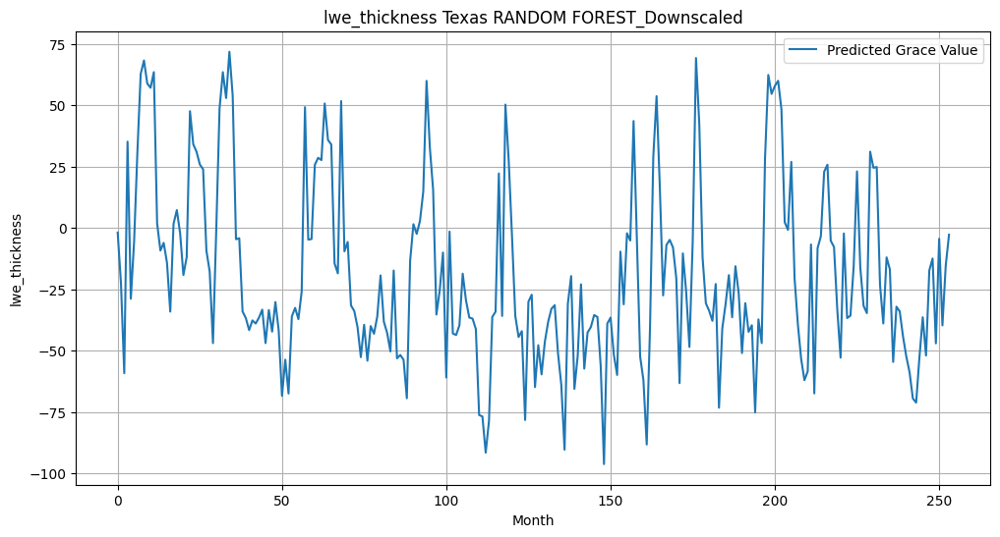

coordinates of the point:
[-99.9  29.7]


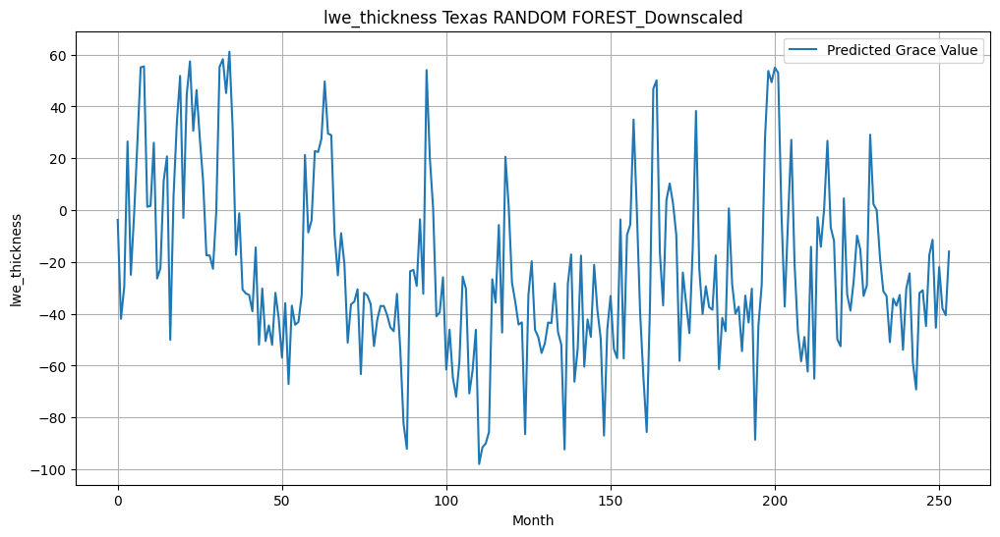

coordinates of the point:
[-99.8  29.7]


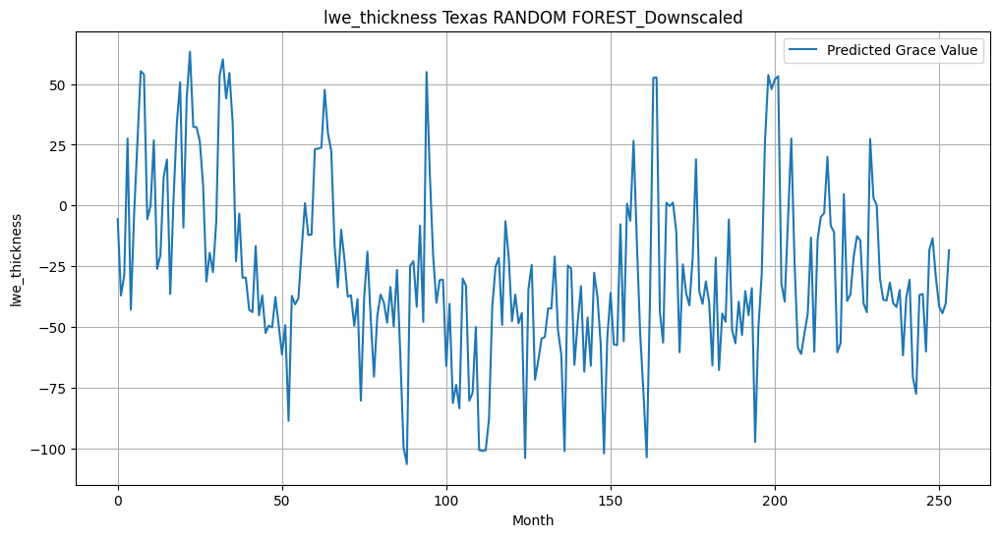

coordinates of the point:
[-99.7  29.7]


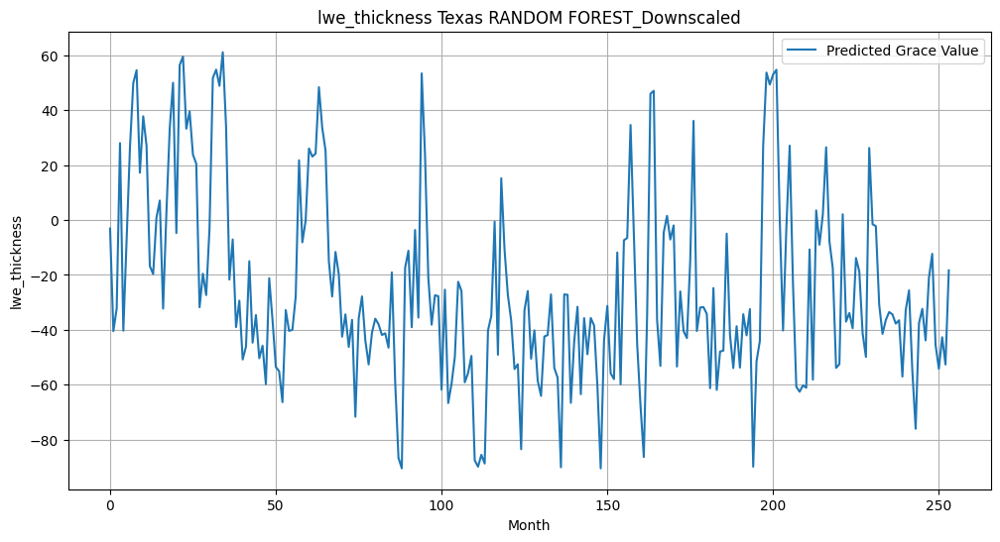

coordinates of the point:
[-99.6  29.7]


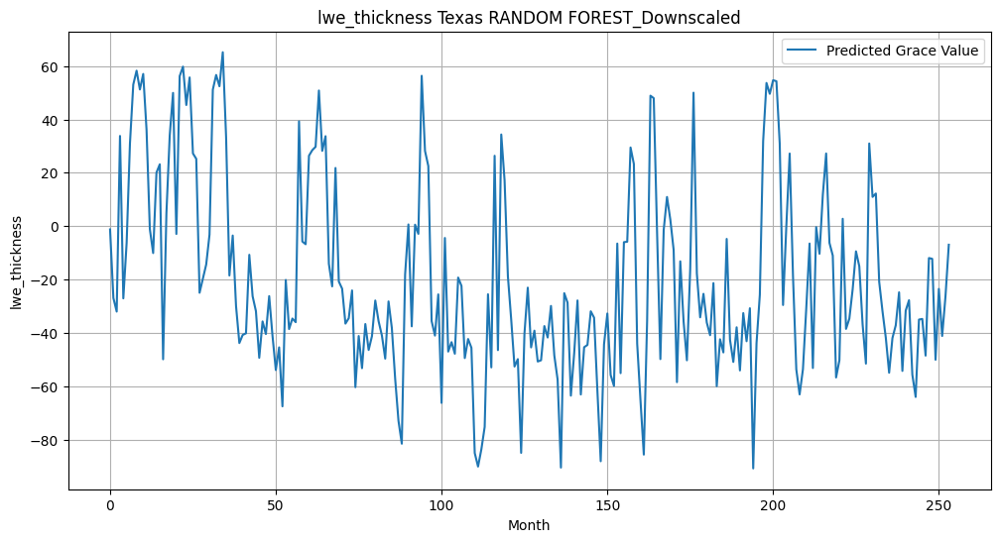

coordinates of the point:
[-99.5  29.7]


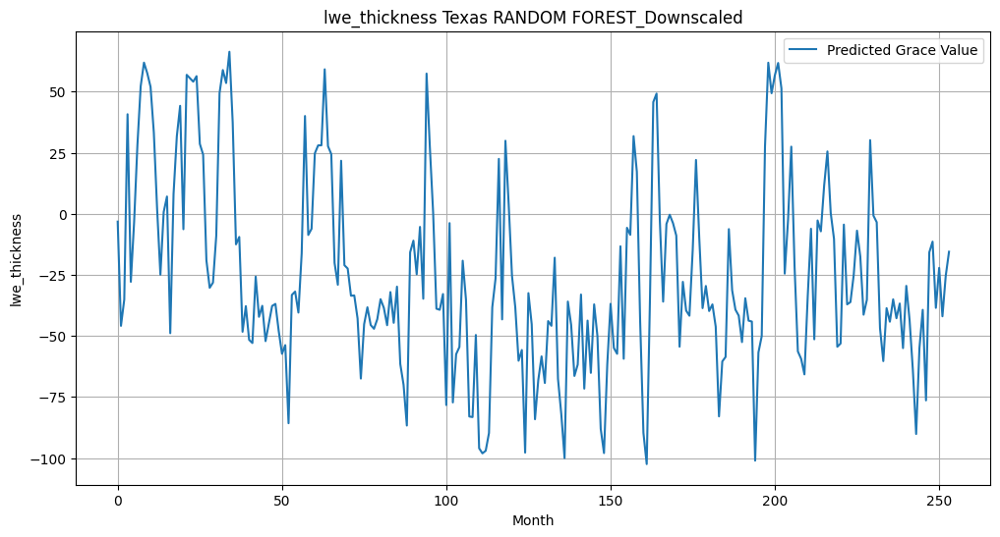

coordinates of the point:
[-99.4  29.7]


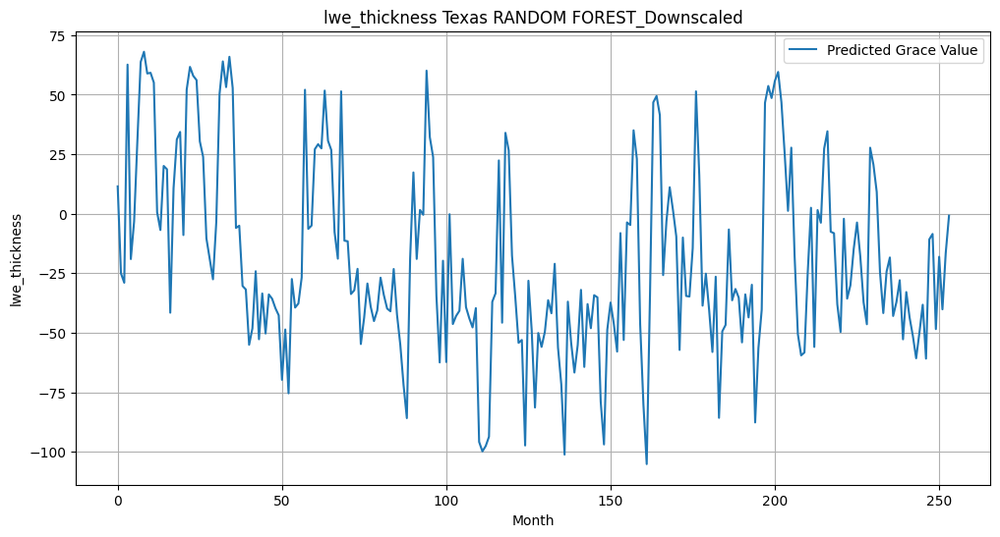

coordinates of the point:
[-99.3  29.7]


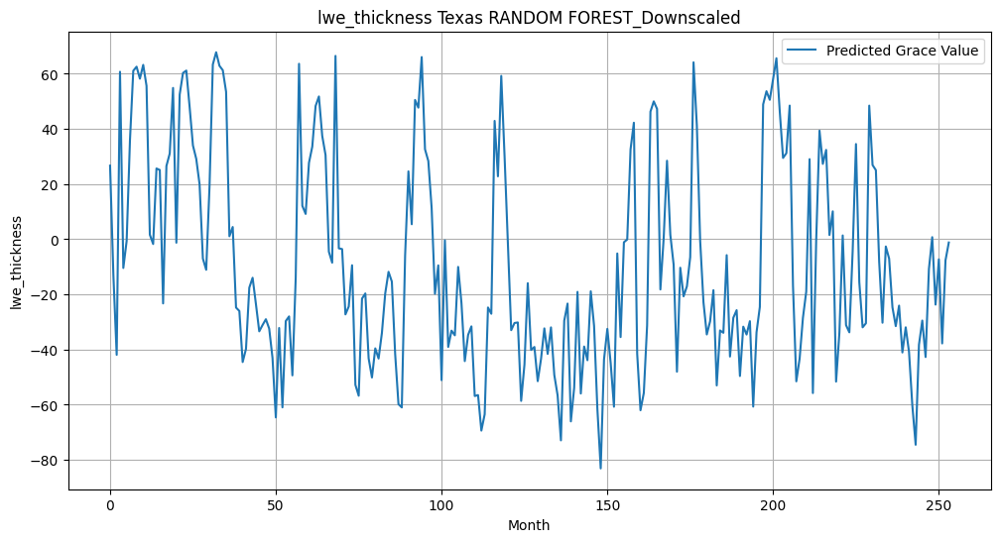

coordinates of the point:
[-99.2  29.7]


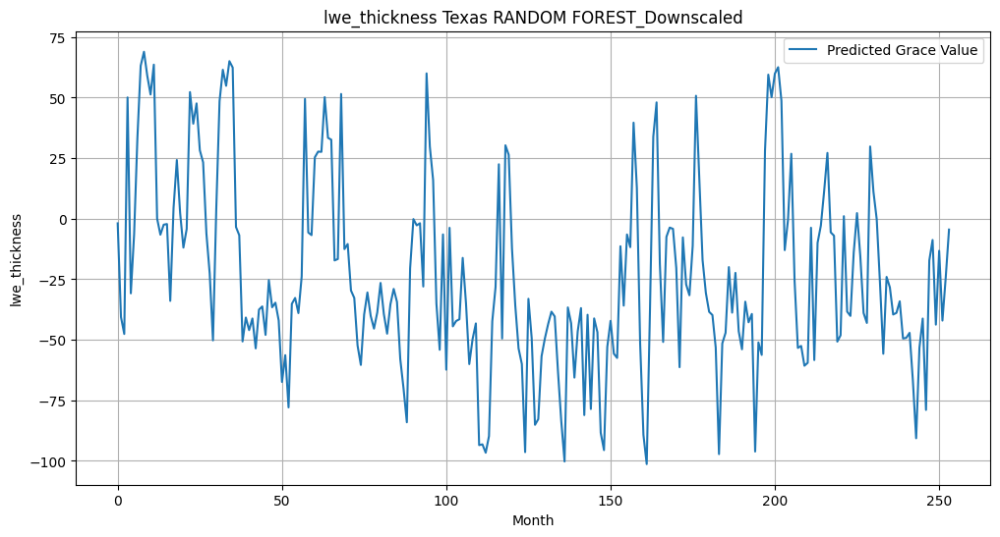

coordinates of the point:
[-99.1  29.7]


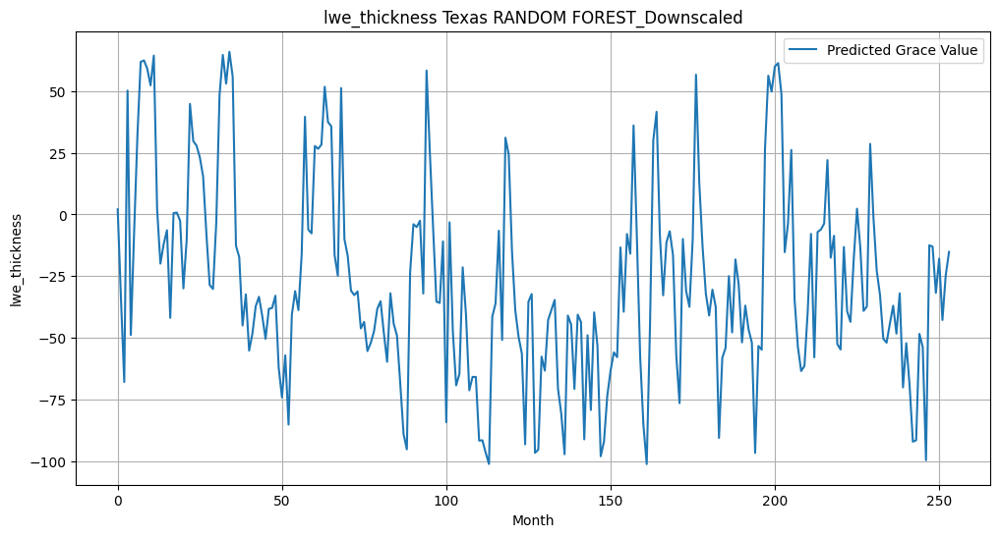

coordinates of the point:
[-99.   29.7]


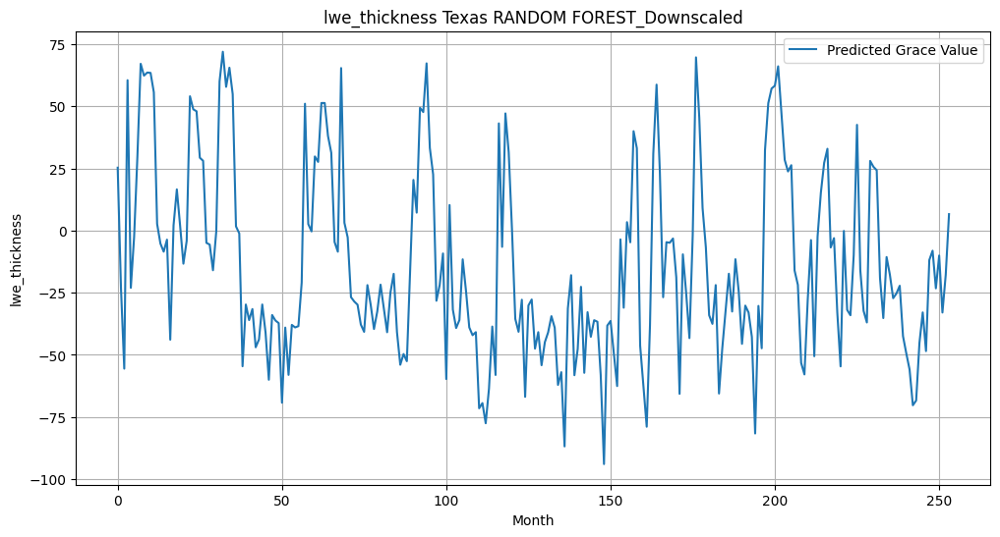

coordinates of the point:
[-99.9  29.6]


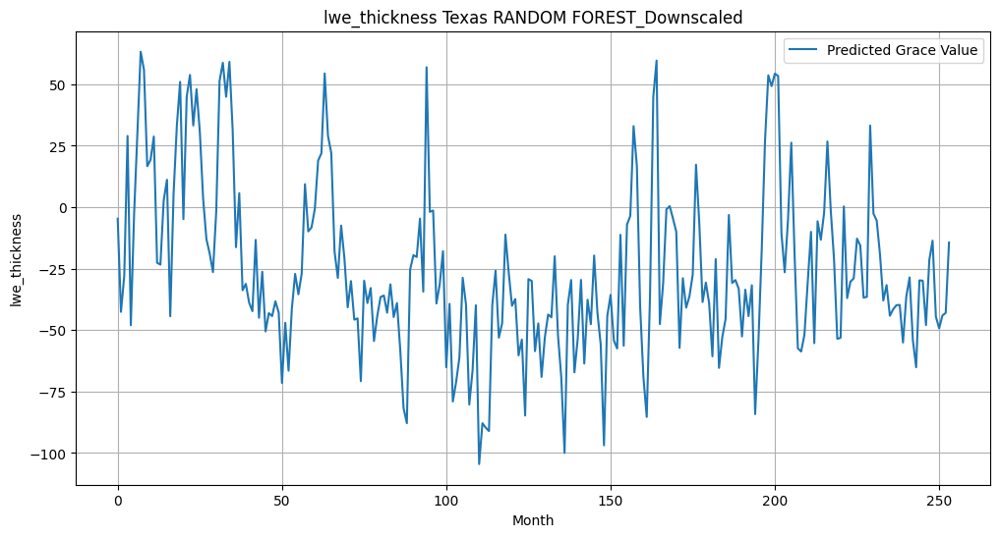

coordinates of the point:
[-99.8  29.6]


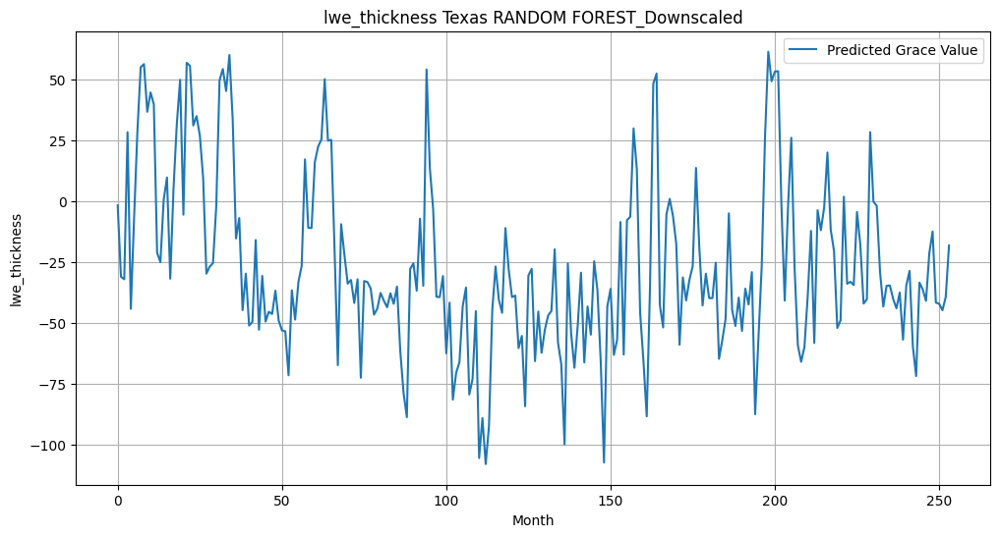

coordinates of the point:
[-99.7  29.6]


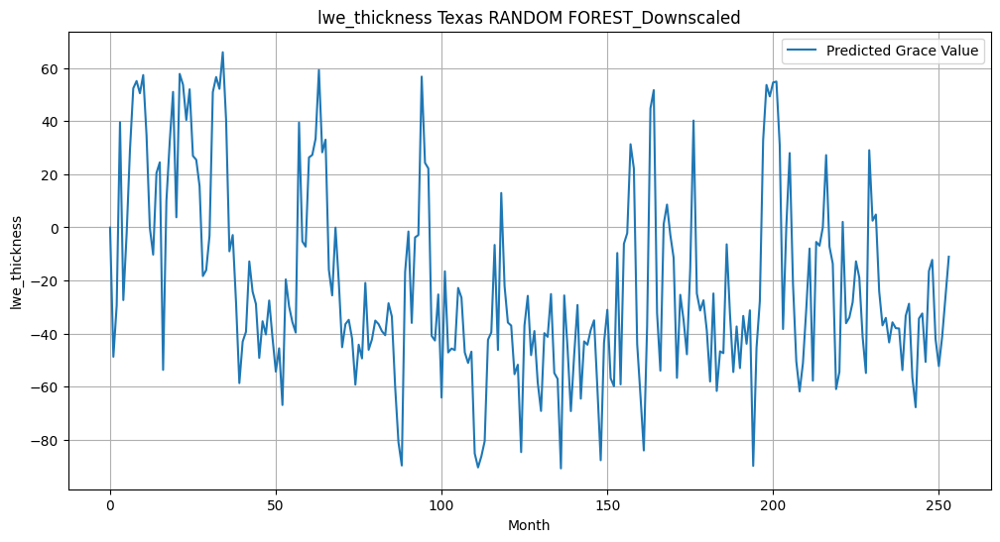

coordinates of the point:
[-99.6  29.6]


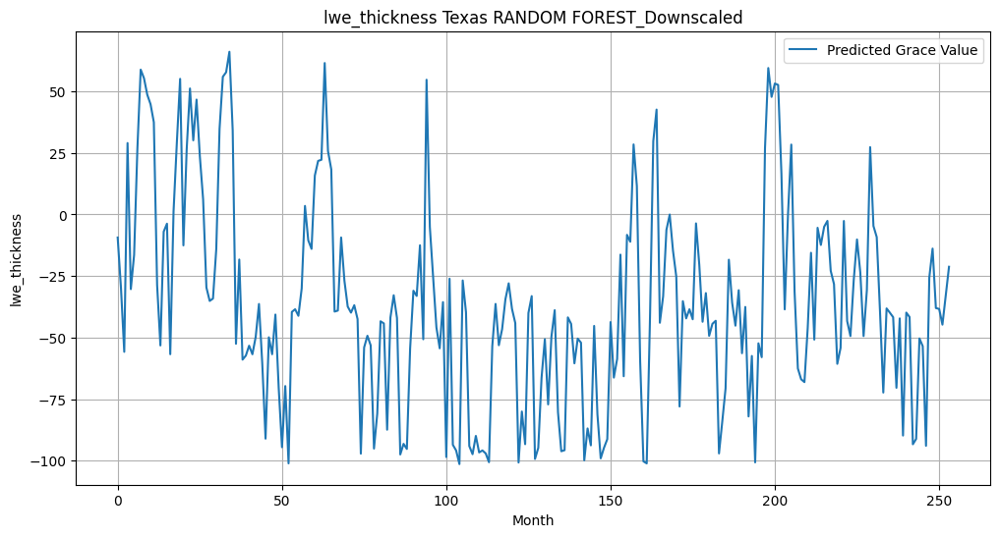

coordinates of the point:
[-99.5  29.6]


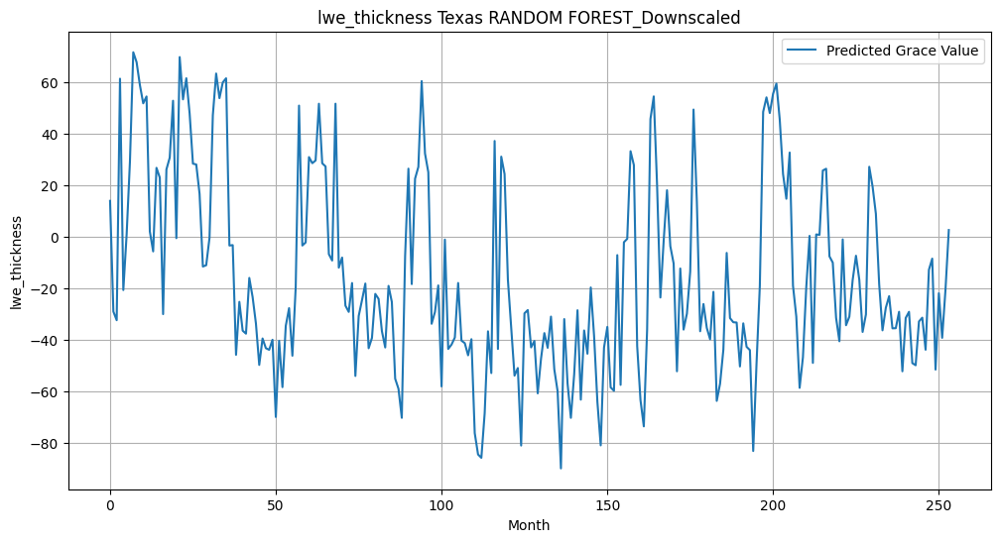

coordinates of the point:
[-99.4  29.6]


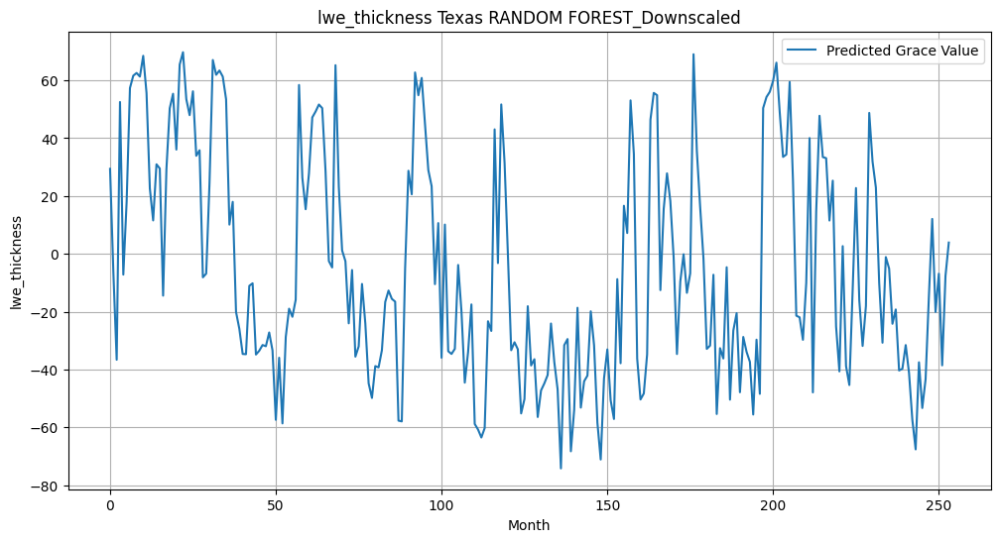

coordinates of the point:
[-99.3  29.6]


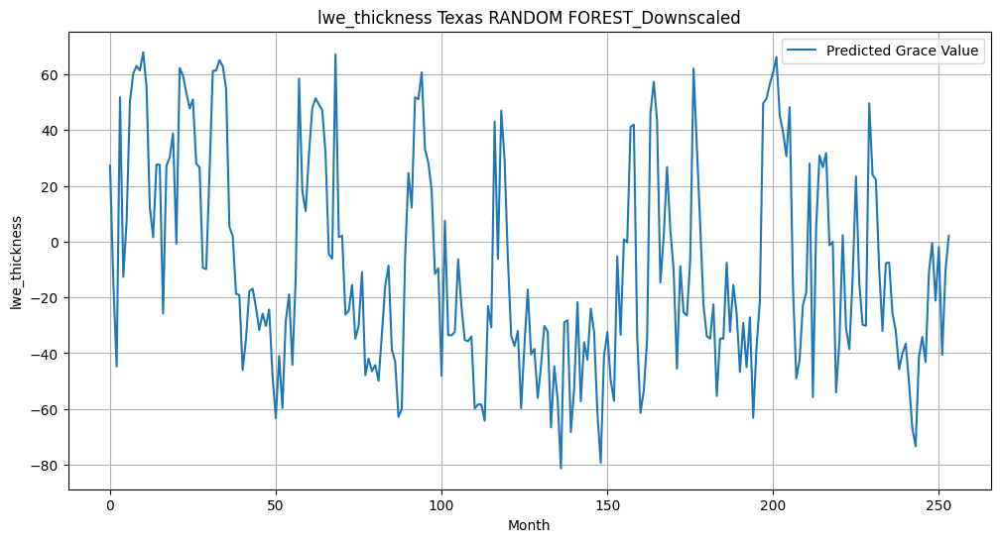

coordinates of the point:
[-99.2  29.6]


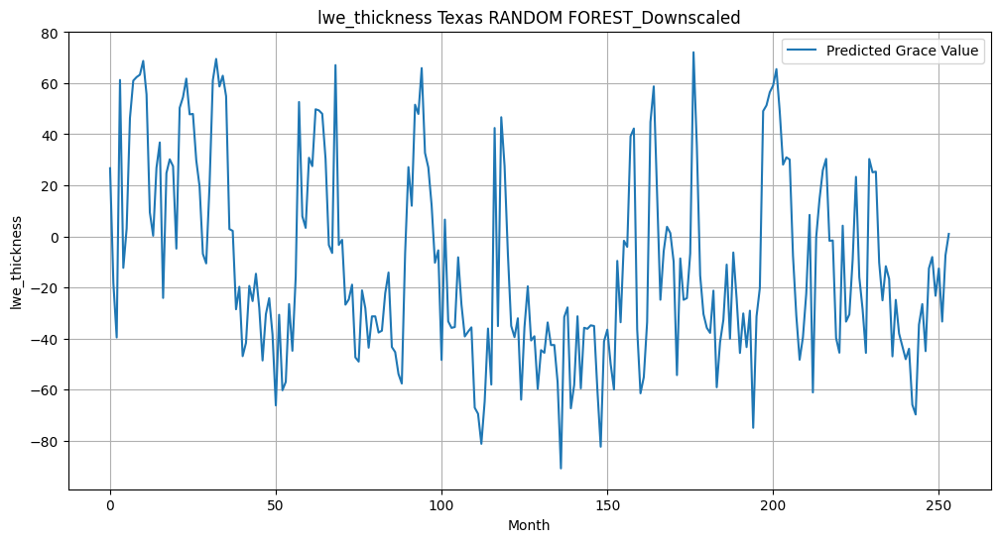

coordinates of the point:
[-99.1  29.6]


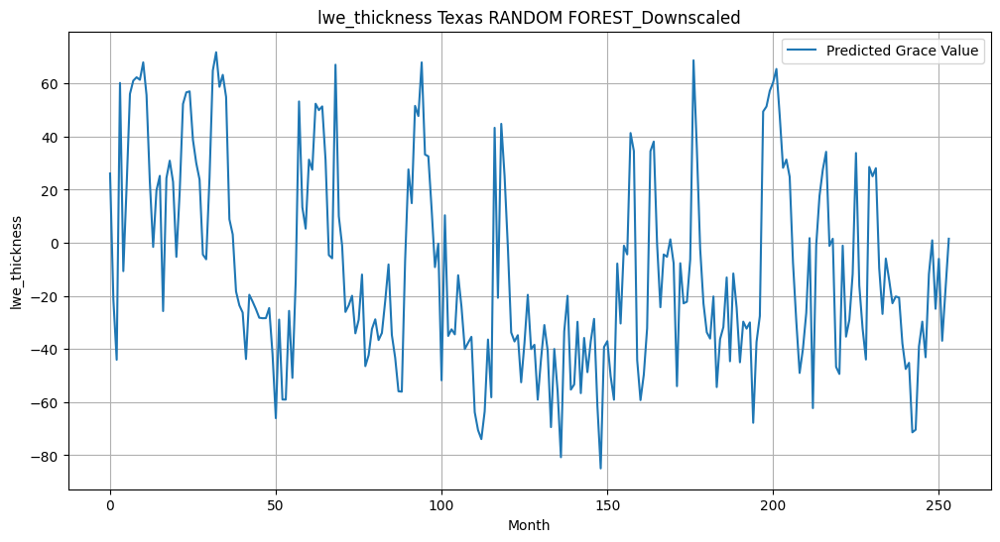

coordinates of the point:
[-99.   29.6]


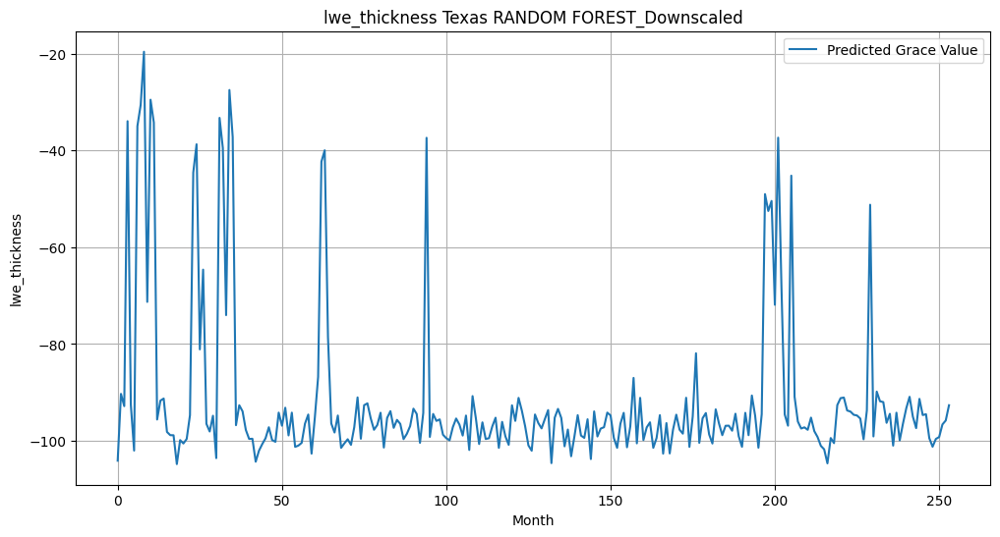

coordinates of the point:
[-99.9  29.5]


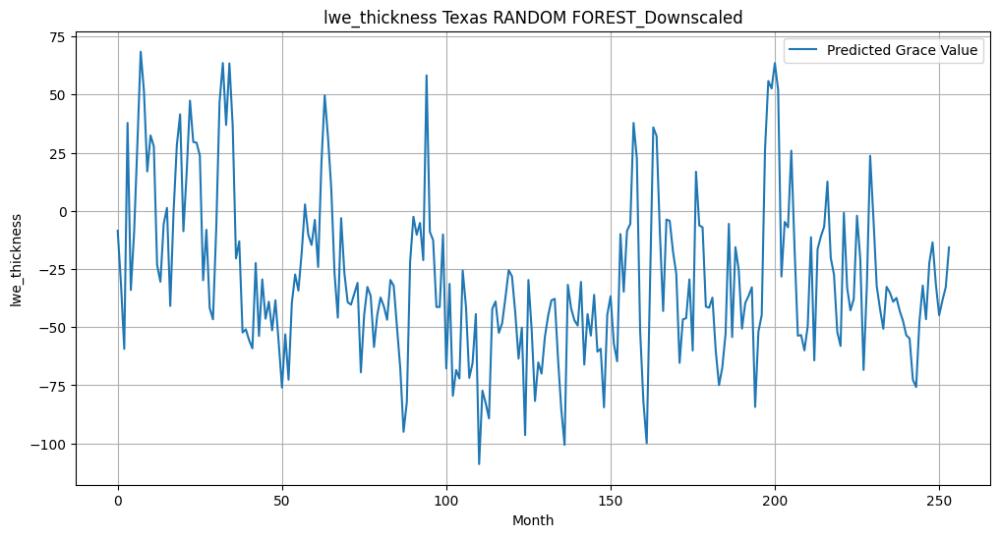

coordinates of the point:
[-99.8  29.5]


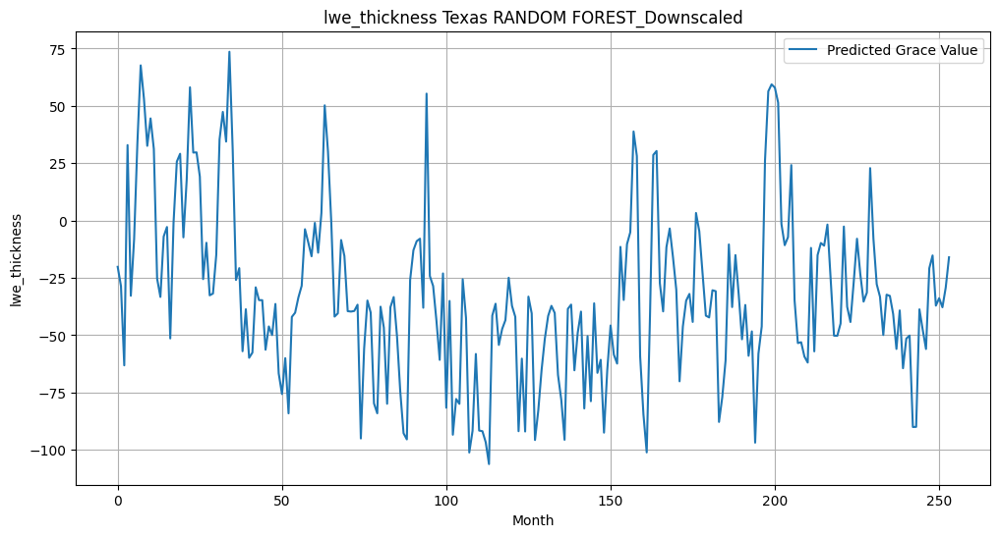

coordinates of the point:
[-99.7  29.5]


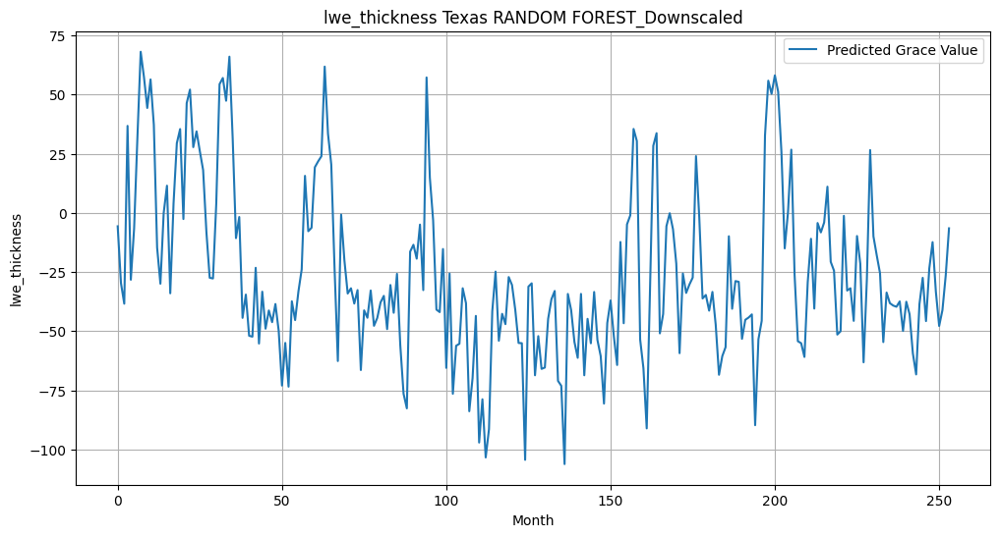

coordinates of the point:
[-99.6  29.5]


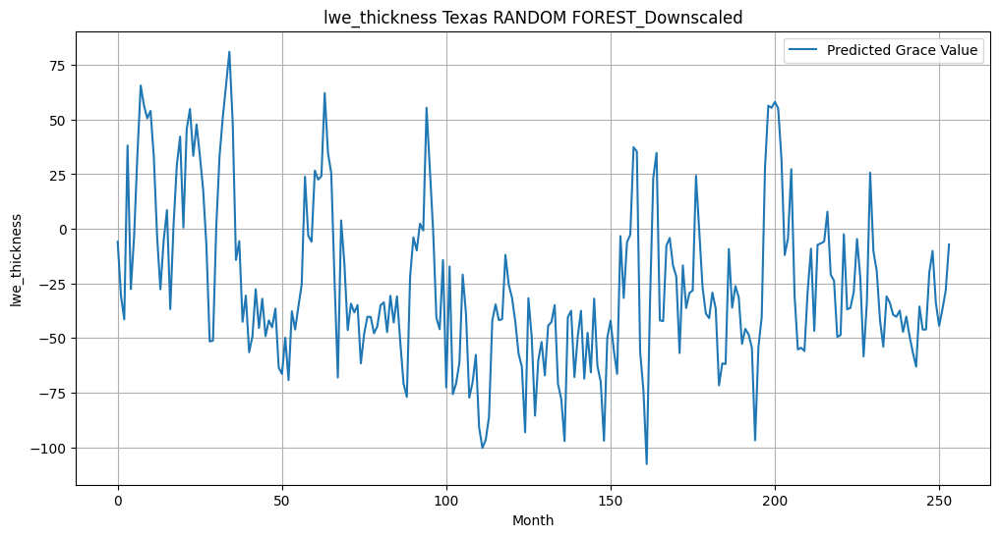

coordinates of the point:
[-99.5  29.5]


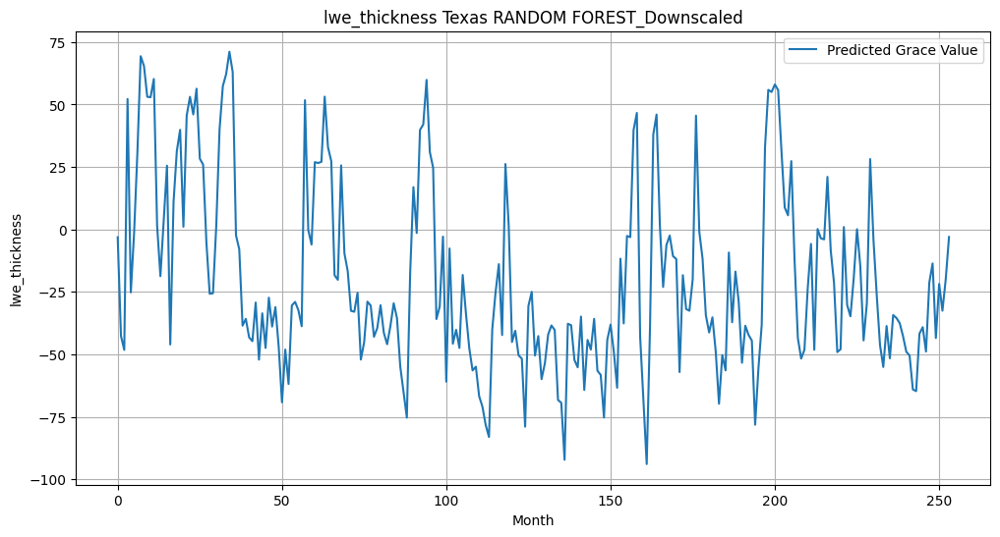

In [ ]:
###  DOWNSCALING ONE PIXEL BY MEANS OF
####         *****RANDOM FOREST  *****
####          ******   TEXAS   *****  99,29
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error


X=np.zeros((254,4))
Y=np.zeros((254,1))
for j in range(254):
     X[j][0]=(xxx_tp[23][j+2])*730
     X[j][1]=xxx_skt[23][j+2]
     X[j][2]=xxx_swvl[23][j+2]
     X[j][3]=Wells_average[j][0]
     Y[j][0]=xxx_Grace[23][j]*10



X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

regressor = RandomForestRegressor(n_estimators=100, random_state=42)
regressor.fit(X,Y)

y_pred=np.zeros((254,100))
Grace_downscaled=np.zeros((254,100))

for i in range(100):
    X_downscaled=np.zeros((254,4))
    Y_downscaled=np.zeros((254,1))
    for j in range(254):
           X_downscaled[j][0]=(x_Precipitation[i][j])*730
           X_downscaled[j][1]=x_Temperature[i][j]
           X_downscaled[j][2]=x_Soil_Water[i][j]
           X_downscaled[j][3]=interpolated_depth[j][i]

    y_pred = regressor.predict(X_downscaled)
    for k in range(254):
        Grace_downscaled[k][i]=y_pred[k]

   # if (i==12):
    print('coordinates of the point:')
    print(unknown_well_coordinates[i][:])
    plt.figure(figsize=(12, 6))
    #plt.plot(range(len(y_test)), y_test, label='Actual Grace Value', marker='o')
    plt.plot(range(len(y_pred)), y_pred, label='Predicted Grace Value', linestyle='-')
    plt.xlabel('Month')
    plt.ylabel('lwe_thickness')
    plt.legend()
    plt.title('lwe_thickness Texas RANDOM FOREST_Downscaled')
    plt.grid(True)
    plt.show()

    if i<15:
       plt.figure(figsize=(12, 6))
       t=i+1
       plt.subplot(3, 5, t)
       plt.plot(range(len(y_pred)), y_pred, linestyle='-' )



In [ ]:
#df = pd.DataFrame(Grace_downscaled)
df = pd.DataFrame(unknown_well_coordinates)

#excel_path = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/Wells/DownScaled_99_29.xlsx'
excel_path = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/Wells/well_coordinates_99_29.xlsx'
df.to_excel(excel_path, index=False)

In [ ]:
import xarray as xr
data = xr.open_dataset('/content/drive/MyDrive/Colab Notebooks/Era5/Texas/Skin_Temperature.nc')
#print(data)

print(data['latitude'])
print(data['longitude'])


<xarray.DataArray 'latitude' (latitude: 51)>
array([34. , 33.9, 33.8, 33.7, 33.6, 33.5, 33.4, 33.3, 33.2, 33.1, 33. , 32.9,
       32.8, 32.7, 32.6, 32.5, 32.4, 32.3, 32.2, 32.1, 32. , 31.9, 31.8, 31.7,
       31.6, 31.5, 31.4, 31.3, 31.2, 31.1, 31. , 30.9, 30.8, 30.7, 30.6, 30.5,
       30.4, 30.3, 30.2, 30.1, 30. , 29.9, 29.8, 29.7, 29.6, 29.5, 29.4, 29.3,
       29.2, 29.1, 29. ], dtype=float32)
Coordinates:
  * latitude  (latitude) float32 34.0 33.9 33.8 33.7 ... 29.3 29.2 29.1 29.0
Attributes:
    units:      degrees_north
    long_name:  latitude
<xarray.DataArray 'longitude' (longitude: 61)>
array([-103. , -102.9, -102.8, -102.7, -102.6, -102.5, -102.4, -102.3, -102.2,
       -102.1, -102. , -101.9, -101.8, -101.7, -101.6, -101.5, -101.4, -101.3,
       -101.2, -101.1, -101. , -100.9, -100.8, -100.7, -100.6, -100.5, -100.4,
       -100.3, -100.2, -100.1, -100. ,  -99.9,  -99.8,  -99.7,  -99.6,  -99.5,
        -99.4,  -99.3,  -99.2,  -99.1,  -99. ,  -98.9,  -98.8,  -98.7,  -98.6,

In [ ]:
# Open and read the created NetCDF file
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:
    print("Variables in the NetCDF file:")
    print(rootgrp.variables.keys())
    print("\nlwe_thickness:")
    print(rootgrp.variables['time_bounds'][:])


In [ ]:
import pandas as pd

# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:
    lwe_thickness_data = rootgrp.variables['lwe_thickness'][50, :, :]
    df = pd.DataFrame(lwe_thickness_data, columns=rootgrp.variables['lon'][:], index=rootgrp.variables['lat'][:])

#excel_file_path = '/content/Output_folder/lwe_thickness_data_42.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Output_folder/lwe_thickness_data_50.xlsx'

#df.to_excel(excel_file_path)
df.to_excel(excel_file_path2)

print(f"Data saved to {excel_file_path2}")


<ipython-input-9-39382d7cc6de>:7: UserWarning: WARNING: valid_min not used since it
cannot be safely cast to variable data type
  df = pd.DataFrame(lwe_thickness_data, columns=rootgrp.variables['lon'][:], index=rootgrp.variables['lat'][:])
<ipython-input-9-39382d7cc6de>:7: UserWarning: WARNING: valid_max not used since it
cannot be safely cast to variable data type
  df = pd.DataFrame(lwe_thickness_data, columns=rootgrp.variables['lon'][:], index=rootgrp.variables['lat'][:])


Data saved to /content/drive/MyDrive/Colab Notebooks/Output_folder/lwe_thickness_data_50.xlsx


In [ ]:
import pandas as pd
import numpy as np


number=0
x=np.zeros((24,24,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:
    # Read data into a DataFrame

    for i in range(221):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for j in np.arange(532,550):
            for k in np.arange(940,964):
                x[j-532][k-940][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]


#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((24,24,254))

for i in range(254):
       counter_1=0
       counter_2=0
       if  counter_1< len(Missed_values):
           if i== int(Missed_values[counter_1]):
               for j in range(24):
                   for k in range(24):
                     xxx[j][k][i]= (xxx[j][k][i-1]+ xxx[j][k][i-2])/2
               counter_1=counter_1+1
           else:
               for j in range(24):
                   for k in range(24):
                      xxx[j][k][i]=x[j][k][counter_2]
               counter_2= counter_2+1
       else:
            xxx[j][k][i]=x[j][k][counter_2]
            counter_2= counter_2+1

xxx1=np.zeros((6,6,254))
for i in range(254):
    for j in range(6):
        for k in range(6):
           sum1=(xxx[4*j][4*k][i]+xxx[4*j][4*k+1][i]+xxx[4*j][4*k+2][i]+xxx[4*j][4*k+3][i])
           sum2=(xxx[4*j+1][4*k][i]+xxx[4*j+1][4*k+1][i]+xxx[4*j+1][4*k+2][i]+xxx[4*j+1][4*k+3][i])
           sum3=(xxx[4*j+2][4*k][i]+xxx[4*j+2][4*k+1][i]+xxx[4*j+2][4*k+2][i]+xxx[4*j+2][4*k+3][i])
           sum4=(xxx[4*j+3][4*k][i]+xxx[4*j+3][4*k+1][i]+xxx[4*j+3][4*k+2][i]+xxx[4*j+3][4*k+3][i])
           xxx1[j][k][i]=(sum1+sum2+sum3+sum4)/16





Streaming output truncated to the last 5000 lines.
5/5 [==============================] - 0s 27ms/step - loss: 40.6928 - val_loss: 118.1948
Epoch 27/50
5/5 [==============================] - 0s 23ms/step - loss: 39.0530 - val_loss: 118.1211
Epoch 28/50
5/5 [==============================] - 0s 29ms/step - loss: 37.7644 - val_loss: 117.9382
Epoch 29/50
5/5 [==============================] - 0s 26ms/step - loss: 36.5105 - val_loss: 116.9784
Epoch 30/50
5/5 [==============================] - 0s 35ms/step - loss: 35.3648 - val_loss: 115.2744
Epoch 31/50
5/5 [==============================] - 0s 30ms/step - loss: 34.3741 - val_loss: 113.2732
Epoch 32/50
5/5 [==============================] - 0s 30ms/step - loss: 33.2295 - val_loss: 111.9367
Epoch 33/50
5/5 [==============================] - 0s 25ms/step - loss: 32.5276 - val_loss: 111.0843
Epoch 34/50
5/5 [==============================] - 0s 38ms/step - loss: 31.3813 - val_loss: 107.8836
Epoch 35/50
5/5 [==============================] - 0

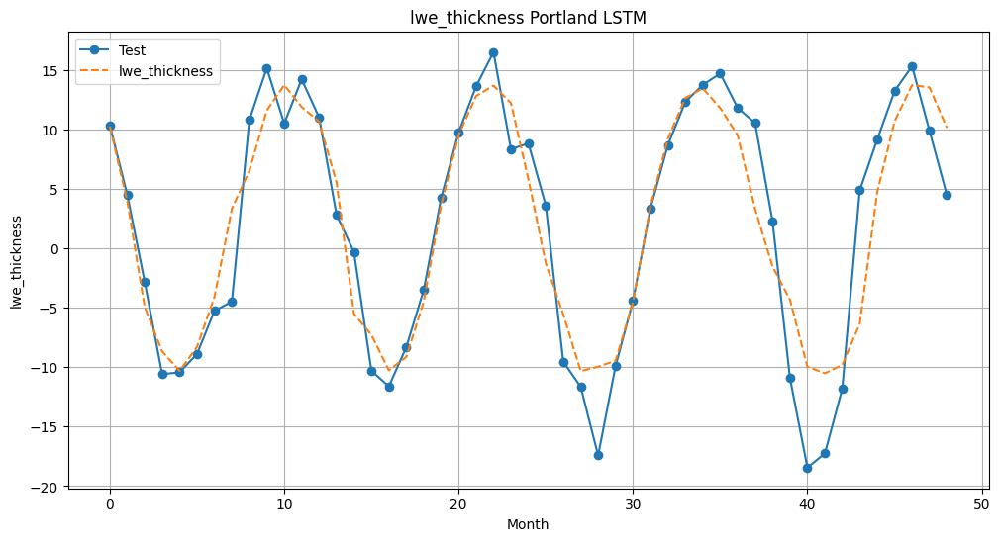

mse
[[13.74842072]
 [15.45898819]
 [14.67596531]
 [14.33806038]
 [12.39009094]
 [13.65500927]
 [14.51620388]
 [14.97980022]
 [13.40952969]
 [13.49246311]
 [11.59267712]
 [14.10684109]
 [14.42533493]
 [13.88273525]
 [14.11435223]
 [13.28382301]
 [13.12996864]
 [12.81878757]
 [15.53336239]
 [13.31550217]
 [10.82600212]
 [11.34775734]
 [12.69550514]
 [13.87721062]
 [13.75223541]
 [15.97348785]
 [12.87711239]
 [14.07844162]
 [14.3041954 ]
 [14.09300804]
 [13.575737  ]
 [12.12885761]
 [12.00566959]
 [14.95470715]
 [14.56416035]
 [14.19464493]
 [12.8115797 ]
 [13.87696457]
 [14.01565742]
 [14.90216827]
 [15.17504406]
 [15.10246181]
 [12.49920273]
 [13.12373447]
 [13.70411873]
 [13.78656864]
 [12.84215546]
 [12.7301569 ]
 [15.11052799]
 [13.81518459]
 [15.20920944]
 [13.62432575]
 [15.89604473]
 [14.35951042]
 [11.80285645]
 [10.97081852]
 [10.44438744]
 [11.46223164]
 [10.41103363]
 [14.62381172]
 [13.9469986 ]
 [13.52308655]
 [14.73701191]
 [15.43098164]
 [12.93975067]
 [ 9.84179783]
 [10.7

In [ ]:
#### Portland ######
##### Lon: 236-240    Lat: 44-47  ****** LSTM ******
##### j= 176-184   540-550
#### k= 946-957

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error


number=0
x=np.zeros((110,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:

    for j in np.arange(540,550):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(946,957):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

#print(x)

#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)

#print(xxx)
sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=xxx[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]
    #print(y_test)
    #print(len(y_test))
    # Create and train the LSTM model
    model = Sequential([
    LSTM(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)

plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Portland LSTM')
plt.grid(True)
plt.show()

print('mse')
print(mse)
print('r2')
print(r2)
print('mae')
print(mae)


Streaming output truncated to the last 5000 lines.
5/5 [==============================] - 0s 27ms/step - loss: 33.5093 - val_loss: 63.6146
Epoch 27/50
5/5 [==============================] - 0s 25ms/step - loss: 31.9515 - val_loss: 62.4586
Epoch 28/50
5/5 [==============================] - 0s 22ms/step - loss: 30.7680 - val_loss: 61.0184
Epoch 29/50
5/5 [==============================] - 0s 23ms/step - loss: 29.5459 - val_loss: 60.1897
Epoch 30/50
5/5 [==============================] - 0s 23ms/step - loss: 28.5067 - val_loss: 59.2540
Epoch 31/50
5/5 [==============================] - 0s 23ms/step - loss: 27.6579 - val_loss: 58.4704
Epoch 32/50
5/5 [==============================] - 0s 23ms/step - loss: 26.8873 - val_loss: 57.3376
Epoch 33/50
5/5 [==============================] - 0s 32ms/step - loss: 25.8589 - val_loss: 55.7202
Epoch 34/50
5/5 [==============================] - 0s 29ms/step - loss: 24.8334 - val_loss: 54.9351
Epoch 35/50
5/5 [==============================] - 0s 25ms/st

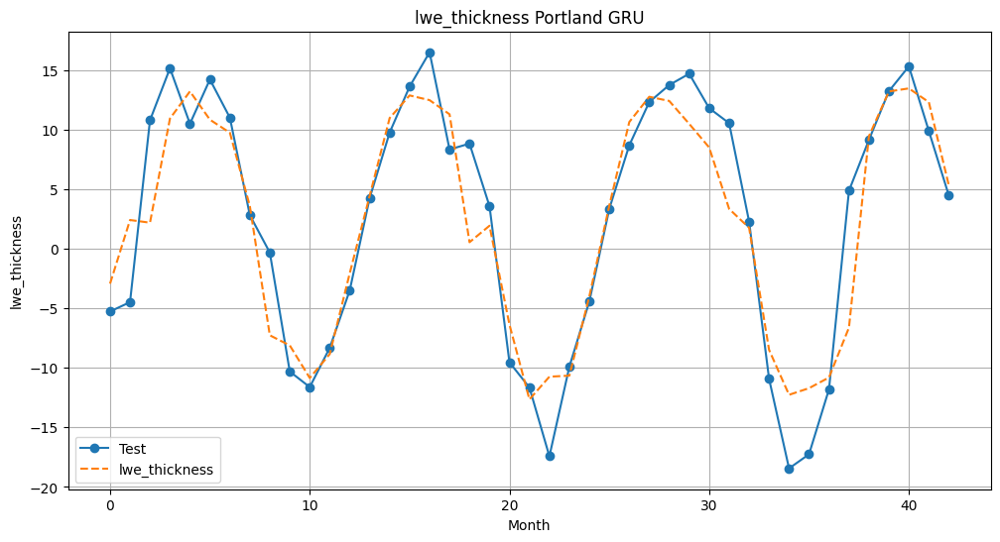

[[16.02169228]
 [14.8457756 ]
 [17.42090607]
 [18.2450695 ]
 [15.38281345]
 [16.61558723]
 [14.72368431]
 [14.97050476]
 [14.87159443]
 [14.817523  ]
 [15.3143959 ]
 [18.80904007]
 [18.99755287]
 [16.84033394]
 [18.39551735]
 [15.01270199]
 [15.47899818]
 [14.65817642]
 [15.12374973]
 [15.62644672]
 [15.81976986]
 [15.03324032]
 [19.22815132]
 [16.59836769]
 [15.99097061]
 [18.44380569]
 [16.88998413]
 [14.62591267]
 [17.22573853]
 [14.31481552]
 [13.94532394]
 [14.70129395]
 [14.01574421]
 [16.34552765]
 [18.71551514]
 [15.37209892]
 [16.63282013]
 [15.54331779]
 [13.98023891]
 [16.05223846]
 [17.32718849]
 [14.90748501]
 [14.19138336]
 [16.24565506]
 [16.5734005 ]
 [18.36449623]
 [17.29523087]
 [17.8339119 ]
 [14.09181118]
 [14.82627964]
 [14.88378525]
 [14.44987297]
 [15.32034397]
 [17.53839874]
 [15.77352715]
 [14.04962063]
 [16.56108856]
 [15.44519997]
 [13.70018005]
 [13.9540062 ]
 [14.289711  ]
 [13.67922497]
 [13.5330267 ]
 [12.97192287]
 [14.50678635]
 [13.83884048]
 [12.54178

AttributeError: ignored

In [ ]:
#### Portland ######
##### Lon: 236-240    Lat: 44-47  ****** GRU ******
##### j= 176-184     540-550
#### k= 946-957

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

number=0
x=np.zeros((110,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:
    # Read data into a DataFrame

    for j in np.arange(540,550):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(946,957):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

#print(x)

#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)


sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=x[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]

    # Create and train the LSTM model
    model = Sequential([
    GRU(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)


plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Portland GRU')
plt.grid(True)
plt.show()

print(mse)
print(r2)
print(mae)

#df1 = pd.DataFrame(lwe_thickness_data, columns=rootgrp.variables['lon'][:], index=rootgrp.variables['lat'][:])

excel_file_path1 = '/content/drive/MyDrive/Colab Notebooks/Regions/Portland/mse_with_Missing_Values.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Regions/Portland/r2_with_Missing_Values.xlsx'
excel_file_path3 = '/content/drive/MyDrive/Colab Notebooks/Regions/Portland/mae_with_Missing_Values.xlsx'

#df.to_excel(excel_file_path)
mse.to_excel(excel_file_path1)
r2.to_excel(excel_file_path2)
mae.to_excel(excel_file_path3)


Streaming output truncated to the last 5000 lines.
5/5 [==============================] - 0s 26ms/step - loss: 75.0266 - val_loss: 107.6515
Epoch 27/50
5/5 [==============================] - 0s 30ms/step - loss: 72.7242 - val_loss: 105.3579
Epoch 28/50
5/5 [==============================] - 0s 26ms/step - loss: 70.6532 - val_loss: 102.7752
Epoch 29/50
5/5 [==============================] - 0s 23ms/step - loss: 68.6990 - val_loss: 100.7187
Epoch 30/50
5/5 [==============================] - 0s 26ms/step - loss: 66.8272 - val_loss: 98.9691
Epoch 31/50
5/5 [==============================] - 0s 22ms/step - loss: 65.0109 - val_loss: 97.4513
Epoch 32/50
5/5 [==============================] - 0s 26ms/step - loss: 63.4177 - val_loss: 96.3726
Epoch 33/50
5/5 [==============================] - 0s 22ms/step - loss: 62.0976 - val_loss: 95.3794
Epoch 34/50
5/5 [==============================] - 0s 22ms/step - loss: 60.5154 - val_loss: 94.0090
Epoch 35/50
5/5 [==============================] - 0s 27m

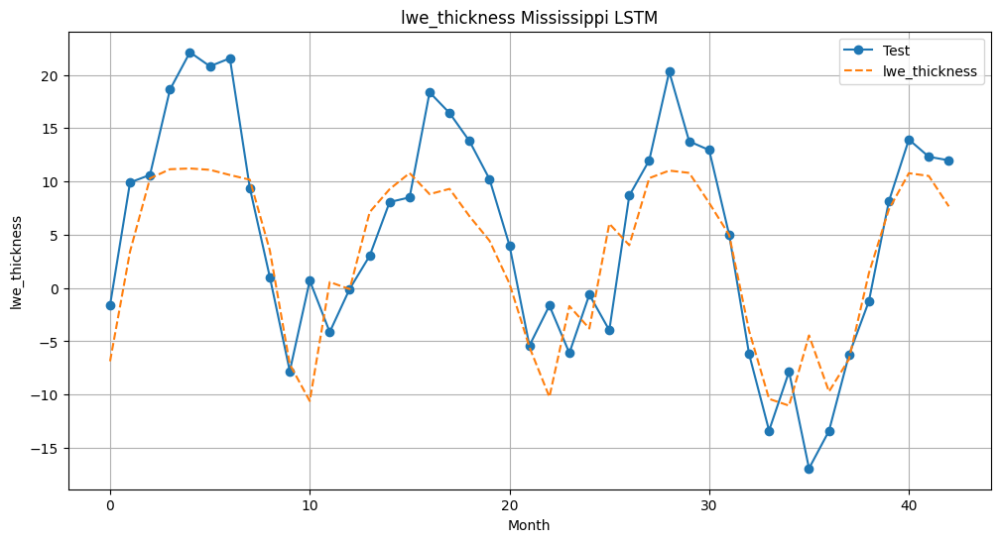

[[ 68.29612732]
 [ 71.70345306]
 [ 76.24552917]
 [ 74.36870575]
 [ 34.72388077]
 [ 34.56650162]
 [ 39.72055435]
 [ 38.5399704 ]
 [ 28.3459301 ]
 [ 25.94255257]
 [ 29.58513641]
 [ 24.9290657 ]
 [ 37.89208603]
 [ 74.72458649]
 [ 62.32450867]
 [ 71.34164429]
 [ 68.80898285]
 [ 19.36833954]
 [ 20.17078018]
 [ 18.37976074]
 [ 19.50662041]
 [ 26.65334892]
 [ 25.06774139]
 [ 26.45924187]
 [ 26.03452682]
 [ 24.85150528]
 [ 75.85430145]
 [ 77.12166595]
 [ 72.62778473]
 [ 71.68868256]
 [ 19.57801819]
 [ 17.90792274]
 [ 18.05273247]
 [ 19.5479908 ]
 [ 26.45335007]
 [ 24.46405983]
 [ 28.18256378]
 [ 23.9156208 ]
 [ 26.04991913]
 [ 72.31482697]
 [ 62.83574295]
 [ 68.49719238]
 [ 80.20160675]
 [ 20.71236038]
 [ 19.13890266]
 [ 19.94316483]
 [ 19.96101761]
 [ 26.4510479 ]
 [ 25.58129311]
 [ 25.74909973]
 [ 26.20720482]
 [ 35.08293152]
 [125.44834137]
 [ 83.4352417 ]
 [ 83.03422546]
 [ 83.24196625]
 [ 84.58876801]
 [ 19.79597282]
 [ 18.94299889]
 [ 37.15927505]
 [ 42.42582321]
 [ 42.46847534]
 [ 45.36

AttributeError: ignored

In [ ]:
#### Mississippi #####
#### Lon: 268-272    Lat: 30-35     ****** LSTM ******
##### j= 225-241   484-501
#### k= 1074-1087

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

number=0
x=np.zeros((221,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:
    # Read data into a DataFrame

    for j in np.arange(484,501):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(1074,1087):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

#print(x)

#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)


sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=x[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]

    model = Sequential([
    LSTM(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)


plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Mississippi LSTM')
plt.grid(True)
plt.show()

print(mse)
print(r2)
print(mae)

excel_file_path1 = '/content/drive/MyDrive/Colab Notebooks/Regions/Mississippi/mse_LSTM_with_Missing_Values.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Regions/Mississippi/r2_LSTM_with_Missing_Values.xlsx'
excel_file_path3 = '/content/drive/MyDrive/Colab Notebooks/Regions/Mississippi/mae_LSTM_with_Missing_Values.xlsx'

#df.to_excel(excel_file_path)
mse.to_excel(excel_file_path1)
r2.to_excel(excel_file_path2)
mae.to_excel(excel_file_path3)

Streaming output truncated to the last 5000 lines.
5/5 [==============================] - 0s 37ms/step - loss: 48.4007 - val_loss: 89.7961
Epoch 27/50
5/5 [==============================] - 0s 36ms/step - loss: 47.0836 - val_loss: 88.3092
Epoch 28/50
5/5 [==============================] - 0s 36ms/step - loss: 45.8152 - val_loss: 86.6070
Epoch 29/50
5/5 [==============================] - 0s 46ms/step - loss: 44.6866 - val_loss: 85.0280
Epoch 30/50
5/5 [==============================] - 0s 38ms/step - loss: 43.5846 - val_loss: 83.4570
Epoch 31/50
5/5 [==============================] - 0s 42ms/step - loss: 42.6876 - val_loss: 82.3676
Epoch 32/50
5/5 [==============================] - 0s 48ms/step - loss: 42.0372 - val_loss: 81.5764
Epoch 33/50
5/5 [==============================] - 0s 38ms/step - loss: 41.2486 - val_loss: 80.8124
Epoch 34/50
5/5 [==============================] - 0s 37ms/step - loss: 40.4089 - val_loss: 80.1118
Epoch 35/50
5/5 [==============================] - 0s 38ms/st

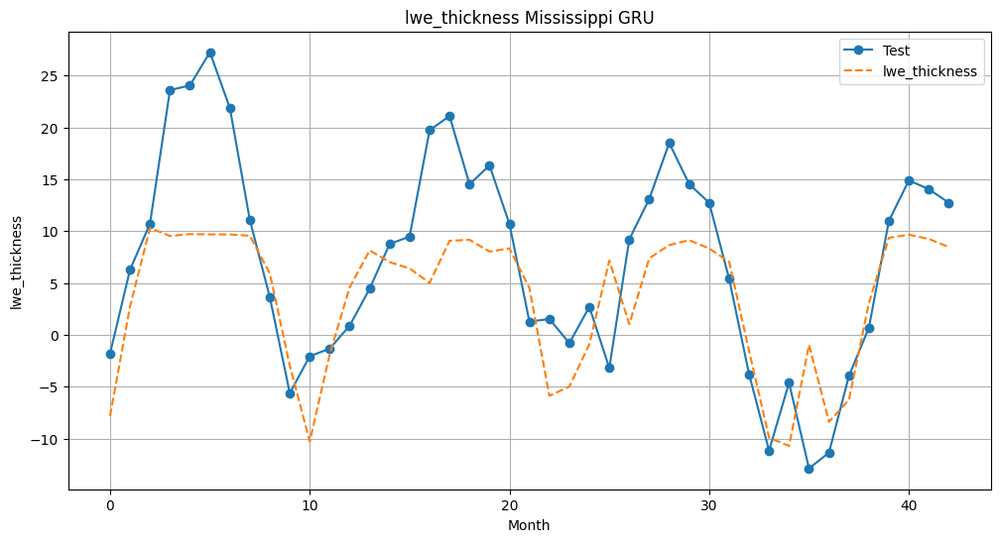

mse
[[ 65.02065277]
 [ 72.16132355]
 [ 76.36001587]
 [ 37.45054245]
 [ 40.43361282]
 [ 40.10448837]
 [ 41.79838181]
 [ 25.76036263]
 [ 29.77526855]
 [ 27.19157028]
 [ 63.59672546]
 [ 66.26561737]
 [ 65.81906128]
 [ 18.65112686]
 [ 20.06640434]
 [ 20.40726852]
 [ 19.53736496]
 [ 28.00165176]
 [ 29.09798241]
 [ 27.76361465]
 [ 68.56230164]
 [ 69.04970551]
 [ 73.29003143]
 [ 19.209692  ]
 [ 19.86346626]
 [ 19.18588257]
 [ 19.72536087]
 [ 28.23905563]
 [ 26.97742271]
 [ 27.54559708]
 [ 67.96590424]
 [ 67.0091629 ]
 [ 63.37197876]
 [ 19.95352936]
 [ 21.39365768]
 [ 19.82139206]
 [ 18.93751717]
 [ 26.83627319]
 [ 26.07081795]
 [ 29.66448593]
 [ 78.88475037]
 [ 83.17926788]
 [ 78.82704163]
 [ 87.28713989]
 [ 22.22761726]
 [ 20.997715  ]
 [ 44.2070961 ]
 [ 43.49670029]
 [ 42.09942627]
 [ 47.92746353]
 [ 92.23054504]
 [ 93.01275635]
 [ 81.49306488]
 [ 79.64564514]
 [ 94.03804016]
 [ 43.88814163]
 [ 45.2200737 ]
 [ 45.39199829]
 [ 51.15202713]
 [ 47.25991058]
 [ 91.51765442]
 [ 84.71076965]
 [ 7

In [ ]:
#### Mississippi #####
#### Lon: 268-272    Lat: 30-35     ****** GRU ******
##### j= 225-241     484-495
#### k= 1075-1085


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

number=0
x=np.zeros((110,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:

    for j in np.arange(484,495):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(1075,1085):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

#print(x)

#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)


sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=x[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]

    model = Sequential([
    GRU(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)



plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Mississippi GRU')
plt.grid(True)
plt.show()

print('mse')
print(mse)
print('r2')
print(r2)
print('mae')
print(mae)

excel_file_path1 = '/content/drive/MyDrive/Colab Notebooks/Regions/Mississippi/mse_GRU_with_Missing_Values.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Regions/Mississippi/r2_GRU_with_Missing_Values.xlsx'
excel_file_path3 = '/content/drive/MyDrive/Colab Notebooks/Regions/Mississippi/mae_GRU_with_Missing_Values.xlsx'

#df.to_excel(excel_file_path)
#mse.to_excel(excel_file_path1)
#r2.to_excel(excel_file_path2)
#mae.to_excel(excel_file_path3)

Epoch 1/50
5/5 [==============================] - 4s 184ms/step - loss: 9.2904 - val_loss: 18.8909
Epoch 2/50
5/5 [==============================] - 0s 13ms/step - loss: 8.2815 - val_loss: 16.4217
Epoch 3/50
5/5 [==============================] - 0s 14ms/step - loss: 7.2239 - val_loss: 14.8167
Epoch 4/50
5/5 [==============================] - 0s 17ms/step - loss: 6.7190 - val_loss: 13.5015
Epoch 5/50
5/5 [==============================] - 0s 13ms/step - loss: 6.1676 - val_loss: 12.7048
Epoch 6/50
5/5 [==============================] - 0s 17ms/step - loss: 5.7786 - val_loss: 12.2652
Epoch 7/50
5/5 [==============================] - 0s 13ms/step - loss: 5.4024 - val_loss: 12.1802
Epoch 8/50
5/5 [==============================] - 0s 13ms/step - loss: 5.1117 - val_loss: 12.0957
Epoch 9/50
5/5 [==============================] - 0s 17ms/step - loss: 4.8509 - val_loss: 12.0069
Epoch 10/50
5/5 [==============================] - 0s 13ms/step - loss: 4.7011 - val_loss: 12.1222
Epoch 11/50
5/5 [=

2/2 [==============================] - 1s 10ms/step
Epoch 1/50
5/5 [==============================] - 4s 213ms/step - loss: 13.3715 - val_loss: 12.6320
Epoch 2/50
5/5 [==============================] - 0s 23ms/step - loss: 11.4829 - val_loss: 11.0627
Epoch 3/50
5/5 [==============================] - 0s 23ms/step - loss: 9.8257 - val_loss: 9.8530
Epoch 4/50
5/5 [==============================] - 0s 22ms/step - loss: 8.5408 - val_loss: 9.1607
Epoch 5/50
5/5 [==============================] - 0s 24ms/step - loss: 7.6609 - val_loss: 8.9135
Epoch 6/50
5/5 [==============================] - 0s 20ms/step - loss: 7.0291 - val_loss: 8.8639
Epoch 7/50
5/5 [==============================] - 0s 21ms/step - loss: 6.5722 - val_loss: 8.8024
Epoch 8/50
5/5 [==============================] - 0s 21ms/step - loss: 6.1617 - val_loss: 8.6303
Epoch 9/50
5/5 [==============================] - 0s 24ms/step - loss: 5.7798 - val_loss: 8.4328
Epoch 10/50
5/5 [==============================] - 0s 20ms/step - loss

Streaming output truncated to the last 5000 lines.
5/5 [==============================] - 0s 24ms/step - loss: 29.8412 - val_loss: 20.8862
Epoch 27/50
5/5 [==============================] - 0s 23ms/step - loss: 28.6237 - val_loss: 21.0441
Epoch 28/50
5/5 [==============================] - 0s 23ms/step - loss: 27.6455 - val_loss: 20.8428
Epoch 29/50
5/5 [==============================] - 0s 22ms/step - loss: 26.6288 - val_loss: 20.7033
Epoch 30/50
5/5 [==============================] - 0s 22ms/step - loss: 25.7262 - val_loss: 20.5006
Epoch 31/50
5/5 [==============================] - 0s 27ms/step - loss: 24.8562 - val_loss: 20.3531
Epoch 32/50
5/5 [==============================] - 0s 24ms/step - loss: 24.1569 - val_loss: 20.2915
Epoch 33/50
5/5 [==============================] - 0s 20ms/step - loss: 23.4127 - val_loss: 20.5999
Epoch 34/50
5/5 [==============================] - 0s 23ms/step - loss: 22.6510 - val_loss: 21.0470
Epoch 35/50
5/5 [==============================] - 0s 24ms/st

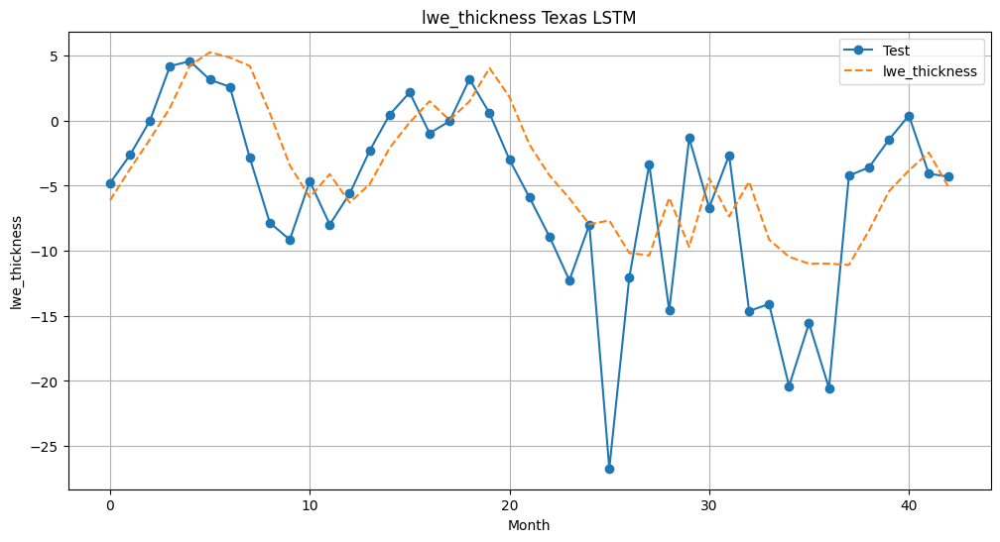

[[ 27.16649818]
 [ 19.55672073]
 [ 15.31545544]
 [ 15.84249115]
 [ 14.05614376]
 [ 13.79027653]
 [ 13.3929739 ]
 [ 14.24617767]
 [ 13.58050919]
 [ 13.22958851]
 [ 13.59082985]
 [ 13.87219238]
 [ 11.53855896]
 [ 11.73437595]
 [ 11.88276482]
 [ 12.88303947]
 [ 12.54284668]
 [ 12.6704483 ]
 [ 12.88518143]
 [ 12.42542171]
 [ 29.55454826]
 [ 15.63277817]
 [ 15.45247173]
 [ 15.21594143]
 [ 15.9412775 ]
 [ 13.96925831]
 [ 14.48391628]
 [ 13.54323673]
 [ 12.8728056 ]
 [ 13.31524372]
 [ 13.63848591]
 [ 13.09766006]
 [ 13.16048717]
 [ 13.17617989]
 [ 13.15756989]
 [ 13.78570843]
 [ 12.22744846]
 [ 12.46202755]
 [ 12.54007435]
 [ 13.74422455]
 [ 28.36671257]
 [ 14.26920605]
 [ 15.30360126]
 [ 15.74358177]
 [ 15.09208965]
 [ 10.27026081]
 [ 10.19811058]
 [ 10.26549625]
 [ 13.37115383]
 [ 13.15716839]
 [ 13.66389179]
 [ 13.33005524]
 [ 13.64045906]
 [ 13.41351032]
 [ 14.02642155]
 [ 13.51952839]
 [ 13.74466991]
 [ 16.45751381]
 [ 15.96590996]
 [ 16.14911652]
 [ 23.58953094]
 [ 15.52855015]
 [ 14.99

In [ ]:
#### Texas
#### Lon: 255-265    Lat: 30-35  ****** LSTM ******
##### j= 228-239     486-497
#### k= 1035-1045


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

number=0
x=np.zeros((400,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:

    for j in np.arange(476,496):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(1028,1048):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

#print(x)

#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)


sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=x[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]

    model = Sequential([
    LSTM(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)



plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Texas LSTM')
plt.grid(True)
plt.show()

print(mse)
print(r2)
print(mae)

excel_file_path1 = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/mse_LSTM_with_Missing_Values.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/r2_LSTM_with_Missing_Values.xlsx'
excel_file_path3 = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/mae_LSTM_with_Missing_Values.xlsx'

#df.to_excel(excel_file_path)
#mse.to_excel(excel_file_path1)
#r2.to_excel(excel_file_path2)
#mae.to_excel(excel_file_path3)

Streaming output truncated to the last 5000 lines.
Epoch 13/50
5/5 [==============================] - 0s 23ms/step - loss: 40.7388 - val_loss: 32.4217
Epoch 14/50
5/5 [==============================] - 0s 29ms/step - loss: 39.2140 - val_loss: 31.7335
Epoch 15/50
5/5 [==============================] - 0s 27ms/step - loss: 37.8754 - val_loss: 31.2889
Epoch 16/50
5/5 [==============================] - 0s 23ms/step - loss: 36.5502 - val_loss: 30.9961
Epoch 17/50
5/5 [==============================] - 0s 23ms/step - loss: 35.4058 - val_loss: 30.8077
Epoch 18/50
5/5 [==============================] - 0s 26ms/step - loss: 34.1163 - val_loss: 30.4283
Epoch 19/50
5/5 [==============================] - 0s 28ms/step - loss: 33.0330 - val_loss: 30.1388
Epoch 20/50
5/5 [==============================] - 0s 29ms/step - loss: 31.9076 - val_loss: 29.8367
Epoch 21/50
5/5 [==============================] - 0s 27ms/step - loss: 30.9994 - val_loss: 29.5671
Epoch 22/50
5/5 [==============================] 

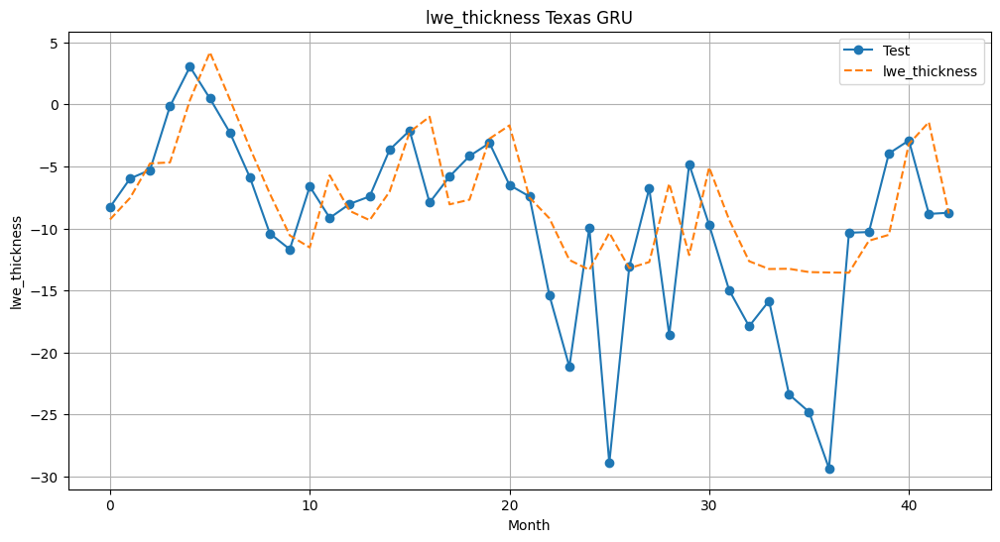

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



[[ 7.78851748]
 [ 7.91579294]
 [ 8.0487318 ]
 [14.5721693 ]
 [15.68325329]
 [14.59966373]
 [14.77989197]
 [14.75867081]
 [23.88820076]
 [23.13331604]
 [14.91823292]
 [14.15296268]
 [14.84172153]
 [14.36797237]
 [15.17174625]
 [15.1084156 ]
 [15.07002258]
 [15.08552742]
 [24.44925308]
 [23.45038223]
 [14.14735985]
 [14.65596294]
 [14.5307579 ]
 [14.39131355]
 [14.63743019]
 [14.76034355]
 [15.08223248]
 [24.24811172]
 [23.65635681]
 [24.45347977]
 [15.57148457]
 [15.00813198]
 [14.4461031 ]
 [14.16058064]
 [15.0575552 ]
 [25.23418999]
 [25.68923378]
 [26.44836617]
 [23.75102425]
 [23.69529915]
 [29.09514427]
 [15.11955547]
 [14.93634129]
 [15.01728821]
 [13.91747379]
 [26.24370384]
 [26.55700874]
 [25.37427902]
 [26.57781792]
 [26.63508034]
 [28.33217621]
 [14.87350368]
 [14.48675632]
 [15.0983305 ]
 [25.81363487]
 [26.31292915]
 [26.56197166]
 [24.5917263 ]
 [25.90721321]
 [26.92196655]
 [30.79925156]
 [30.76454353]
 [31.47589493]
 [32.39019394]
 [28.08327675]
 [25.72020912]
 [26.14041

In [ ]:
#### Texas
#### Lon: 255-265    Lat: 30-35  ****** GRU ******
##### j= 225-241      484-501
#### k= 1022-1059

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

number=0
x=np.zeros((110,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:

    for j in np.arange(476,496):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(1028,1048):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

print(x)

#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)


sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=x[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]

    model = Sequential([
    GRU(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)


plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness Texas GRU')
plt.grid(True)
plt.show()

print(mse)
print(r2)
print(mae)

excel_file_path1 = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/mse_GRU_with_Missing_Values.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/r2_GRU_with_Missing_Values.xlsx'
excel_file_path3 = '/content/drive/MyDrive/Colab Notebooks/Regions/Texas/mae_GRU_with_Missing_Values.xlsx'

#df.to_excel(excel_file_path)
mse.to_excel(excel_file_path1)
r2.to_excel(excel_file_path2)
mae.to_excel(excel_file_path3)

Epoch 1/50
5/5 [==============================] - 3s 141ms/step - loss: 1.0045 - val_loss: 1.9720
Epoch 2/50
5/5 [==============================] - 0s 17ms/step - loss: 0.9797 - val_loss: 1.9555
Epoch 3/50
5/5 [==============================] - 0s 18ms/step - loss: 0.9615 - val_loss: 1.9426
Epoch 4/50
5/5 [==============================] - 0s 14ms/step - loss: 0.9466 - val_loss: 1.9319
Epoch 5/50
5/5 [==============================] - 0s 20ms/step - loss: 0.9343 - val_loss: 1.9188
Epoch 6/50
5/5 [==============================] - 0s 19ms/step - loss: 0.9241 - val_loss: 1.9023
Epoch 7/50
5/5 [==============================] - 0s 18ms/step - loss: 0.9085 - val_loss: 1.8836
Epoch 8/50
5/5 [==============================] - 0s 20ms/step - loss: 0.8964 - val_loss: 1.8658
Epoch 9/50
5/5 [==============================] - 0s 20ms/step - loss: 0.8829 - val_loss: 1.8477
Epoch 10/50
5/5 [==============================] - 0s 24ms/step - loss: 0.8683 - val_loss: 1.8312
Epoch 11/50
5/5 [===========

2/2 [==============================] - 1s 11ms/step
Epoch 1/50
5/5 [==============================] - 3s 133ms/step - loss: 2.0517 - val_loss: 2.9745
Epoch 2/50
5/5 [==============================] - 0s 14ms/step - loss: 1.9728 - val_loss: 2.9154
Epoch 3/50
5/5 [==============================] - 0s 14ms/step - loss: 1.9069 - val_loss: 2.8293
Epoch 4/50
5/5 [==============================] - 0s 15ms/step - loss: 1.8500 - val_loss: 2.7438
Epoch 5/50
5/5 [==============================] - 0s 19ms/step - loss: 1.7946 - val_loss: 2.6111
Epoch 6/50
5/5 [==============================] - 0s 15ms/step - loss: 1.7505 - val_loss: 2.4850
Epoch 7/50
5/5 [==============================] - 0s 15ms/step - loss: 1.7055 - val_loss: 2.4295
Epoch 8/50
5/5 [==============================] - 0s 18ms/step - loss: 1.6596 - val_loss: 2.3608
Epoch 9/50
5/5 [==============================] - 0s 18ms/step - loss: 1.6170 - val_loss: 2.3114
Epoch 10/50
5/5 [==============================] - 0s 18ms/step - loss: 1.

Streaming output truncated to the last 5000 lines.
5/5 [==============================] - 0s 32ms/step - loss: 1.2923 - val_loss: 1.4913
Epoch 27/50
5/5 [==============================] - 0s 27ms/step - loss: 1.2534 - val_loss: 1.4265
Epoch 28/50
5/5 [==============================] - 0s 27ms/step - loss: 1.2207 - val_loss: 1.5489
Epoch 29/50
5/5 [==============================] - 0s 27ms/step - loss: 1.1992 - val_loss: 1.5839
Epoch 30/50
5/5 [==============================] - 0s 30ms/step - loss: 1.2000 - val_loss: 1.5214
Epoch 31/50
5/5 [==============================] - 0s 29ms/step - loss: 1.1794 - val_loss: 1.5044
Epoch 32/50
5/5 [==============================] - 0s 31ms/step - loss: 1.1428 - val_loss: 1.6197
Epoch 33/50
5/5 [==============================] - 0s 33ms/step - loss: 1.1270 - val_loss: 1.6415
Epoch 34/50
5/5 [==============================] - 0s 27ms/step - loss: 1.1247 - val_loss: 1.5735
Epoch 35/50
5/5 [==============================] - 0s 33ms/step - loss: 1.1191 

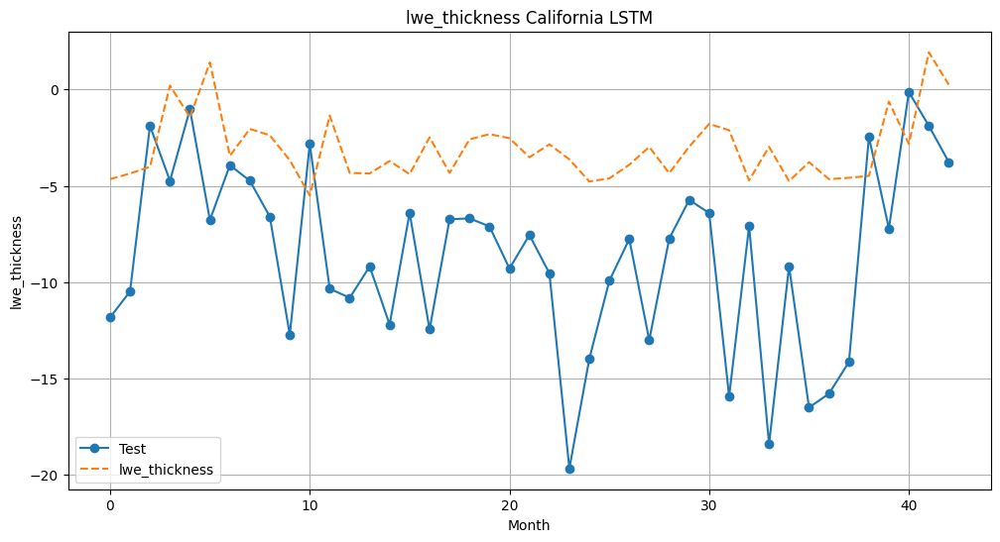

[[ 0.92235672]
 [ 0.95082474]
 [ 0.92694747]
 [ 0.90134454]
 [ 1.64772296]
 [ 1.30066133]
 [ 1.7584337 ]
 [ 1.70253325]
 [ 1.64687884]
 [ 1.72746813]
 [ 0.94878811]
 [ 0.9698751 ]
 [ 0.96459854]
 [ 1.52259743]
 [ 1.67775774]
 [ 1.50884569]
 [ 1.68736982]
 [ 1.72881925]
 [ 1.53725982]
 [ 1.61427128]
 [ 0.92033172]
 [ 0.95274496]
 [ 1.01467133]
 [ 1.27734005]
 [ 1.27627349]
 [ 1.49562216]
 [ 1.68309033]
 [ 1.40662611]
 [ 1.47214174]
 [ 1.54228532]
 [ 1.14641237]
 [ 1.11224067]
 [ 1.5312649 ]
 [ 1.71619713]
 [ 1.18949389]
 [ 1.32803214]
 [ 1.69070482]
 [ 2.1317451 ]
 [ 2.47598791]
 [ 1.85923755]
 [ 1.19049799]
 [ 1.14136398]
 [ 1.37627566]
 [ 1.47531617]
 [ 1.31730175]
 [ 1.79082119]
 [ 1.19111919]
 [ 2.24881148]
 [ 2.32666969]
 [ 1.88273144]
 [ 1.30426645]
 [ 1.10006142]
 [ 1.05384362]
 [ 1.33453894]
 [ 4.26421785]
 [ 3.6068697 ]
 [ 3.36594725]
 [ 2.5562067 ]
 [ 2.09418583]
 [ 2.00004864]
 [ 1.27860963]
 [ 0.92700189]
 [ 1.13704813]
 [ 4.63997841]
 [ 3.33308101]
 [ 2.95160151]
 [ 4.65277

In [ ]:
#### California ####
#### Lon: 238-245    Lat: 24-42  ****** LSTM ******
##### j= 193-263   485-505
#### k= 960-970

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

number=0
x=np.zeros((100,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:

    for j in np.arange(485,495):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(960,970):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

#print(x)

#Intering Missing values
Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)


sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=x[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]

    model = Sequential([
    LSTM(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)


plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')
plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness California LSTM')
plt.grid(True)
plt.show()

print(mse)
print(r2)
print(mae)

excel_file_path1 = '/content/drive/MyDrive/Colab Notebooks/Regions/California/mse_LSTM_with_Missing_Values.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Regions/California/r2_LSTM_with_Missing_Values.xlsx'
excel_file_path3 = '/content/drive/MyDrive/Colab Notebooks/Regions/California/mae_LSTM_with_Missing_Values.xlsx'

#df.to_excel(excel_file_path)
#mse.to_excel(excel_file_path1)
#r2.to_excel(excel_file_path2)
#mae.to_excel(excel_file_path3)


Streaming output truncated to the last 5000 lines.
5/5 [==============================] - 0s 27ms/step - loss: 15.1391 - val_loss: 64.8844
Epoch 27/50
5/5 [==============================] - 0s 25ms/step - loss: 14.7459 - val_loss: 62.8034
Epoch 28/50
5/5 [==============================] - 0s 23ms/step - loss: 14.4596 - val_loss: 60.7285
Epoch 29/50
5/5 [==============================] - 0s 22ms/step - loss: 14.1215 - val_loss: 59.1367
Epoch 30/50
5/5 [==============================] - 0s 23ms/step - loss: 13.8523 - val_loss: 57.8495
Epoch 31/50
5/5 [==============================] - 0s 26ms/step - loss: 13.6632 - val_loss: 56.3960
Epoch 32/50
5/5 [==============================] - 0s 29ms/step - loss: 13.3896 - val_loss: 55.8638
Epoch 33/50
5/5 [==============================] - 0s 25ms/step - loss: 13.1825 - val_loss: 55.2710
Epoch 34/50
5/5 [==============================] - 0s 25ms/step - loss: 12.9479 - val_loss: 55.1686
Epoch 35/50
5/5 [==============================] - 0s 28ms/st

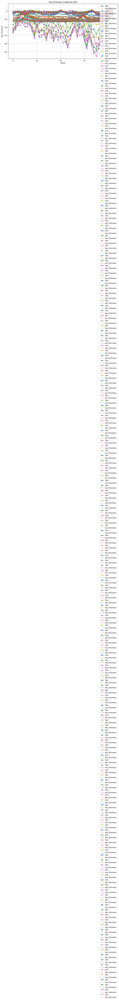

[[  0.80742174]
 [  0.84368646]
 [  0.86044443]
 [  0.78852063]
 [  1.52761912]
 [  1.68204689]
 [  1.79144824]
 [  1.71329129]
 [  1.78491783]
 [  1.97523463]
 [  0.84992731]
 [  0.81551176]
 [  0.96129262]
 [  1.66745758]
 [  1.40045738]
 [  1.46247494]
 [  1.51918793]
 [  1.64060903]
 [  1.77716613]
 [  1.70396578]
 [  0.91101795]
 [  0.82877278]
 [  0.85682058]
 [  1.53973424]
 [  1.54807901]
 [  1.40289116]
 [  1.51696002]
 [  1.52999866]
 [  1.68541753]
 [  1.81481719]
 [  1.33581376]
 [  1.4875015 ]
 [  1.48120737]
 [  1.67176557]
 [  1.88605022]
 [  1.62843871]
 [  1.48318219]
 [  2.56241655]
 [  2.19534159]
 [  2.63726401]
 [  1.49765921]
 [  1.06701076]
 [  1.49123573]
 [  1.49006581]
 [  1.60300016]
 [  1.65638518]
 [  1.43700826]
 [  2.15231848]
 [  2.72202611]
 [  2.67309427]
 [  1.34081519]
 [  1.32598925]
 [  1.39166367]
 [  1.3279072 ]
 [  3.41975784]
 [  3.29945874]
 [  3.54679298]
 [  2.55305004]
 [  2.71825719]
 [  2.50504613]
 [  1.45515704]
 [  1.37810254]
 [  1.36

In [ ]:
#### California ####
#### Lon: 238-245    Lat: 24-42  ****** GRU ******
##### j= 200-250   485-505
#### k= 960-970

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

number=0
x=np.zeros((200,221))
#print(len(x))
# Open the NetCDF file and extract data
with nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc', 'r') as rootgrp:

    for j in np.arange(485,505):      # j and k are dependant on geographical coordinates and must be adjusted according to them
        for k in np.arange(960,970):
            for i in range(221):
                x[number][i]= rootgrp.variables['lwe_thickness'][i,j:j+1,k:k+1]
            number=number+1

#print(x)

Missed_values=['2','3','14','105','110','121','126','131','136','137','142','147','152','158','162','163','168','173','174','178','183','184','185','186','187','188','189','190','191','192','193','196','197']
xxx=np.zeros((number-1,254))

for i in range(number-1):
       counter_1=0
       counter_2=0
       for j in range(254):
           if  counter_1< len(Missed_values):
               if j== int(Missed_values[counter_1]):
                  counter_1=counter_1+1
                  #print(counter_1)
                  xxx[i][j]= (xxx[i][j-1]+ xxx[i][j-2])/2
               else:
                  xxx[i][j]=x[i][counter_2]
                  counter_2=counter_2+1
                 # print(counter_2)
           else:
               xxx[i][j]=x[i][counter_2]
               counter_2=counter_2+1
               #print(counter_2)

plt.figure(figsize=(12, 6))
sequence_length=10
batch_size = 32
epochs = 50
mse=np.zeros((number-1,1))
r2=np.zeros((number-1,1))
mae=np.zeros((number-1,1))
for i in range(number-1):
    sequences_x = []
    sequences_y = []
    Xx=x[i][:]
    for j in range(len(Xx)-sequence_length):
        sequence = Xx[j:j+sequence_length]
        sequences_x.append(Xx[j:j+sequence_length])
        sequences_y.append(Xx[j+sequence_length:j+sequence_length+1])
    sequences_x = np.array(sequences_x, dtype=np.float32)
    sequences_y = np.array(sequences_y, dtype=np.float32)
    #print(sequences_x)
    #print(sequences_y)
    train_test_split_ratio = 0.8
    split_index = int(len(sequences_x) * train_test_split_ratio)
    X_train, X_test = sequences_x[:split_index], sequences_x[split_index:]
    y_train, y_test = sequences_y[:split_index], sequences_y[split_index:]

    model = Sequential([
    GRU(50, input_shape=(sequence_length, 1)),
    Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    model.fit(X_train.reshape(-1, sequence_length, 1), y_train, batch_size=batch_size, epochs=epochs, validation_split=0.2)

    y_pred = model.predict(X_test.reshape(-1, sequence_length, 1))

    mse[i][0] = mean_squared_error(y_test, y_pred)

    r2[i][0] = r2_score(y_test, y_pred)

    mae[i][0] = mean_absolute_error(y_test, y_pred)

    plt.plot(range(len(y_test)), y_test, label='Test', marker='o')
    plt.plot(range(len(y_pred)), y_pred, label='lwe_thickness', linestyle='--')




plt.xlabel('Month')
plt.ylabel('lwe_thickness')
plt.legend()
plt.title('lwe_thickness California GRU')
plt.grid(True)
plt.show()

print(mse)
print(r2)
print(mae)

excel_file_path1 = '/content/drive/MyDrive/Colab Notebooks/Regions/California/mse_GRU_with_Missing_Values.xlsx'
excel_file_path2 = '/content/drive/MyDrive/Colab Notebooks/Regions/California/r2_GRU_with_Missing_Values.xlsx'
excel_file_path3 = '/content/drive/MyDrive/Colab Notebooks/Regions/California/mae_GRU_with_Missing_Values.xlsx'

#df.to_excel(excel_file_path)
#mse.to_excel(excel_file_path1)
#r2.to_excel(excel_file_path2)
#mae.to_excel(excel_file_path3)


In [ ]:
# Downloading Data from era5
!pip install cdsapi

  Preparing metadata (setup.py) ... done
  Created wheel for cdsapi: filename=cdsapi-0.6.1-py2.py3-none-any.whl size=12008 sha256=1a93fa7b8f9761bd6cfdddc444656c48f9669d4f2d0f760a43e6bc3cb1d1fa4e
  Stored in directory: /root/.cache/pip/wheels/7c/63/08/45461d6f6636c1aba7846828d8c787a064073945048f76d44a
Successfully built cdsapi


In [ ]:
import cdsapi


url= "https://cds.climate.copernicus.eu/api/v2"
api_key= "257016:c81039df-6cac-4bbd-b68d-adf40e903783"

c = cdsapi.Client(url,api_key)

c.retrieve(
    'reanalysis-era5-single-levels',
    {
        'product_type': 'reanalysis',
        'variable': 'skin_temperature',
        'year': [
            '2006',
        ],
        'month': [
            '01',
        ],
        'day': [
            '01',
        ],
        'time': [
            '00:00',
        ],
        'area': [
            45, -130, 20,
            -80,
        ],
        'format': 'netcdf',
    },
    'download.nc')


2023-10-14 14:33:02,932 INFO Welcome to the CDS
INFO:cdsapi:Welcome to the CDS
2023-10-14 14:33:02,936 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-single-levels
INFO:cdsapi:Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-single-levels
2023-10-14 14:33:03,210 INFO Request is queued
INFO:cdsapi:Request is queued
2023-10-14 14:33:04,335 INFO Request is running
INFO:cdsapi:Request is running
2023-10-14 14:33:05,962 INFO Request is completed
INFO:cdsapi:Request is completed
2023-10-14 14:33:05,970 INFO Downloading https://download-0008-clone.copernicus-climate.eu/cache-compute-0008/cache/data3/adaptor.mars.internal-1697293984.755059-9582-10-4c3fba40-ae96-492d-911d-b11bf62924c8.nc to download.nc (41.9K)
INFO:cdsapi:Downloading https://download-0008-clone.copernicus-climate.eu/cache-compute-0008/cache/data3/adaptor.mars.internal-1697293984.755059-9582-10-4c3fba40-ae96-492d-911d-b11bf62924c8.nc to download.nc 

Result(content_length=42884,content_type=application/x-netcdf,location=https://download-0008-clone.copernicus-climate.eu/cache-compute-0008/cache/data3/adaptor.mars.internal-1697293984.755059-9582-10-4c3fba40-ae96-492d-911d-b11bf62924c8.nc)

In [ ]:
import cdsapi

#url= "https://cds.climate.copernicus.eu/user/257016"
#api_key= "<UID194549>:<c81039df-6cac-4bbd-b68d-adf40e903783>"

url= "https://cds.climate.copernicus.eu/api/v2"
api_key= "257016:c81039df-6cac-4bbd-b68d-adf40e903783"

c = cdsapi.Client(url,api_key)

c.retrieve(
    'reanalysis-era5-single-levels',
    {
        'product_type': 'reanalysis',
        'variable': 'skin_temperature',
        'year': [
            '2012', '2013', '2014',
            '2015', '2016', '2017',
            '2018', '2019', '2020',
            '2021', '2022', '2023',
        ],
        'month': [
            '01', '02', '03',
            '04', '05', '06',
            '07', '08', '09',
            '10', '11', '12',
        ],
        'day': [
            '01', '02', '03',
            '04', '05', '06',
            '07', '08', '09',
            '10', '11', '12',
            '13', '14', '15',
            '16', '17', '18',
            '19', '20', '21',
            '22', '23', '24',
            '25', '26', '27',
            '28', '29', '30',
            '31',
        ],
        'time': [
            '00:00', '01:00', '02:00',
            '03:00', '04:00', '05:00',
            '06:00', '07:00', '08:00',
            '09:00', '10:00', '11:00',
            '12:00', '13:00', '14:00',
            '15:00', '16:00', '17:00',
            '18:00', '19:00', '20:00',
            '21:00', '22:00', '23:00',
        ],
        'area': [
            45, -130, 20,
            -80,
        ],
        'format': 'netcdf',
    },
    'download.nc')


In [ ]:
import netCDF4 as nc
import numpy as np
nc_file = nc.Dataset('/content/extracted_folder/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc','r')
print(nc_file)